In [1]:
import pandas as pd #the csv reading library
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns

from pylab import rcParams
from numpy import diff
from scipy import interpolate
import scipy.stats as stats

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec

import cmocean
import cmocean.cm as cmo
import seaborn as sns


import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

## import data

In [2]:
df_o2 = pd.read_csv('../Dissertation_projects/Data/CTD/O2_Summary_Stats.csv', sep=',', index_col=0)

In [3]:
df_iron = pd.read_csv('../Dissertation_projects/Data/IRON/Iron.csv', sep=',', index_col=0)

#make all the spots labeled NA a nan value
df_iron = df_iron.replace('NA', np.nan)
df_iron = df_iron.replace('NA ', np.nan)

#make all BDL a 0 
df_iron.loc[df_iron['FeT_uM'] == 'BLD', 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] == 'BLD', 'Fe2_uM'] = 0

# convert columns to numeric data type
df_iron['FeT_uM'] = pd.to_numeric(df_iron['FeT_uM'], errors='coerce')
df_iron['Fe2_uM'] = pd.to_numeric(df_iron['Fe2_uM'], errors='coerce')

df_iron['FeT_uM'] = df_iron['FeT_uM'].where(pd.notna(df_iron['FeT_uM']), other=np.nan)
df_iron['Fe2_uM'] = df_iron['Fe2_uM'].where(pd.notna(df_iron['Fe2_uM']), other=np.nan)

#make all negative a 0 
df_iron.loc[df_iron['FeT_uM'] < 0, 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] < 0, 'Fe2_uM'] = 0

#calculate Fe +3 
df_iron['Fe3_uM'] = df_iron['FeT_uM'] - df_iron['Fe2_uM']
df_iron.loc[df_iron['Fe3_uM'] < 0, 'Fe3_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] > df_iron['FeT_uM'], 'Fe3_uM'] = 0
df_iron['Fe3_uM'] = pd.to_numeric(df_iron['Fe3_uM'], errors='coerce')
df_iron['Fe3_uM'] = df_iron['Fe3_uM'].where(pd.notna(df_iron['Fe3_uM']), other=np.nan)

#time feild 
df_iron['Fe2_Time'] = pd.to_numeric(df_iron['Fe2_Time'], errors='coerce')
df_iron['Fe2_Time'] = df_iron['Fe2_Time'].where(pd.notna(df_iron['Fe2_Time']), other=np.nan)

#time feild 
df_iron['FeT_Time'] = pd.to_numeric(df_iron['FeT_Time'], errors='coerce')
df_iron['FeT_Time'] = df_iron['FeT_Time'].where(pd.notna(df_iron['FeT_Time']), other=np.nan)

# convert columns to numeric data type
df_iron['FeT_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')
df_iron['Fe2_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')

df_iron['code'] = df_iron['Location'] + '_' + df_iron['Campaign']

In [4]:
df_doc = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)

#make all BDL a 0 
df_doc.loc[df_doc['NPOC_uM'] == 'BLD', 'NPOC_uM'] = 0
df_doc.loc[df_doc['TN_uM'] == 'BLD', 'TN_uM'] = 0

df_doc.loc[df_doc['NPOC_uM'] < 0, 'NPOC_uM'] = 0
df_doc.loc[df_doc['TN_uM'] < 0, 'TN_uM'] = 0

#fix date time 
df_doc['date_time'] = pd.to_datetime(df_doc['Date'])
df_doc['Date'] = df_doc['date_time'].dt.date

df_doc['NPOC_uM'] = pd.to_numeric(df_doc['NPOC_uM'], errors='coerce')
df_doc['NPOC_uM'] = df_doc['NPOC_uM'].where(pd.notna(df_doc['NPOC_uM']), other=np.nan)

df_doc['TN_uM'] = pd.to_numeric(df_doc['TN_uM'], errors='coerce')
df_doc['TN_uM'] = df_doc['TN_uM'].where(pd.notna(df_doc['TN_uM']), other=np.nan)

df_doc['Time'] = pd.to_numeric(df_doc['Time'], errors='coerce')
df_doc['Time'] = df_doc['Time'].where(pd.notna(df_doc['Time']), other=np.nan)

df_doc['code'] = df_doc['Location'] + '_' + df_doc['Campaign']

In [5]:
df_meta = pd.read_csv('../Dissertation_projects/Data/meta_data.csv', sep=',', index_col=0)

#fix date time 
df_meta['date_time'] = pd.to_datetime(df_meta['Date'])
df_meta['Date'] = df_meta['date_time'].dt.date

df_meta['code'] = df_meta['Station'] + '_' + df_meta['Trip']

In [6]:
df_por = pd.read_csv('../Dissertation_projects/Data/Porosity/Porosity.csv', sep=',', index_col = 0)
df_por['code'] = df_por['Stn'] + '_' + df_por['camp']

In [7]:
df_hights = pd.read_csv('../Dissertation_projects/Data/Hights.csv', sep=',')

df_hights['code'] = df_hights['Stn'] + '_' + df_hights['Camp']
#df_hights.drop("Stn", axis=1, inplace=True)
#df_hights.drop("Camp", axis=1, inplace=True)
df_hights.index = df_hights['code']
df_hights.drop("code", axis=1, inplace=True)

In [8]:
df_spectra_bc = pd.read_csv('../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_BC.csv',sep=',', index_col=0)
df_spectra_pw = pd.read_csv('../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_PW.csv',sep=',', index_col=0)
df_spectra_wc = pd.read_csv('../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_WC.csv',sep=',', index_col=0)
df_spectra_rz = pd.read_csv('../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_RZ.csv',sep=',', index_col=0)

df_spectra_bc.columns = ['a' + col for col in df_spectra_bc.columns]
df_spectra_pw.columns = ['a' + col for col in df_spectra_pw.columns]
df_spectra_wc.columns = ['a' + col for col in df_spectra_wc.columns]
df_spectra_rz.columns = ['a' + col for col in df_spectra_rz.columns]

In [9]:
df_c = pd.read_csv('../Dissertation_projects/Data/CDOM/Outputs.csv', sep=',', index_col=0)

df_c['Sample_idx'] = df_c.index.astype(object)
df_meta['Sample_idx'] = df_meta.index.astype(object)

df_c.index = df_c['file_id']

df_cdom = df_c.merge(df_meta, on="Sample_idx", how="left")

df_cdom.index = df_cdom['Sample_idx']
df_cdom['Sample'] = df_cdom.index
df_cdom.index = df_cdom['Sample']
df_cdom = df_cdom.drop('Sample_idx', axis = 1)
df_meta = df_meta.drop('Sample_idx', axis = 1)

In [10]:
#get BC data sets 
df_cdom_bc = df_cdom[df_cdom['Type'] == 'LANDSYR']
df_iron_bc = df_iron[df_iron['Type'] == 'BC']
df_doc_bc = df_doc[df_doc['Type'] == 'BC']

#get PW data sets 
df_cdom_pw = df_cdom[df_cdom['Type'] == 'PW']
df_iron_pw = df_iron[df_iron['Type'] == 'PW']
df_doc_pw = df_doc[df_doc['Type'] == 'PW']

#get WC data sets 
df_cdom_wc = df_cdom[df_cdom['Type'] == 'NISK']
df_iron_wc = df_iron[df_iron['Type'] == 'WC']
df_doc_wc = df_doc[df_doc['Type'] == 'WC']

#get RHZ data 
df_cdom_rz = df_cdom[df_cdom['Type'] == 'RHZ']
df_iron_rz = df_iron[df_iron['Type'].isin(['RZ', 'GBRZ'])]
df_doc_rz = df_doc[df_doc['Type'] == 'RZ']

In [11]:
df_met = df_meta

df_spectra_bc['Sample_idx'] = df_spectra_bc.index.astype(object)
df_met['Sample_idx'] = df_met.index.astype(object)

df_cdom_bc = df_spectra_bc.merge(df_met, on="Sample_idx", how="left")

df_cdom_bc.index = df_cdom_bc['Sample_idx']
df_cdom_bc['Sample'] = df_cdom_bc.index
df_cdom_bc.index = df_cdom_bc['Sample']
df_cdom_bc = df_cdom_bc.drop('Sample_idx', axis = 1)

df_cdom_bc['code'].unique()

array(['St.11_GOM2021', 'St.13_GOM2021', 'St.14_GOM2021', 'St.15_GOM2021',
       'St.16_GOM2021', 'St.2_GOM2021', 'St.5B_GOM2021', 'St.7_GOM2021',
       'St.9_GOM2021', 'St.MK_GOM2021', 'St.11_GOM21FA', 'St.12_GOM21FA',
       'St.13_GOM21FA', 'St.14_GOM21FA', 'St.15_GOM21FA', 'St.16_GOM21FA',
       'St.5B_GOM21FA', 'St.7_GOM21FA', 'St.9_GOM21FA', 'St.MK_GOM21FA',
       'St.13_GOM22SP', 'St.14_GOM22SP', 'St.15_GOM22SP', 'St.16_GOM22SP',
       'St.2_GOM22SP', 'St.4_GOM22SP', 'St.5B_GOM22SP', 'St.7_GOM22SP',
       'St.9_GOM22SP', 'St.MK_GOM22SU', 'St.11_GOM22SU', 'St.12_GOM22SU',
       'St.13_GOM22SU', 'St.14_GOM22SU', 'St.15_GOM22SU', 'St.16_GOM22SU',
       'St.2_GOM22SU', 'St.4_GOM22SU', 'St.5B_GOM22SU', 'St.7_GOM22SU',
       'St.9_GOM22SU'], dtype=object)

In [12]:
df_met = df_meta

df_spectra_pw['Sample_idx'] = df_spectra_pw.index.astype(object)
df_met['Sample_idx'] = df_met.index.astype(object)

df_cdom_pw = df_spectra_pw.merge(df_met, on="Sample_idx", how="left")

df_cdom_pw.index = df_cdom_pw['Sample_idx']
df_cdom_pw['Sample'] = df_cdom_pw.index
df_cdom_pw.index = df_cdom_pw['Sample']
df_cdom_pw = df_cdom_pw.drop('Sample_idx', axis = 1)

df_cdom_pw['code'].unique()


array(['St.14_GOM2021', 'St.2_GOM2021', 'St.15_GOM2021', 'St.16_GOM2021',
       'St.11_GOM2021', 'St.7_GOM2021', 'St.5B_GOM21FA', 'St.4_GOM21FA',
       'St.MK_GOM21FA', 'St.7_GOM21FA', 'St.14_GOM21FA', 'St.9_GOM21FA',
       'St.15_GOM21FA', 'St.2_GOM21FA', 'St.13_GOM21FA', 'St.16_GOM21FA',
       'St.12_GOM21FA', 'St.11_GOM21FA', 'St.7_GOM22SP', 'St.14_GOM22SP',
       'St.16_GOM22SP', 'St.5B_GOM22SP', 'St.15_GOM22SP', 'St.9_GOM22SP',
       'St.2_GOM22SP', 'St.13_GOM22SP', 'St.MK_GOM22SP', 'St.4_GOM22SP',
       'St.4_GOM22SU', 'St.5B_GOM22SU', 'St.14_GOM22SU', 'St.7_GOM22SU',
       'St.9_GOM22SU', 'St.15_GOM22SU', 'St.13_GOM22SU', 'St.2_GOM22SU',
       'St.12_GOM22SU', 'St.16_GOM22SU', 'St.11_GOM22SU', 'St.MK_GOM22SU'],
      dtype=object)

## Data for flux calculations 

In [13]:
#hights data
df_hights = pd.read_csv('../Dissertation_projects/Data/Hights.csv', sep=',')

df_hights['code'] = df_hights['Stn'] + '_' + df_hights['Camp']
#df_hights.drop("Stn", axis=1, inplace=True)
#df_hights.drop("Camp", axis=1, inplace=True)
df_hights.index = df_hights['code']
df_hights.drop("code", axis=1, inplace=True)

In [14]:
#porosity data 
df_por = pd.read_csv('../Dissertation_projects/Data/Porosity/Porosity.csv', sep=',', index_col = 0)
df_por['code'] = df_por['Stn'] + '_' + df_por['camp']

In [15]:
#location data 
df_lat_lon = df_meta.groupby('code').agg({'Lat': 'mean', 'Lon': 'mean'}).reset_index().set_index('code')

## slope calculations

In [16]:
#figure calculate pore water 

#DOC slopes pore water 
codes = df_cdom_pw['code'].unique()

print(codes)
len(codes)

['St.14_GOM2021' 'St.2_GOM2021' 'St.15_GOM2021' 'St.16_GOM2021'
 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM21FA' 'St.4_GOM21FA'
 'St.MK_GOM21FA' 'St.7_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA'
 'St.15_GOM21FA' 'St.2_GOM21FA' 'St.13_GOM21FA' 'St.16_GOM21FA'
 'St.12_GOM21FA' 'St.11_GOM21FA' 'St.7_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.5B_GOM22SP' 'St.15_GOM22SP' 'St.9_GOM22SP'
 'St.2_GOM22SP' 'St.13_GOM22SP' 'St.MK_GOM22SP' 'St.4_GOM22SP'
 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.14_GOM22SU' 'St.7_GOM22SU'
 'St.9_GOM22SU' 'St.15_GOM22SU' 'St.13_GOM22SU' 'St.2_GOM22SU'
 'St.12_GOM22SU' 'St.16_GOM22SU' 'St.11_GOM22SU' 'St.MK_GOM22SU']


40

In [17]:
#figure calculate pore water 

#DOC slopes pore water 
df_doc_pw_plot = df_doc_pw[(df_doc_pw['NPOC_uM'] != 0)]
df_doc_pw_plot = df_doc_pw_plot.dropna(subset=["NPOC_uM"])
codes = df_doc_pw_plot['code'].unique()

print(codes)
len(codes)

['St.5B_GOM21FA' 'St.4_GOM21FA' 'St.MK_GOM21FA' 'St.7_GOM21FA'
 'St.13_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA' 'St.15_GOM21FA'
 'St.16_GOM21FA' 'St.11_GOM21FA' 'St.2_GOM21FA' 'St.12_GOM21FA'
 'St.MK_GOM2021' 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM2021'
 'St.4_GOM2021' 'St.9_GOM2021' 'St.14_GOM2021' 'St.15_GOM2021'
 'St.2_GOM2021' 'St.16_GOM2021' 'St.2_GOM22SP' 'St.13_GOM22SP'
 'St.MK_GOM22SP' 'St.4_GOM22SP' 'St.7_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.15_GOM22SP' 'St.9_GOM22SP' 'St.4_GOM22SU'
 'St.14_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU'
 'St.13_GOM22SU' 'St.2_GOM22SU' 'St.12_GOM22SU' 'St.MK_GOM22SU'
 'St.11_GOM22SU' 'St.5B_GOM22SU']


42

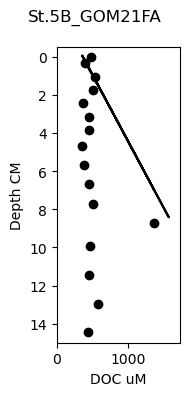

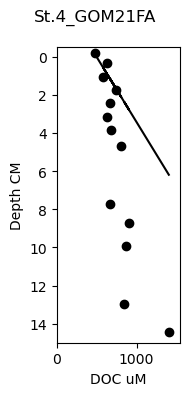

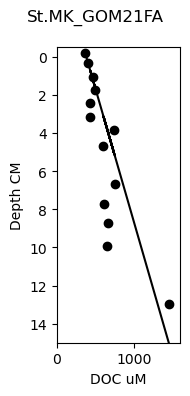

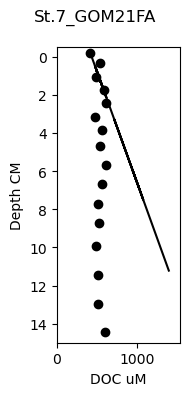

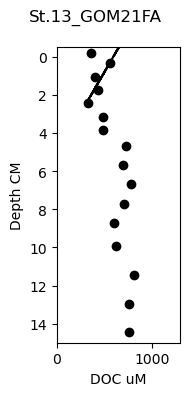

...

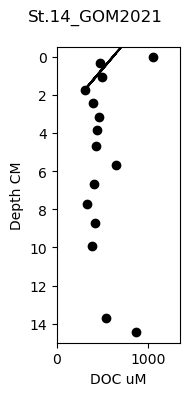

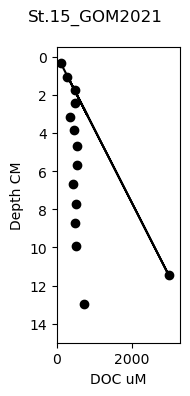

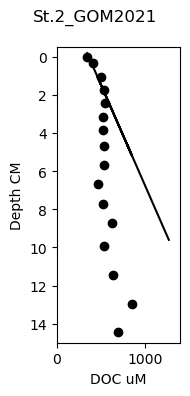

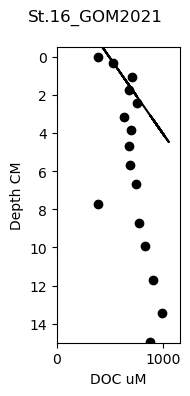

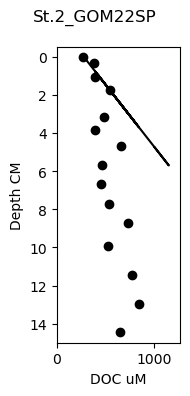

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


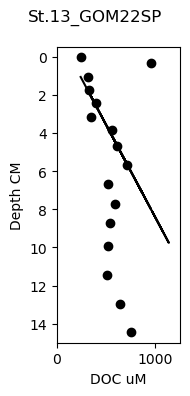

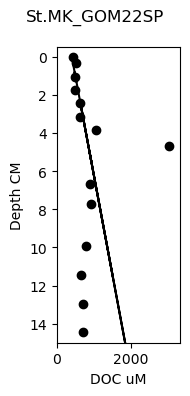

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


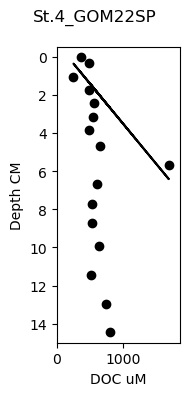

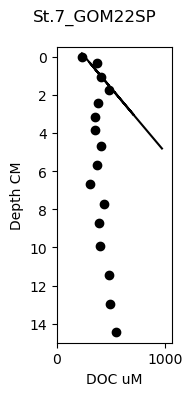

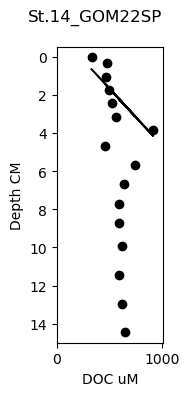

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


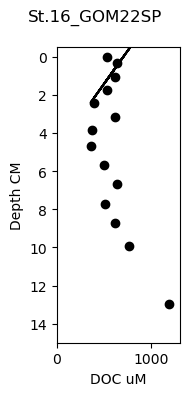

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


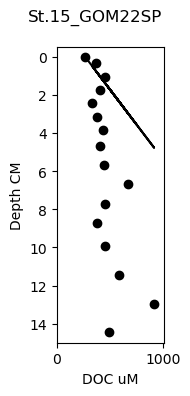

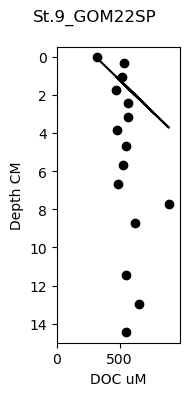

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


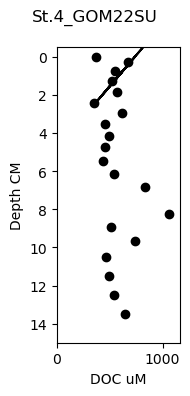

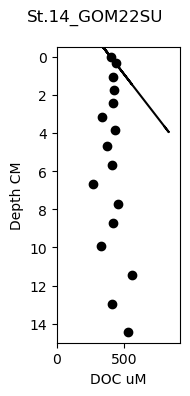

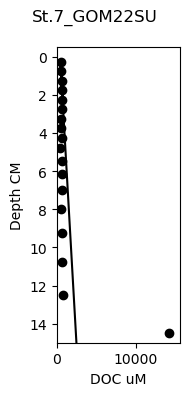

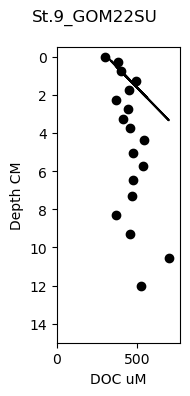

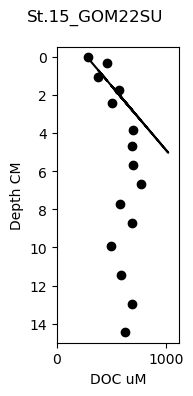

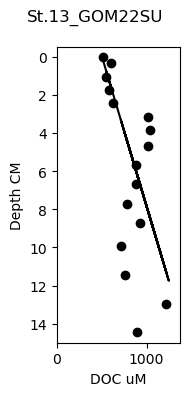

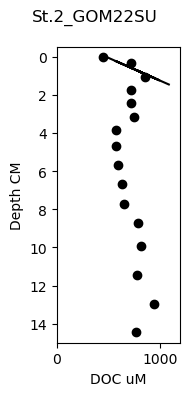

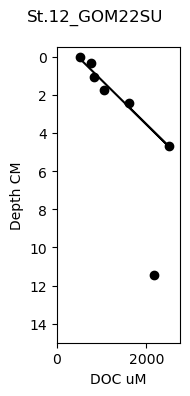

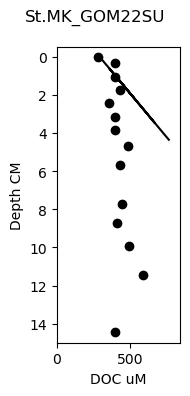

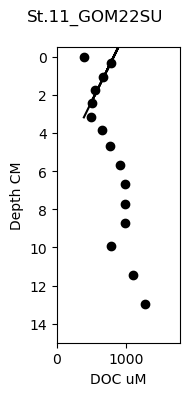

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\754128427.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


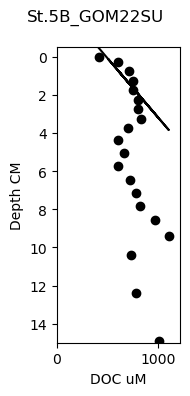

,slope_doc_pw,rsquared_doc_pw,std_err_doc_pw,flux_doc_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_doc,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.5B_GOM21FA,3.907385e+04,0.271363,45274.320329,2.0,0.767841,0.030512,4.0,0.015256,0.673976,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,1.093066e+05,0.744954,45224.735995,2.0,0.757064,0.017724,4.0,0.008862,1.858942,28.795872,-90.702649,St.4,GOM21FA
St.MK_GOM21FA,7.045678e+04,0.985824,5974.205345,2.0,0.837742,0.013597,4.0,0.006799,1.325929,28.913659,-90.328519,St.MK,GOM21FA
St.7_GOM21FA,6.545326e+04,0.764219,20990.180263,3.0,0.862729,0.013460,6.0,0.005495,1.268507,28.910991,-89.872204,St.7,GOM21FA
St.13_GOM21FA,-9.048214e+04,0.779117,34066.545116,3.0,0.904496,0.006345,6.0,0.002590,-1.838470,28.524193,-89.610854,St.13,GOM21FA
St.14_GOM21FA,1.616979e+05,0.993775,9049.017284,2.0,0.841244,0.027246,4.0,0.013623,3.055720,28.727625,-89.620568,St.14,GOM21FA
St.9_GOM21FA,6.949599e+04,0.840358,21418.331812,3.0,0.842932,0.022685,6.0,0.009261,1.315950,28.782994,-89.599750,St.9,GOM21FA
St.15_GOM21FA,-4.071736e+04,0.582089,24395.605334,3.0,0.886382,0.012129,5.0,0.005424,-0.810751,28.950023,-88.846716,St.15,GOM21FA
St.16_GOM21FA,8.858729e+04,0.951452,14149.782846,2.5,0.848174,0.021883,5.0,0.009786,1.687886,28.885048,-89.542132,St.16,GOM21FA


In [18]:
Frames = []

def doc_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_doc_pw_plot.loc[df_doc_pw_plot['code'] == codes[code]]
    y = sub['Depth']
    x = sub['NPOC_uM']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'Depth'].ravel() 
    xx = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'NPOC_uM'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('DOC uM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_doc_pw['NPOC_uM'].min(),sub['NPOC_uM'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='black')        
        
        xx2 = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'Depth'].ravel() / 1000
        yy2 = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'NPOC_uM'].ravel() 
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

    dic = {'code':[codes[code]],
           'slope_doc_pw':[slope],
           'rsquared_doc_pw':[rsquared], 
           'std_err_doc_pw':[std_err], 
           'flux_doc_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    
doc_flux_cal(0, 2, -.50)
doc_flux_cal(1, 2, -.50)
doc_flux_cal(2, 2, -.50)
doc_flux_cal(3, 3, -.50)
doc_flux_cal(4, 3, .1)
doc_flux_cal(5, 2, -.50)
doc_flux_cal(6, 3, -.50)
doc_flux_cal(7, 3, .15)
doc_flux_cal(8, 2.5, -.50)
doc_flux_cal(9, 3, .50)
doc_flux_cal(10, 6, -.5)
doc_flux_cal(11, 2.5, -.50)
doc_flux_cal(12, 3, .50)
doc_flux_cal(13, 2, -.5)
doc_flux_cal(14, 2.5, -.50)
doc_flux_cal(15, 1, -.50)
doc_flux_cal(16, 2, .25)
doc_flux_cal(17, 2.5, -.50)
doc_flux_cal(18, 2, .25)
doc_flux_cal(19, 2, -.25)
doc_flux_cal(20, 2.5, -.50)
doc_flux_cal(21, 2.5, .25)
doc_flux_cal(22, 2, -.25)
doc_flux_cal(23, 6, .50)
doc_flux_cal(24, 2.5, -.25)
doc_flux_cal(25, 3, -.25)
doc_flux_cal(26, 2, -.50)
doc_flux_cal(27, 4, 0)
doc_flux_cal(28, 3, -.25)
doc_flux_cal(29, 2, -.50)
doc_flux_cal(30, 2.5, -.25)
doc_flux_cal(31, 2, .2)
doc_flux_cal(32, 1, -.50)
doc_flux_cal(33, 2.5, -.25)
doc_flux_cal(34, 2, -.2)
doc_flux_cal(35, 3, -.50)
doc_flux_cal(36, 2.5, -.25)
doc_flux_cal(37, 1.5, -.2)
doc_flux_cal(38, 3, -.50)
doc_flux_cal(39, 2, -.25)
doc_flux_cal(40, 3, .2)
doc_flux_cal(41, 3, -.50)

slopes_doc_pw = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_doc_pw['por_mean'].fillna(0.85, inplace=True)
slopes_doc_pw['por_sd'].fillna(0, inplace=True)
slopes_doc_pw['por_SE'] = slopes_doc_pw['por_sd'] / (np.sqrt(slopes_doc_pw['por_count']))
slopes_doc_pw['por_SE'].fillna(0, inplace=True)

D_doc = 2.6 * (10**-6) / 10000 * (86400) #0.000001728 

#slopes_doc_pw["pw_flux_doc"] = slopes_doc_pw["slope_doc_pw"] * (slopes_doc_pw["flux_doc_depth_pw"] * A * slopes_doc_pw["por_mean"] ) * D_doc
slopes_doc_pw["pw_flux_doc"] = slopes_doc_pw["slope_doc_pw"] * ( slopes_doc_pw["por_mean"] ) * D_doc 

slopes_doc_pw = pd.concat([slopes_doc_pw, df_lat_lon], axis=1, join='outer')
slopes_doc_pw['Stn'] = slopes_doc_pw.index.str.split('_').str[0]
slopes_doc_pw['Camp'] = slopes_doc_pw.index.str.split('_').str[1]
slopes_doc_pw = slopes_doc_pw.dropna(subset=['pw_flux_doc'])

slopes_doc_pw 

In [19]:
#figure calculate pore water 

#TN slopes Pore water 
df_doc_pw_plot = df_doc_pw[(df_doc_pw['TN_uM'] != 0)]
df_doc_pw_plot = df_doc_pw_plot.dropna(subset=["TN_uM"])
codes = df_doc_pw_plot['code'].unique()

print(codes)
len(codes)

['St.5B_GOM21FA' 'St.4_GOM21FA' 'St.MK_GOM21FA' 'St.7_GOM21FA'
 'St.13_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA' 'St.15_GOM21FA'
 'St.16_GOM21FA' 'St.11_GOM21FA' 'St.2_GOM21FA' 'St.12_GOM21FA'
 'St.MK_GOM2021' 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM2021'
 'St.4_GOM2021' 'St.9_GOM2021' 'St.14_GOM2021' 'St.15_GOM2021'
 'St.2_GOM2021' 'St.16_GOM2021' 'St.2_GOM22SP' 'St.13_GOM22SP'
 'St.MK_GOM22SP' 'St.4_GOM22SP' 'St.7_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.15_GOM22SP' 'St.9_GOM22SP' 'St.4_GOM22SU'
 'St.14_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU'
 'St.13_GOM22SU' 'St.2_GOM22SU' 'St.12_GOM22SU' 'St.MK_GOM22SU'
 'St.11_GOM22SU' 'St.5B_GOM22SU']


42

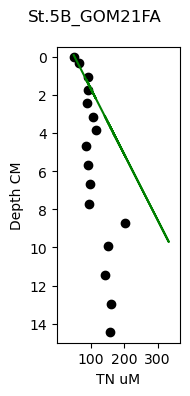

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ]


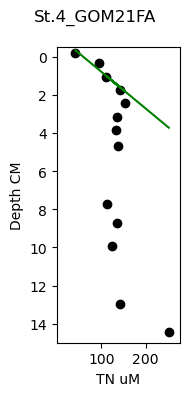

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ]


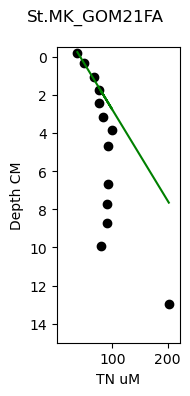

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

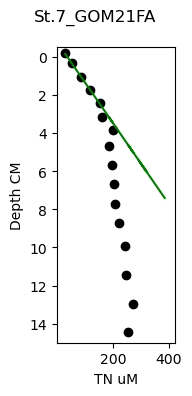

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

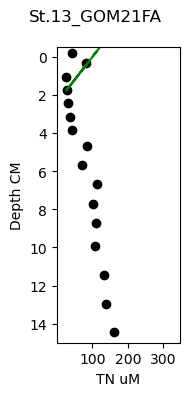

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

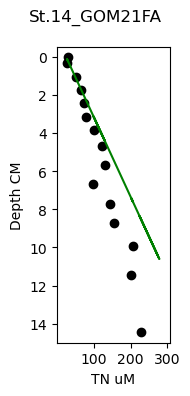

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

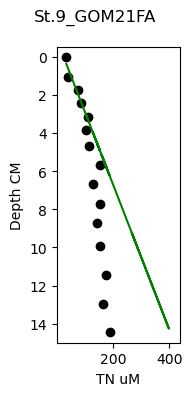

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

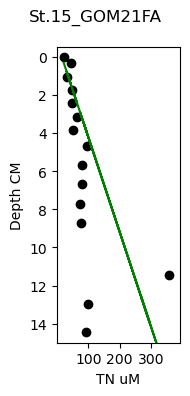

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

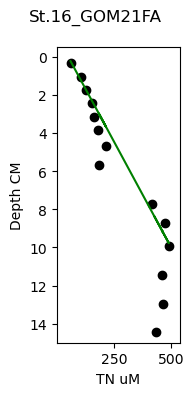

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

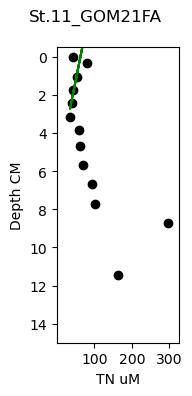

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

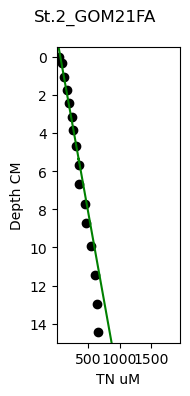

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

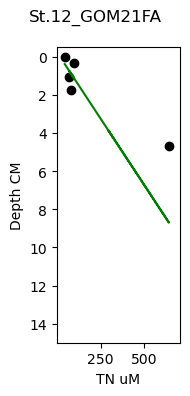

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

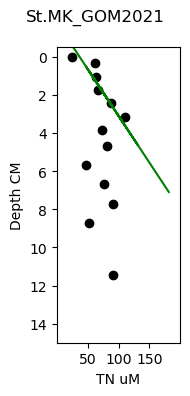

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

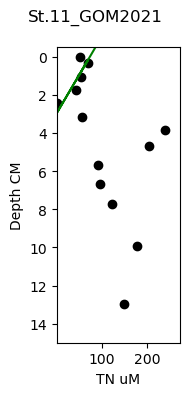

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

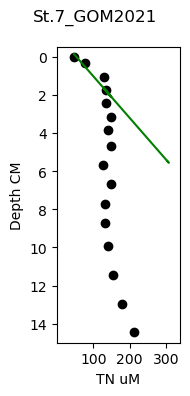

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

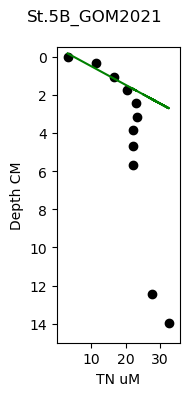

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

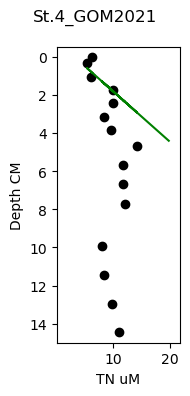

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

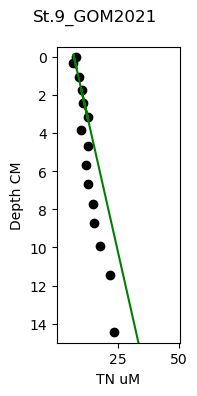

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

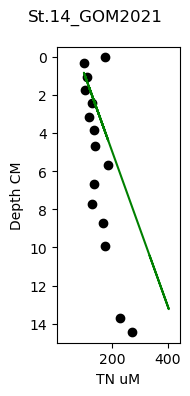

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

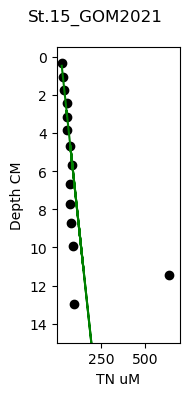

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

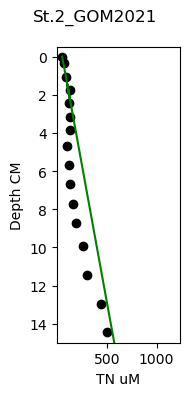

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

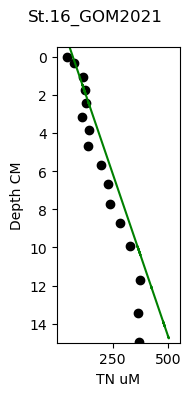

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

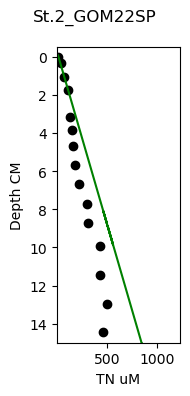

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


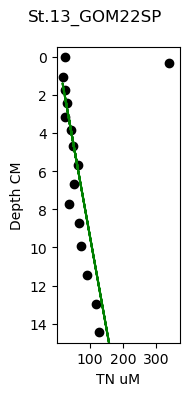

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

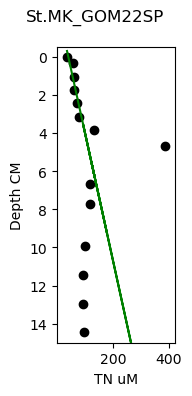

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


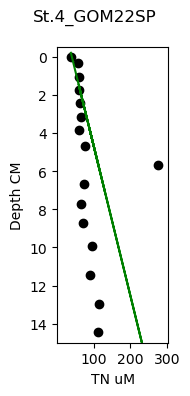

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

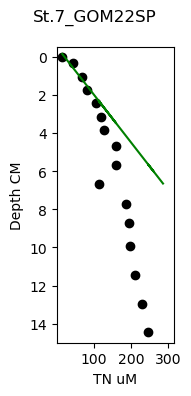

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

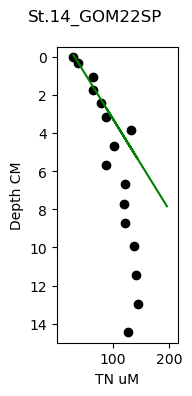

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


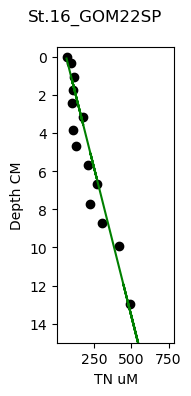

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


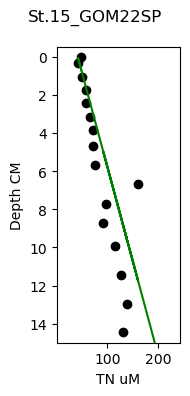

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

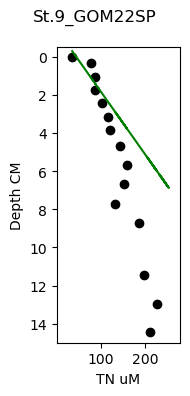

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


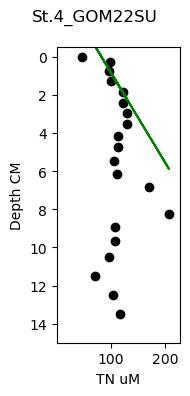

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

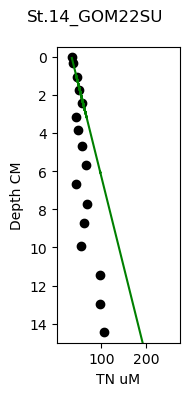

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

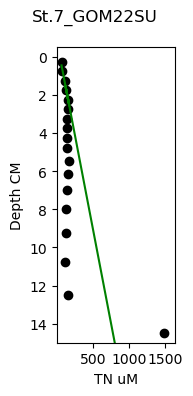

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

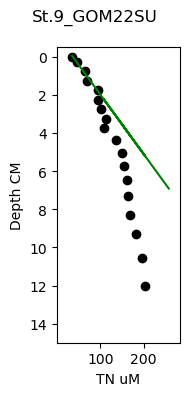

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

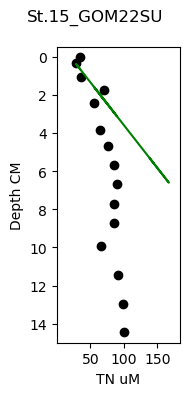

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

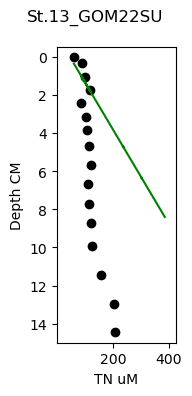

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

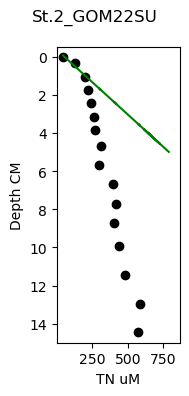

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

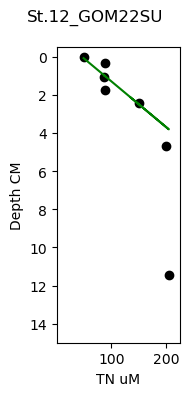

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

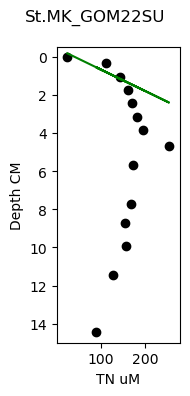

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

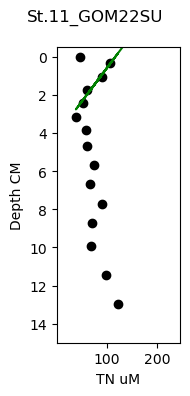

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\782300353.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


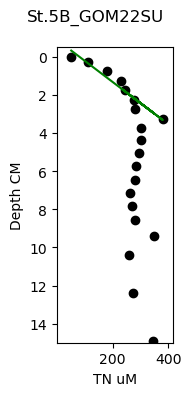

[                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.5B_GOM21FA  24647.536072        0.852181    7258.682808                 2   

               por_mean    por_sd  por_count  
code                                          
St.5B_GOM21FA  0.767841  0.030512          4  ,                slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                          
St.4_GOM21FA  48549.997947        0.934808    9065.916009                 2   

              por_mean    por_sd  por_count  
code                                         
St.4_GOM21FA  0.757064  0.017724          4  ,                 slope_tn_pw  rsquared_tn_pw  std_err_tn_pw  flux_tn_depth_pw  \
code                                                                           
St.MK_GOM21FA  20602.215677        0.984413    1833.115589                 2   

,slope_tn_pw,rsquared_tn_pw,std_err_tn_pw,flux_tn_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_tn,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.5B_GOM21FA,24647.536072,0.852181,7258.682808,2.0,0.767841,0.030512,4.0,0.015256,0.817577,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,48549.997947,0.934808,9065.916009,2.0,0.757064,0.017724,4.0,0.008862,1.587835,28.795872,-90.702649,St.4,GOM21FA
St.MK_GOM21FA,20602.215677,0.984413,1833.115589,2.0,0.837742,0.013597,4.0,0.006799,0.745604,28.913659,-90.328519,St.MK,GOM21FA
St.7_GOM21FA,47032.498584,0.998907,898.230332,3.0,0.862729,0.013460,6.0,0.005495,1.752897,28.910991,-89.872204,St.7,GOM21FA
St.13_GOM21FA,-22450.255104,0.536936,14742.323576,3.0,0.904496,0.006345,6.0,0.002590,-0.877226,28.524193,-89.610854,St.13,GOM21FA
St.14_GOM21FA,22430.733307,0.938345,4065.661216,2.0,0.841244,0.027246,4.0,0.013623,0.815172,28.727625,-89.620568,St.14,GOM21FA
St.9_GOM21FA,23255.149726,0.882490,6000.479107,3.0,0.842932,0.022685,6.0,0.009261,0.846829,28.782994,-89.599750,St.9,GOM21FA
St.15_GOM21FA,4395.546676,0.218022,5886.327430,3.0,0.886382,0.012129,5.0,0.005424,0.168313,28.950023,-88.846716,St.15,GOM21FA
St.16_GOM21FA,43561.136819,0.966591,5726.527068,2.5,0.848174,0.021883,5.0,0.009786,1.596128,28.885048,-89.542132,St.16,GOM21FA


In [20]:
Frames = []

def doc_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_doc_pw_plot.loc[df_doc_pw_plot['code'] == codes[code]]
    y = sub['Depth']
    x = sub['TN_uM']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'Depth'].ravel() 
    xx = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'TN_uM'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('TN uM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_doc_pw['TN_uM'].min(),sub['TN_uM'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='green')        
        
        xx2 = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'Depth'].ravel()/ 1000
        yy2 = sub.loc[(sub['Depth'] < depth1) & (sub['Depth'] > depth2), 'TN_uM'].ravel() 
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

        
    dic = {'code':[codes[code]],
           'slope_tn_pw':[slope],
           'rsquared_tn_pw':[rsquared], 
           'std_err_tn_pw':[std_err], 
           'flux_tn_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
doc_flux_cal(0, 2, -.50)
doc_flux_cal(1, 2, -.50)
doc_flux_cal(2, 2, -.50)
doc_flux_cal(3, 3, -.50)
doc_flux_cal(4, 3, .1)
doc_flux_cal(5, 2, -.50)
doc_flux_cal(6, 3, -.50)
doc_flux_cal(7, 3, .15)
doc_flux_cal(8, 2.5, -.50)
doc_flux_cal(9, 3, .50)
doc_flux_cal(10, 6, -.5)
doc_flux_cal(11, 2.5, -.50)
doc_flux_cal(12, 3, .50)
doc_flux_cal(13, 2, -.5)
doc_flux_cal(14, 2.5, -.50)
doc_flux_cal(15, 2, -.50)
doc_flux_cal(16, 2, .25)
doc_flux_cal(17, 2.5, -.50)
doc_flux_cal(18, 2, .25)
doc_flux_cal(19, 2, -.25)
doc_flux_cal(20, 2.5, -.50)
doc_flux_cal(21, 2.5, .25)
doc_flux_cal(22, 2, -.25)
doc_flux_cal(23, 6, .50)
doc_flux_cal(24, 2.5, -.25)
doc_flux_cal(25, 3, -.25)
doc_flux_cal(26, 2, -.50)
doc_flux_cal(27, 2.5, -.25)
doc_flux_cal(28, 3, -.25)
doc_flux_cal(29, 2, -.50)
doc_flux_cal(30, 2.5, -.25)
doc_flux_cal(31, 2, .2)
doc_flux_cal(32, 2, -.50)
doc_flux_cal(33, 2.5, -.25)
doc_flux_cal(34, 2, -.2)
doc_flux_cal(35, 3, -.50)
doc_flux_cal(36, 2.5, -.25)
doc_flux_cal(37, 1.5, -.2)
doc_flux_cal(38, 3, -.50)
doc_flux_cal(39, 2, -.25)
doc_flux_cal(40, 3, .2)
doc_flux_cal(41, 3, -.50)

slopes_tn_pw = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_tn_pw['por_mean'].fillna(0.85, inplace=True)
slopes_tn_pw['por_sd'].fillna(0, inplace=True)
slopes_tn_pw['por_SE'] = slopes_doc_pw['por_sd'] / (np.sqrt(slopes_doc_pw['por_count']))
slopes_tn_pw['por_SE'].fillna(0, inplace=True)

D_tn = 5 * (10**-6) / 10000 * (86400)

slopes_tn_pw["pw_flux_tn"] = slopes_tn_pw["slope_tn_pw"] * slopes_tn_pw["por_mean"] * D_tn 
slopes_tn_pw = pd.concat([slopes_tn_pw, df_lat_lon], axis=1, join='outer')
slopes_tn_pw['Stn'] = slopes_tn_pw.index.str.split('_').str[0]
slopes_tn_pw['Camp'] = slopes_tn_pw.index.str.split('_').str[1]
slopes_tn_pw = slopes_tn_pw.dropna(subset=['pw_flux_tn'])

slopes_tn_pw 

In [21]:
#figure calculate pore water 

#Fe2 and Fe3 slopes
codes = df_iron_pw['code'].unique()

print(codes)
len(codes)

['St.MK_GOM2021' 'St.5B_GOM2021' 'St.4_GOM2021' 'St.14_GOM2021'
 'St.9_GOM2021' 'St.2_GOM2021' 'St.15_GOM2021' 'St.16_GOM2021'
 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM21FA' 'St.4_GOM21FA'
 'St.MK_GOM21FA' 'St.7_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA'
 'St.15_GOM21FA' 'St.2_GOM21FA' 'St.13_GOM21FA' 'St.16_GOM21FA'
 'St.12_GOM21FA' 'St.11_GOM21FA' 'St.7_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.5B_GOM22SP' 'St.15_GOM22SP' 'St.9_GOM22SP'
 'St.2_GOM22SP' 'St.13_GOM22SP' 'St.MK_GOM22SP' 'St.4_GOM22SP'
 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.14_GOM22SU' 'St.7_GOM22SU'
 'St.9_GOM22SU' 'St.15_GOM22SU' 'St.13_GOM22SU' 'St.2_GOM22SU'
 'St.12_GOM22SU' 'St.16_GOM22SU' 'St.11_GOM22SU' 'St.MK_GOM22SU']


44

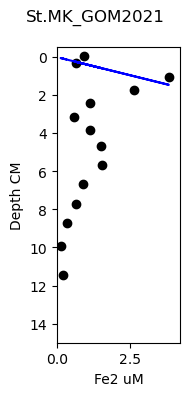

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ]


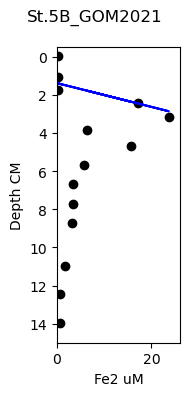

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ]


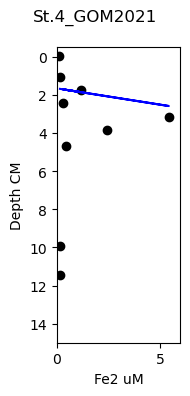

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

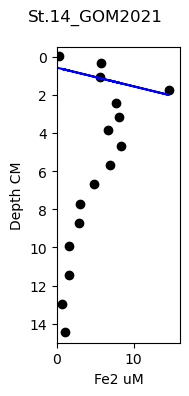

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

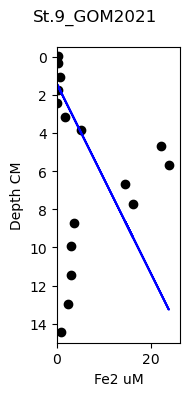

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

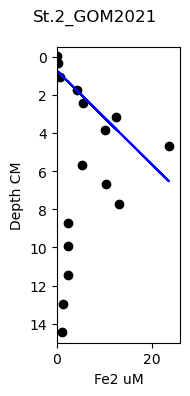

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

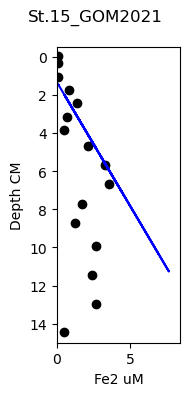

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

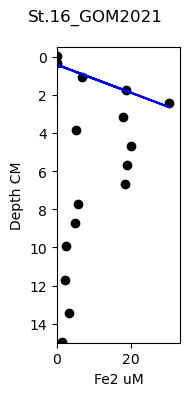

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

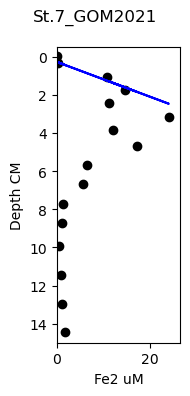

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

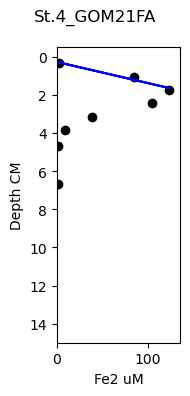

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

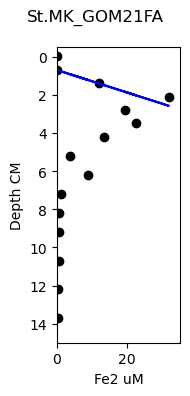

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

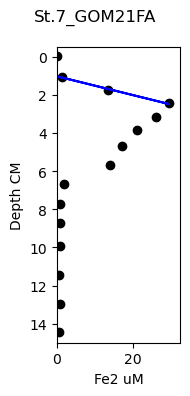

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

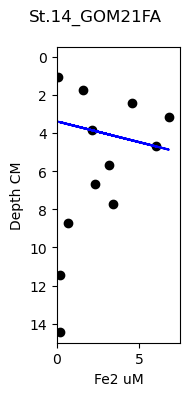

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

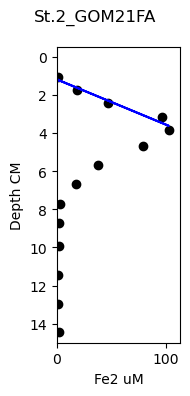

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

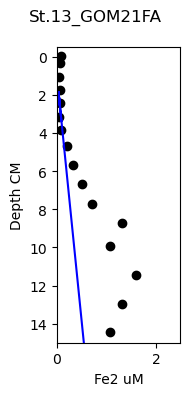

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

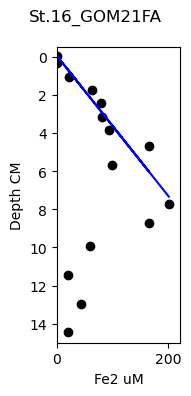

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

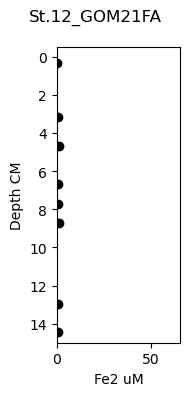

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


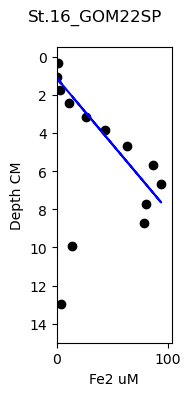

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


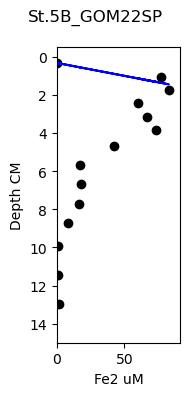

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


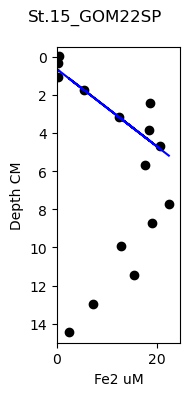

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

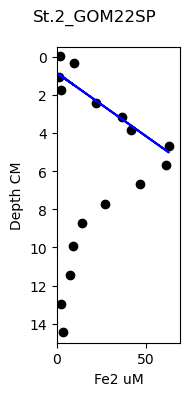

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


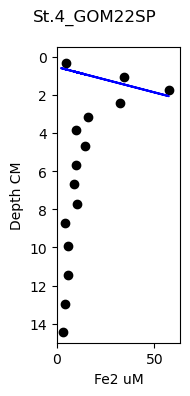

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


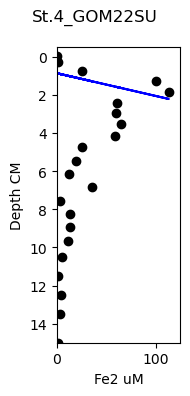

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3722969183.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


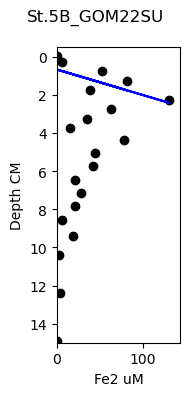

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

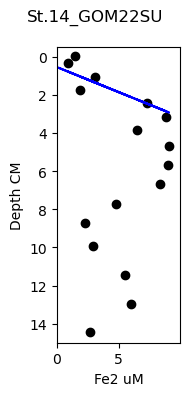

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

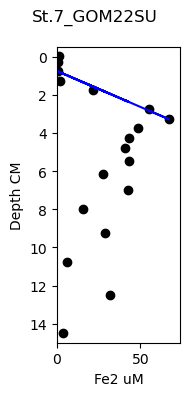

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

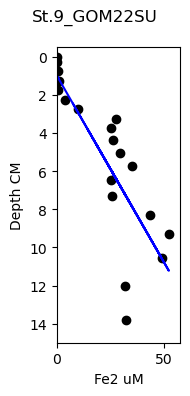

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

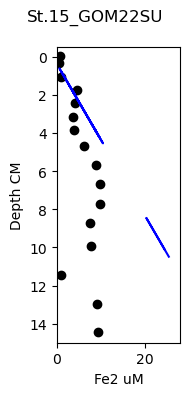

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

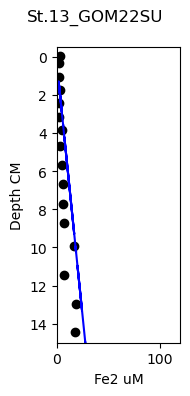

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

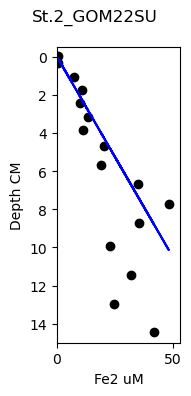

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

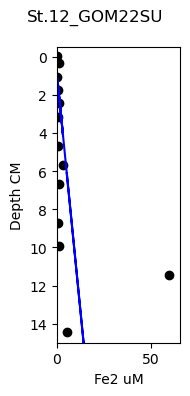

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

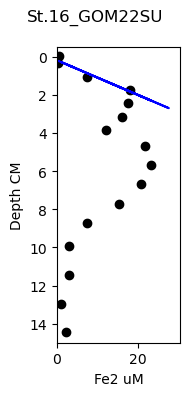

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

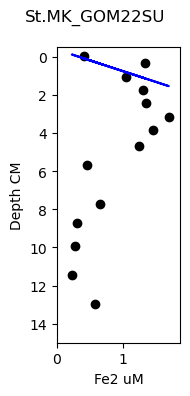

[               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.MK_GOM2021    1398.62129         0.531382      928.733249   

               flux_fe2_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  2  0.524421  0.078036          4  ,                slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                           
St.5B_GOM2021  12142.857143         0.756441      6890.26307   

               flux_fe2_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe2_pw  rsquared_fe2_pw  std_err_fe2_pw  \
code                                                          
St.4_GOM2021    101.428571         0.017294      764.576714   

              flux_fe2_depth

,slope_fe2_pw,rsquared_fe2_pw,std_err_fe2_pw,flux_fe2_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_fe2,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.MK_GOM2021,1398.621290,0.531382,928.733249,2.0,0.524421,0.078036,4.0,0.039018,0.044804,28.906549,-90.334712,St.MK,GOM2021
St.5B_GOM2021,12142.857143,0.756441,6890.263070,3.0,0.766182,0.061370,5.0,0.027446,0.568311,28.811667,-91.343178,St.5B,GOM2021
St.4_GOM2021,101.428571,0.017294,764.576714,3.0,0.657074,0.075922,5.0,0.033953,0.004071,28.799256,-90.711336,St.4,GOM2021
St.14_GOM2021,2131.857143,0.209260,2930.334602,3.0,0.844243,0.021163,5.0,0.009464,0.109941,28.726863,-89.601437,St.14,GOM2021
St.9_GOM2021,1130.734694,0.561914,499.201015,4.0,0.859297,0.009932,6.0,0.004055,0.059352,28.799761,-89.598594,St.9,GOM2021
St.2_GOM2021,3528.489796,0.864881,697.332358,4.0,0.893612,0.018307,6.0,0.007474,0.192607,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,184.000000,0.238679,164.310451,4.0,0.894873,0.033341,6.0,0.013612,0.010058,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,13277.857143,0.975383,2109.390448,2.0,0.884978,0.004250,4.0,0.002125,0.717784,28.876302,-89.547035,St.16,GOM2021
St.7_GOM2021,10276.428571,0.932150,2772.518471,2.0,0.905406,0.012433,4.0,0.006217,0.568354,28.918272,-89.875616,St.7,GOM2021


In [22]:
Frames = []

def fe2_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_iron_pw.loc[df_iron_pw['code'] == codes[code]]
    y = sub['Fe2_Depth']
    x = sub['Fe2_uM']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['Fe2_Depth'] < depth1) & (sub['Fe2_Depth'] > depth2), 'Fe2_Depth'].ravel() 
    xx = sub.loc[(sub['Fe2_Depth'] < depth1) & (sub['Fe2_Depth'] > depth2), 'Fe2_uM'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('Fe2 uM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_iron_pw['Fe2_uM'].min(),sub['Fe2_uM'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='b')        
        
        xx2 = sub.loc[(sub['Fe2_Depth'] < depth1) & (sub['Fe2_Depth'] > depth2), 'Fe2_Depth'].ravel()/ 1000
        yy2 = sub.loc[(sub['Fe2_Depth'] < depth1) & (sub['Fe2_Depth'] > depth2), 'Fe2_uM'].ravel() 
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err

    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

        
    dic = {'code':[codes[code]],
           'slope_fe2_pw':[slope],
           'rsquared_fe2_pw':[rsquared], 
           'std_err_fe2_pw':[std_err], 
           'flux_fe2_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
fe2_flux_cal(0, 2, -.50)
fe2_flux_cal(1, 3,.50)
fe2_flux_cal(2, 3,.50)
fe2_flux_cal(3, 3,.15)
fe2_flux_cal(4, 4,.15)
fe2_flux_cal(5, 4,.15)
fe2_flux_cal(6, 4,.15)
fe2_flux_cal(7, 2,0)
fe2_flux_cal(9, 2,.15)
fe2_flux_cal(11, 2,.15)
fe2_flux_cal(12, 2,.15)
fe2_flux_cal(13, 3,1)
fe2_flux_cal(14, 8,.5)
fe2_flux_cal(17, 4,.50)
fe2_flux_cal(18, 4,.50)
fe2_flux_cal(19, 4,.50)
fe2_flux_cal(20, 4,0)
fe2_flux_cal(24, 4,0)
fe2_flux_cal(25, 2,0)
fe2_flux_cal(26, 2,0)
fe2_flux_cal(28, 4, 0)
fe2_flux_cal(31, 3, 0)
fe2_flux_cal(32, 3, 0)
fe2_flux_cal(33, 3, 0)
fe2_flux_cal(34, 3, 0)
fe2_flux_cal(35, 3, 0)
fe2_flux_cal(36, 3, 0)
fe2_flux_cal(37, 3, 0)
fe2_flux_cal(38, 4, -.10)
fe2_flux_cal(39, 3.5, -.10)
fe2_flux_cal(40, 3.5, -.10)
fe2_flux_cal(41, 2, -.10)
fe2_flux_cal(43, 2, -.10)

slopes_fe2_pw = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_fe2_pw['por_mean'].fillna(0.85, inplace=True)
slopes_fe2_pw['por_sd'].fillna(0, inplace=True)
slopes_fe2_pw['por_SE'] = slopes_fe2_pw['por_sd'] / (np.sqrt(slopes_fe2_pw['por_count']))
slopes_fe2_pw['por_SE'].fillna(0, inplace=True)

D_fe = 7.07e-06 / 10000 * (86400)

slopes_fe2_pw["pw_flux_fe2"] = slopes_fe2_pw["slope_fe2_pw"] * slopes_fe2_pw["por_mean"] * D_fe 
slopes_fe2_pw = pd.concat([slopes_fe2_pw, df_lat_lon], axis=1, join='outer')
slopes_fe2_pw['Stn'] = slopes_fe2_pw.index.str.split('_').str[0]
slopes_fe2_pw['Camp'] = slopes_fe2_pw.index.str.split('_').str[1]
slopes_fe2_pw = slopes_fe2_pw.dropna(subset=['pw_flux_fe2'])

slopes_fe2_pw 

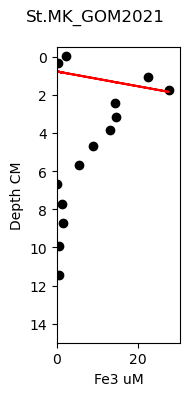

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ]


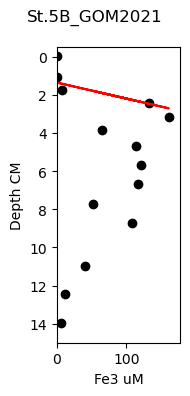

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ]


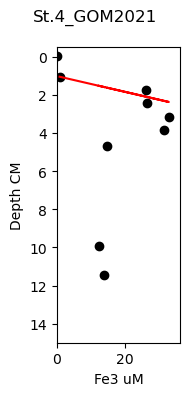

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

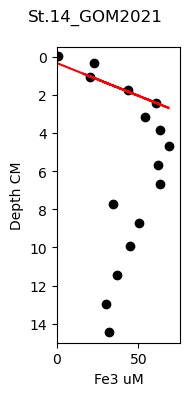

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

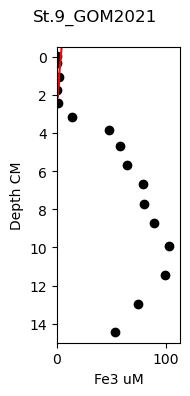

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

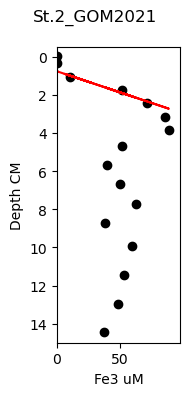

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

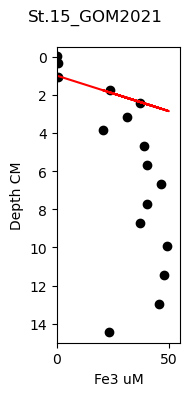

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

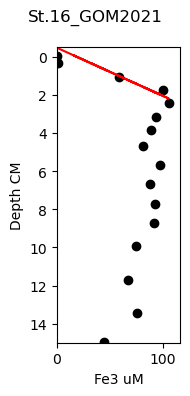

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

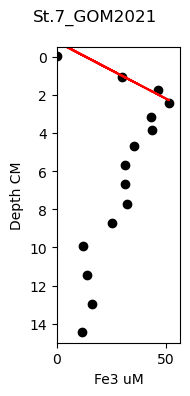

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

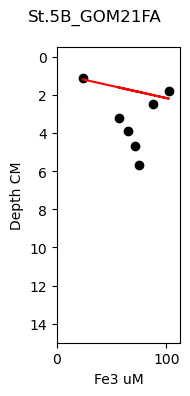

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

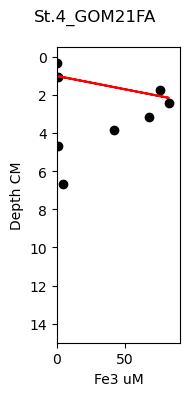

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

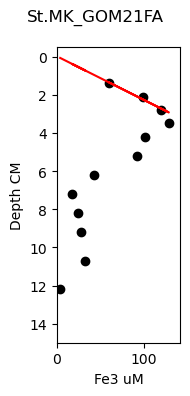

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

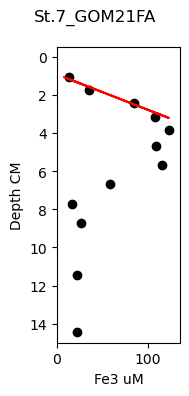

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

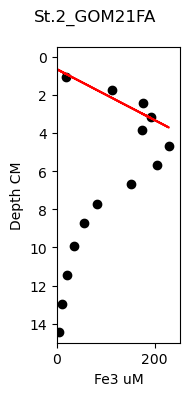

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

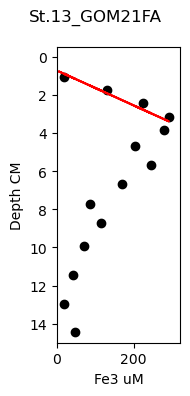

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

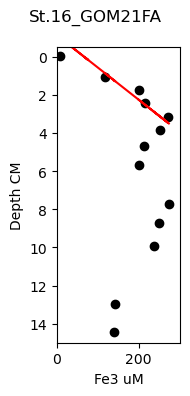

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

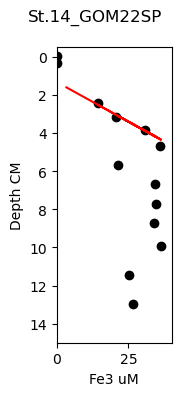

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


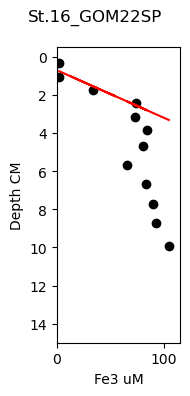

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


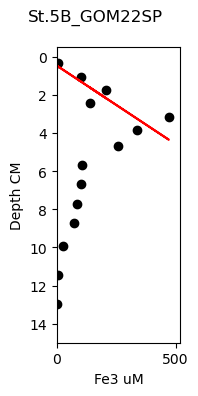

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


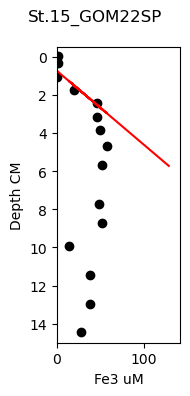

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

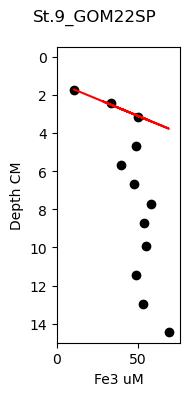

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

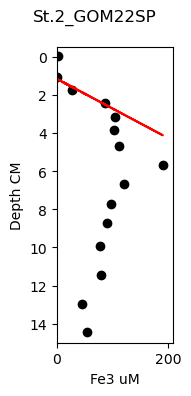

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

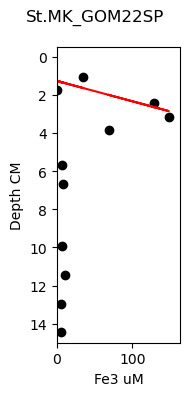

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


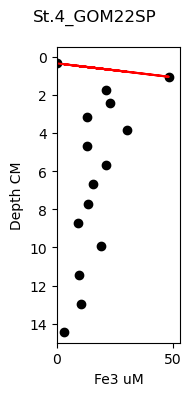

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


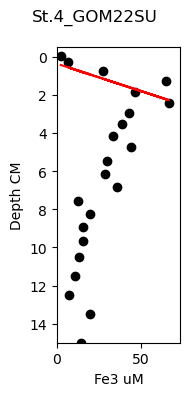

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\1497115170.py:33: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


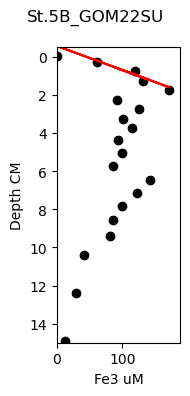

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

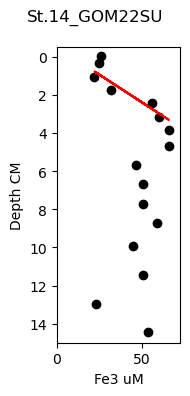

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

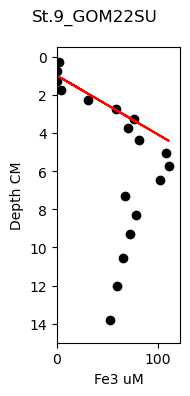

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

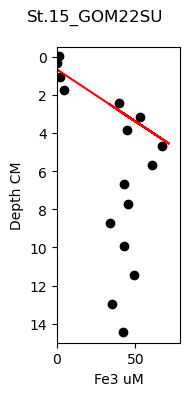

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

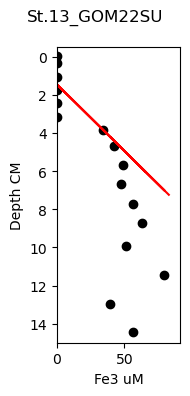

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

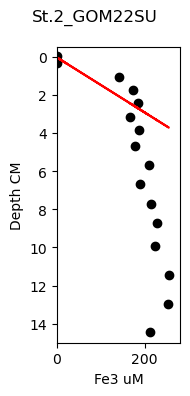

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

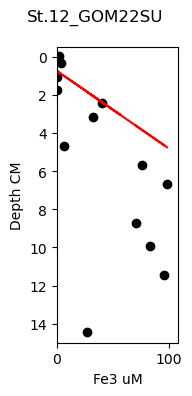

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

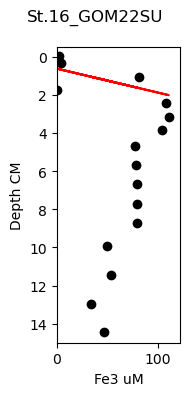

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

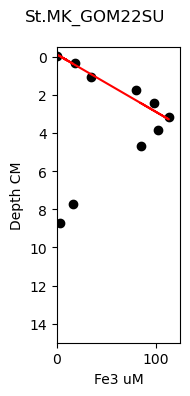

[               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.MK_GOM2021   6694.285714         0.260263     7980.336152   

               flux_fe3_depth_pw  por_mean    por_sd  por_count  
code                                                             
St.MK_GOM2021                  3  0.556095  0.094259          5  ,                slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                           
St.5B_GOM2021       94460.0         0.791543    48475.153387   

               flux_fe3_depth_pw  por_mean   por_sd  por_count  
code                                                            
St.5B_GOM2021                  3  0.766182  0.06137          5  ,               slope_fe3_pw  rsquared_fe3_pw  std_err_fe3_pw  \
code                                                          
St.4_GOM2021  18327.857143         0.753098    10494.165929   

              flux_fe3_depth

,slope_fe3_pw,rsquared_fe3_pw,std_err_fe3_pw,flux_fe3_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_fe3,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.MK_GOM2021,6694.285714,0.260263,7980.336152,3.0,0.556095,0.094259,5.0,0.042154,0.227398,28.906549,-90.334712,St.MK,GOM2021
St.5B_GOM2021,94460.000000,0.791543,48475.153387,3.0,0.766182,0.061370,5.0,0.027446,4.420926,28.811667,-91.343178,St.5B,GOM2021
St.4_GOM2021,18327.857143,0.753098,10494.165929,3.0,0.657074,0.075922,5.0,0.033953,0.735630,28.799256,-90.711336,St.4,GOM2021
St.14_GOM2021,29002.857143,0.992094,2589.003564,3.0,0.844243,0.021163,5.0,0.009464,1.495689,28.726863,-89.601437,St.14,GOM2021
St.9_GOM2021,-684.285714,0.445286,763.751928,3.0,0.858953,0.010848,5.0,0.004851,-0.035904,28.799761,-89.598594,St.9,GOM2021
St.2_GOM2021,43232.142857,0.958756,8966.662074,3.0,0.896193,0.019031,5.0,0.008511,2.366691,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,26274.285714,0.978438,3900.413461,3.0,0.904022,0.028840,5.0,0.012898,1.450919,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,33496.428571,0.843633,14420.972545,3.0,0.878884,0.012766,5.0,0.005709,1.798305,28.876302,-89.547035,St.16,GOM2021
St.7_GOM2021,15338.571429,0.914702,4683.960255,3.0,0.900131,0.015329,5.0,0.006855,0.843381,28.918272,-89.875616,St.7,GOM2021


In [23]:
Frames = []

def fe3_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_iron_pw.loc[df_iron_pw['code'] == codes[code]]
    y = sub['FeT_Depth']
    x = sub['Fe3_uM']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['FeT_Depth'] < depth1) & (sub['FeT_Depth'] > depth2), 'FeT_Depth'].ravel() 
    xx = sub.loc[(sub['FeT_Depth'] < depth1) & (sub['FeT_Depth'] > depth2), 'Fe3_uM'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('Fe3 uM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_iron_pw['Fe3_uM'].min(),sub['Fe3_uM'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='r')        
        
        xx2 = sub.loc[(sub['FeT_Depth'] < depth1) & (sub['FeT_Depth'] > depth2), 'FeT_Depth'].ravel()/ 1000 
        yy2 = sub.loc[(sub['FeT_Depth'] < depth1) & (sub['FeT_Depth'] > depth2), 'Fe3_uM'].ravel() 
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

        
    dic = {'code':[codes[code]],
           'slope_fe3_pw':[slope],
           'rsquared_fe3_pw':[rsquared], 
           'std_err_fe3_pw':[std_err], 
           'flux_fe3_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
fe3_flux_cal(0, 3, 0)
fe3_flux_cal(1, 3, 1)
fe3_flux_cal(2, 3, 1)
fe3_flux_cal(3, 3, 1)
fe3_flux_cal(4, 3, 1)
fe3_flux_cal(5, 3, 1)
fe3_flux_cal(6, 3, 1)
fe3_flux_cal(7, 3, 1)
fe3_flux_cal(9, 3, 1)
fe3_flux_cal(10, 3, 1)
fe3_flux_cal(11, 3, 1)
fe3_flux_cal(12, 3.5, 1)
fe3_flux_cal(13, 3, 1)
fe3_flux_cal(17, 4, 1)
fe3_flux_cal(18, 4, 1)
fe3_flux_cal(19, 4, 1)
fe3_flux_cal(23, 4.5, 2)
fe3_flux_cal(24, 2.5, 0)
fe3_flux_cal(25, 2.5, 0)
fe3_flux_cal(26, 2.5, 0)
fe3_flux_cal(27, 3.5, 1.5)
fe3_flux_cal(28, 3, 1)
fe3_flux_cal(30, 3.5, 1)
fe3_flux_cal(31, 1.5, 0)
fe3_flux_cal(32, 3.5, 0)
fe3_flux_cal(33, 1.5, 0)
fe3_flux_cal(34, 3.5, 0)
fe3_flux_cal(36, 3.5, 0)
fe3_flux_cal(37, 4, -1)
fe3_flux_cal(38, 4, -1)
fe3_flux_cal(39, 4, -1)
fe3_flux_cal(40, 2.5, -1)
fe3_flux_cal(41, 2.5, -1)
fe3_flux_cal(43, 4, -1)

slopes_fe3_pw = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_fe3_pw['por_mean'].fillna(0.85, inplace=True)
slopes_fe3_pw['por_sd'].fillna(0, inplace=True)
slopes_fe3_pw['por_SE'] = slopes_fe3_pw['por_sd'] / (np.sqrt(slopes_fe3_pw['por_count']))
slopes_fe3_pw['por_SE'].fillna(0, inplace=True)

D_fe = 7.07e-06 / 10000 * (86400)

slopes_fe3_pw["pw_flux_fe3"] = slopes_fe3_pw["slope_fe3_pw"] * slopes_fe3_pw["por_mean"] * D_fe 
slopes_fe3_pw = pd.concat([slopes_fe3_pw, df_lat_lon], axis=1, join='outer')
slopes_fe3_pw['Stn'] = slopes_fe3_pw.index.str.split('_').str[0]
slopes_fe3_pw['Camp'] = slopes_fe3_pw.index.str.split('_').str[1]
slopes_fe3_pw = slopes_fe3_pw.dropna(subset=['pw_flux_fe3'])

slopes_fe3_pw 

In [24]:
#figure calculate pore water 

#CDOM slops
df_cdom_pw_cl = df_cdom_pw.drop(df_cdom_pw[(df_cdom_pw['a350'] <= 0) | (df_cdom_pw['a350'].isna())].index)
df_cdom_pw_cl['Sample_depth'] = df_cdom_pw_cl['Sample_depth'].astype(float)

codes = df_cdom_pw_cl['code'].unique()
print(codes)
len(codes)


['St.14_GOM2021' 'St.2_GOM2021' 'St.15_GOM2021' 'St.16_GOM2021'
 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM21FA' 'St.4_GOM21FA'
 'St.MK_GOM21FA' 'St.7_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA'
 'St.15_GOM21FA' 'St.2_GOM21FA' 'St.13_GOM21FA' 'St.16_GOM21FA'
 'St.12_GOM21FA' 'St.11_GOM21FA' 'St.7_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.5B_GOM22SP' 'St.15_GOM22SP' 'St.9_GOM22SP'
 'St.2_GOM22SP' 'St.13_GOM22SP' 'St.MK_GOM22SP' 'St.4_GOM22SP'
 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.14_GOM22SU' 'St.7_GOM22SU'
 'St.9_GOM22SU' 'St.15_GOM22SU' 'St.13_GOM22SU' 'St.2_GOM22SU'
 'St.12_GOM22SU' 'St.16_GOM22SU' 'St.11_GOM22SU' 'St.MK_GOM22SU']


40

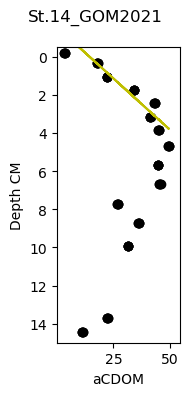

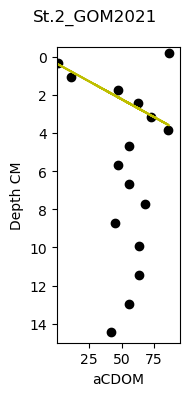

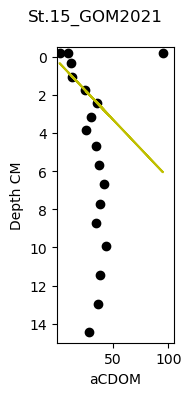

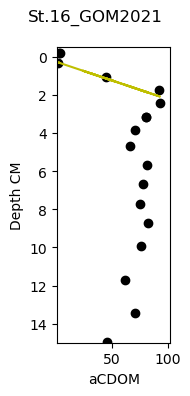

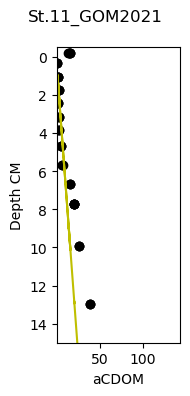

...

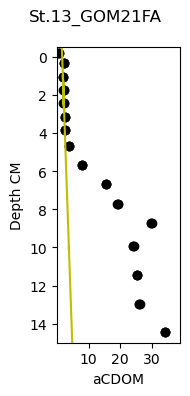

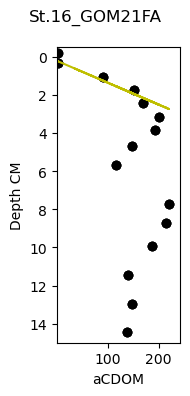

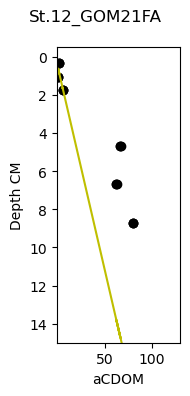

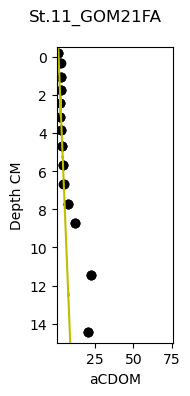

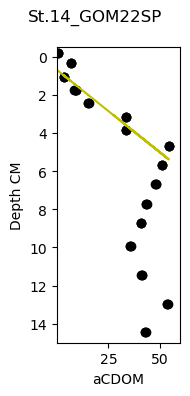

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


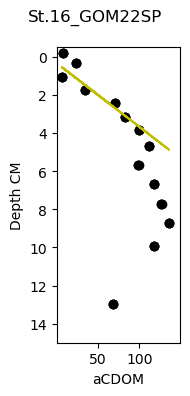

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


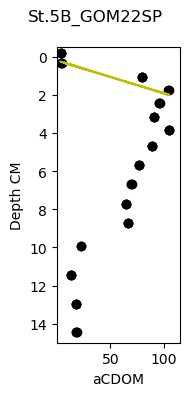

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


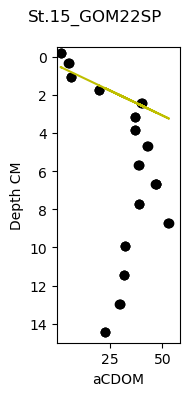

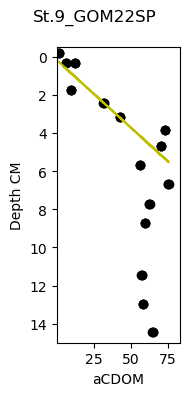

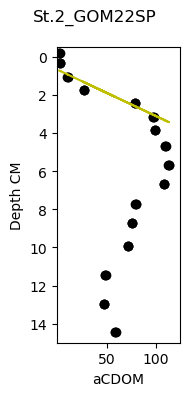

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


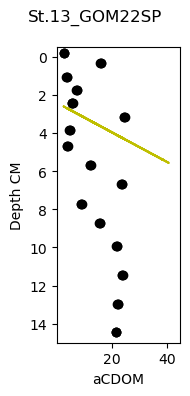

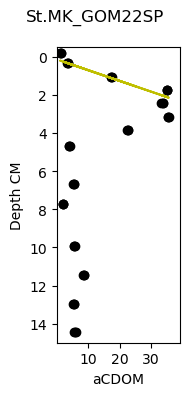

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


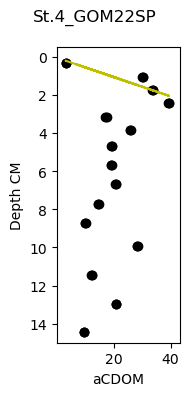

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


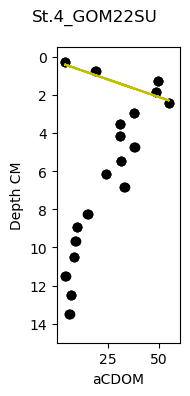

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\724898923.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


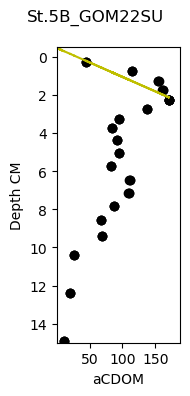

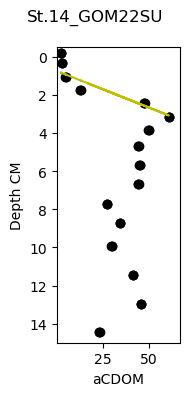

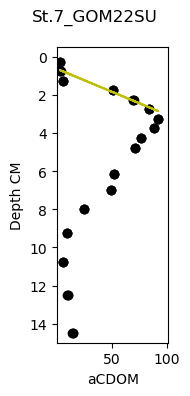

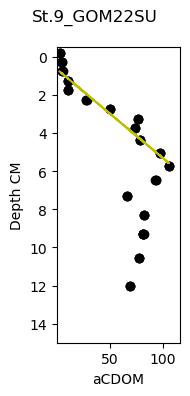

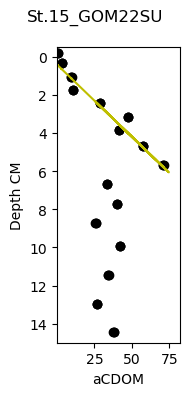

...

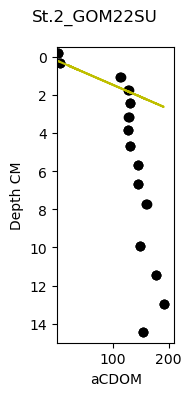

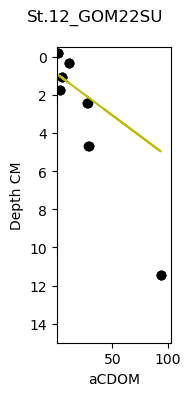

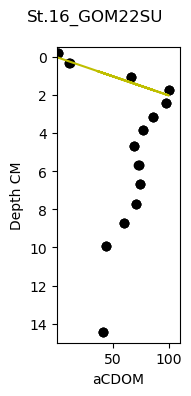

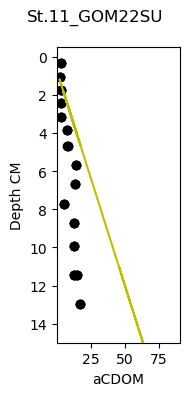

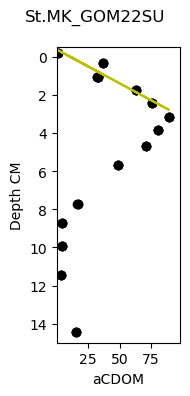

,slope_cdom_350_pw,rsquared_cdom_350_pw,std_err_cdom_350_pw,flux_cdom_350_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_aCDOM350_mmmol,pw_flux_aCDOM350,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,,
St.14_GOM2021,3.685420e+08,0.887058,2.485193e+07,4.0,0.836101,0.026545,6.0,0.010837,6922.018262,0.154690,28.726863,-89.601437,St.14,GOM2021
St.2_GOM2021,1.148479e+09,0.956443,1.225440e+08,4.0,0.893612,0.018307,6.0,0.007474,23054.681966,0.515217,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,7.260866e+08,1.000000,0.000000e+00,2.0,0.913782,0.023736,4.0,0.011868,14904.528236,0.333080,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,2.068857e+09,0.899776,4.882415e+08,3.0,0.878884,0.012766,5.0,0.005709,40845.979364,0.912809,28.876302,-89.547035,St.16,GOM2021
St.11_GOM2021,1.777727e+07,0.240935,9.513900e+06,3.0,0.886510,0.010708,5.0,0.004789,354.026496,0.007912,28.225724,-89.540904,St.11,GOM2021
St.7_GOM2021,7.357160e+08,0.883914,8.431291e+07,3.0,0.900131,0.015329,5.0,0.006855,14876.574795,0.332456,28.918272,-89.875616,St.7,GOM2021
St.5B_GOM21FA,1.534001e+09,0.818495,2.284344e+08,3.0,0.758168,0.033453,5.0,0.014961,26126.299881,0.583860,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,1.868530e+09,0.861053,2.837015e+08,3.0,0.707526,0.095821,6.0,0.039119,29698.182916,0.663683,28.795872,-90.702649,St.4,GOM21FA
St.7_GOM21FA,1.162557e+09,0.961348,7.371580e+07,3.0,0.862729,0.013460,6.0,0.005495,22530.754796,0.503508,28.910991,-89.872204,St.7,GOM21FA


In [25]:
Frames = []

#CDOM / 2.303 = A 
#A / E = C 
E_10mg_L = (33*(350/320)+9.13*(350/410))/2 # 10 mg / L
# C is conc of SRHA Xiao 2013 (assuming no Fe) tabel 3
HA_molar_mass = 226.139
E_mol_L = E_10mg_L / 10 / 1000 / HA_molar_mass 
E_mmol_m3 = E_mol_L *1000 /1000
E_350 = E_mmol_m3

def cdom_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_cdom_pw_cl.loc[df_cdom_pw_cl['code'] == codes[code]]
    y = sub['Sample_depth']
    x = sub['a350']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'Sample_depth'].ravel() 
    
    xx = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'a350'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('aCDOM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_cdom_pw_cl['a350'].min(),sub['a350'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='y')        
        xx2 = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'Sample_depth'].ravel()/1000
        yy2 = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'a350'].ravel() 
        yy2 = yy2 / (E_350 * 2.303)

        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

        
    dic = {'code':[codes[code]],
           'slope_cdom_350_pw':[slope],
           'rsquared_cdom_350_pw':[rsquared], 
           'std_err_cdom_350_pw':[std_err], 
           'flux_cdom_350_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    #print(Frames)
    
cdom_flux_cal(0, 4, 0)
cdom_flux_cal(1, 4, 0)
cdom_flux_cal(2, 2, .5)
cdom_flux_cal(3, 3, 0)
cdom_flux_cal(4, 3, 0)
cdom_flux_cal(5, 3, 0)
cdom_flux_cal(6, 3, 0)
cdom_flux_cal(7, 3, 0)
cdom_flux_cal(9, 3, 0)
cdom_flux_cal(10, 3, 0)
cdom_flux_cal(11, 3, 0)
cdom_flux_cal(12, 8, 1)
cdom_flux_cal(13, 3, 0)
cdom_flux_cal(14, 3, 1)
cdom_flux_cal(15, 3, 0)
cdom_flux_cal(16, 3, 0)
cdom_flux_cal(17, 6, .5)
cdom_flux_cal(19, 4, 0)
cdom_flux_cal(20, 4, 0)
cdom_flux_cal(21, 3, 0)
cdom_flux_cal(22, 3, 0)
cdom_flux_cal(23, 3, 0)
cdom_flux_cal(24, 3, 0)
cdom_flux_cal(25, 7, 0)
cdom_flux_cal(26, 3, 0)
cdom_flux_cal(27, 3, 0)
cdom_flux_cal(28, 3, 0)
cdom_flux_cal(29, 3, 0)
cdom_flux_cal(30, 3, 0)
cdom_flux_cal(31, 3, 0)
cdom_flux_cal(32, 3, 0)
cdom_flux_cal(33, 3, 0)
cdom_flux_cal(34, 3, 0)
cdom_flux_cal(35, 3, 0)
cdom_flux_cal(36, 3, 0)
cdom_flux_cal(37, 3, 0)
cdom_flux_cal(38, 3, 0)
cdom_flux_cal(39, 3, 0)

slopes_cdom_pw_350 = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_cdom_pw_350['por_mean'].fillna(0.85, inplace=True)
slopes_cdom_pw_350['por_sd'].fillna(0, inplace=True)
slopes_cdom_pw_350['por_SE'] = slopes_cdom_pw_350['por_sd'] / (np.sqrt(slopes_cdom_pw_350['por_count']))
slopes_cdom_pw_350['por_SE'].fillna(0, inplace=True)

D_c = 2.6 * (10**-6) / 10000 * (86400) #0.000001728 

slopes_cdom_pw_350["pw_flux_aCDOM350_mmmol"] = slopes_cdom_pw_350["slope_cdom_350_pw"] * slopes_cdom_pw_350["por_mean"] * D_c
L = 1 #pathlength
slopes_cdom_pw_350["pw_flux_aCDOM350"] = slopes_cdom_pw_350["pw_flux_aCDOM350_mmmol"] * L * E_350 * 2.303 / L
slopes_cdom_pw_350 = pd.concat([slopes_cdom_pw_350, df_lat_lon], axis=1, join='outer')
slopes_cdom_pw_350['Stn'] = slopes_cdom_pw_350.index.str.split('_').str[0]
slopes_cdom_pw_350['Camp'] = slopes_cdom_pw_350.index.str.split('_').str[1]
slopes_cdom_pw_350 = slopes_cdom_pw_350.dropna(subset=['pw_flux_aCDOM350'])

slopes_cdom_pw_350 

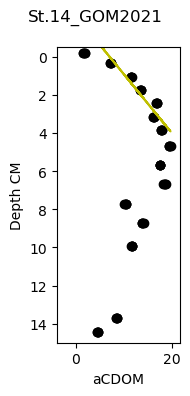

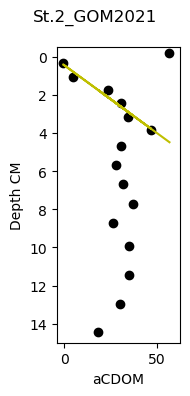

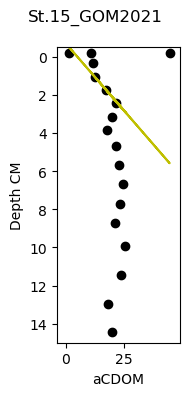

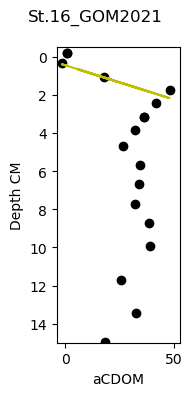

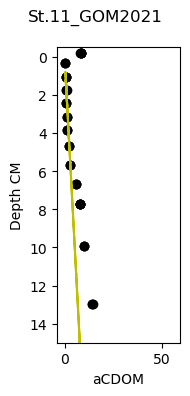

...

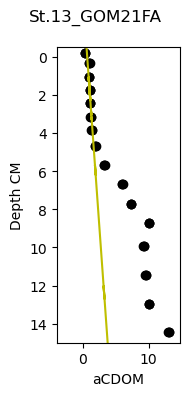

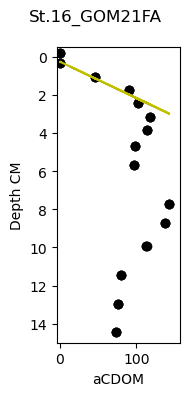

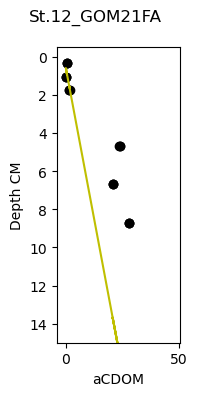

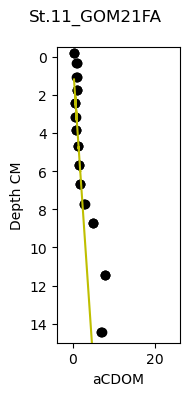

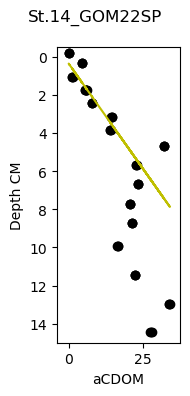

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


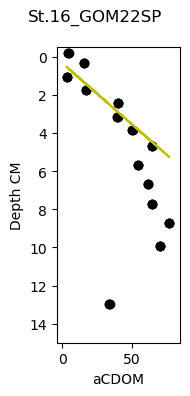

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


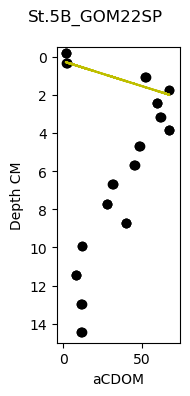

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


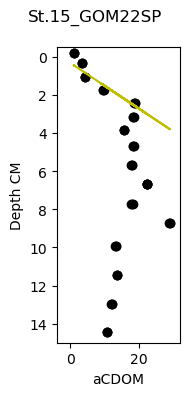

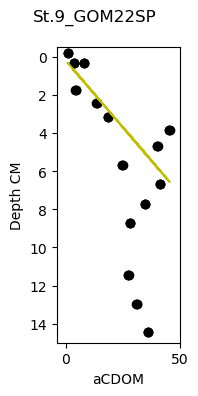

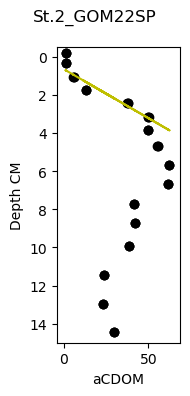

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


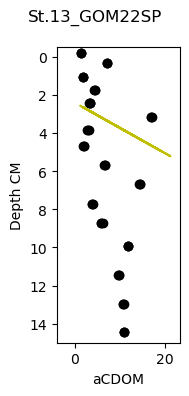

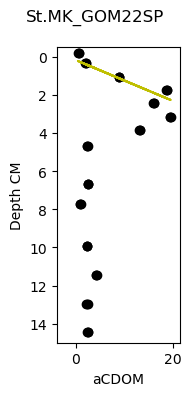

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


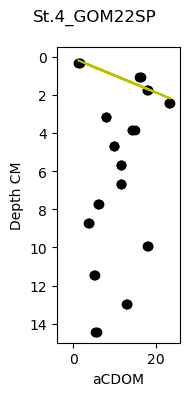

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


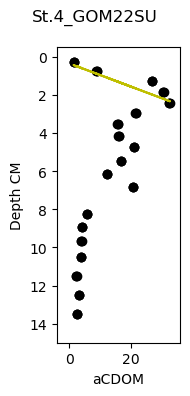

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6800\3683889536.py:44: RuntimeWarning: Mean of empty slice.
  por_mean = df_por_data.mean()
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


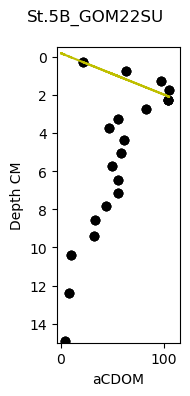

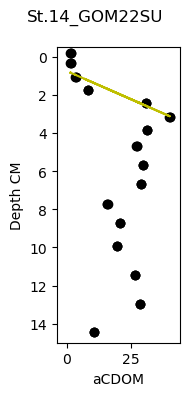

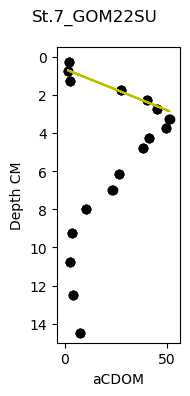

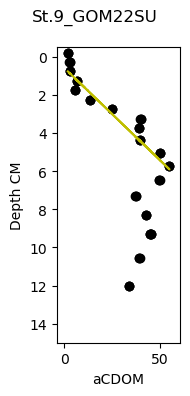

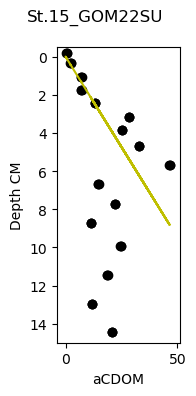

...

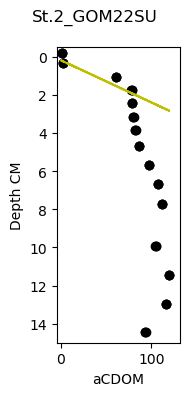

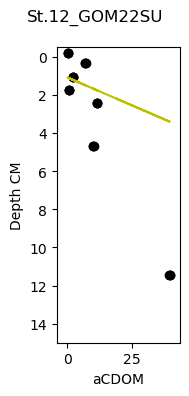

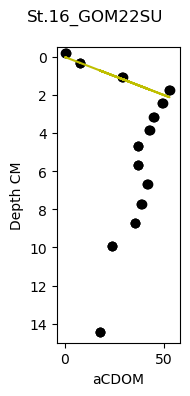

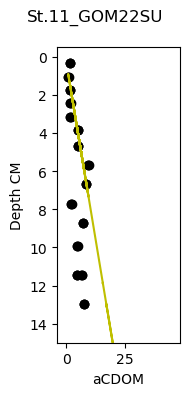

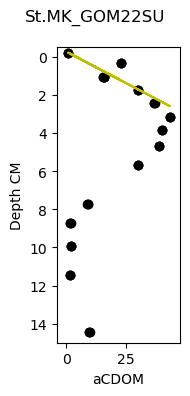

,slope_cdom_412_pw,rsquared_cdom_412_pw,std_err_cdom_412_pw,flux_cdom_412_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_aCDOM412_mmmol,pw_flux_aCDOM412,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,,
St.14_GOM2021,5.472668e+08,0.886659,3.697735e+07,4.0,0.836101,0.026545,6.0,0.010837,10278.859467,0.054057,28.726863,-89.601437,St.14,GOM2021
St.2_GOM2021,2.585183e+09,0.963418,2.518750e+08,4.0,0.893612,0.018307,6.0,0.007474,51895.237624,0.272922,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,1.363070e+09,1.000000,0.000000e+00,2.0,0.913782,0.023736,4.0,0.011868,27980.023995,0.147149,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,4.372979e+09,0.825356,1.422389e+09,3.0,0.878884,0.012766,5.0,0.005709,86336.856733,0.454053,28.876302,-89.547035,St.16,GOM2021
St.11_GOM2021,2.349890e+07,0.236446,1.273226e+07,3.0,0.886510,0.010708,5.0,0.004789,467.970168,0.002461,28.225724,-89.540904,St.11,GOM2021
St.7_GOM2021,1.048928e+09,0.855141,1.365211e+08,3.0,0.900131,0.015329,5.0,0.006855,21209.900022,0.111545,28.918272,-89.875616,St.7,GOM2021
St.5B_GOM21FA,3.392659e+09,0.841459,4.656874e+08,3.0,0.758168,0.033453,5.0,0.014961,57782.001150,0.303881,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,4.133196e+09,0.897835,5.269758e+08,3.0,0.707526,0.095821,6.0,0.039119,65692.489021,0.345483,28.795872,-90.702649,St.4,GOM21FA
St.7_GOM21FA,2.240066e+09,0.982076,9.569850e+07,3.0,0.862729,0.013460,6.0,0.005495,43413.260681,0.228314,28.910991,-89.872204,St.7,GOM21FA


In [26]:
Frames = []

#CDOM / 2.303 = A 
#A / E = C 
E_10mg_L = (1.54*(412/550)+9.13*(412/410))/2 # 10 mg / L
# C is conc of SRHA Xiao 2013 (assuming no Fe) tabel 3
HA_molar_mass = 226.139
E_mol_L = E_10mg_L / 10 / 1000 / HA_molar_mass 
E_mmol_m3 = E_mol_L *1000 /1000
E_412 = E_mmol_m3

def cdom_flux_cal(code, depth1, depth2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(2, 4)) 
    sub = df_cdom_pw_cl.loc[df_cdom_pw_cl['code'] == codes[code]]
    y = sub['Sample_depth']
    x = sub['a412']
    axs.scatter(x, y, c="black")
    yy = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'Sample_depth'].ravel() 
    
    xx = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'a412'].ravel()
    
    # Add subplot labels
    axs.set_xlabel('aCDOM')
    axs.set_ylabel('Depth CM')
    axs.set_ylim(15,-.50)
    axs.set_xlim(df_cdom_pw_cl['a412'].min(),sub['a412'].max()*1.1)
    
    if len(xx) > 1:
        # Add the slope value to the plot
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='y')        
        xx2 = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'Sample_depth'].ravel()/1000
        yy2 = sub.loc[(sub['Sample_depth'] < depth1) & (sub['Sample_depth'] > depth2), 'a412'].ravel() 
        yy2 = yy2 / (E_412 * 2.303)

        slope, intercept, r_value, p_value, std_err = stats.linregress(xx2, yy2)
        
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
    df_p = df_por.loc[df_por['code'] == codes[code]]
    df_por_data = df_p.loc[(df_p['depth'] < depth1) & (df_p['depth'] > 0), 'porosity'].ravel() 
    por_mean = df_por_data.mean()
    por_std = df_por_data.std()
    por_count = len(df_por_data)

        
    dic = {'code':[codes[code]],
           'slope_cdom_412_pw':[slope],
           'rsquared_cdom_412_pw':[rsquared], 
           'std_err_cdom_412_pw':[std_err], 
           'flux_cdom_412_depth_pw': [depth1], 
           'por_mean':por_mean,
           'por_sd': por_std, 
           'por_count':por_count}
        
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    Frames.append(slopes)
        
    # Add subplot labels
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    #print(Frames)
    
cdom_flux_cal(0, 4, 0)
cdom_flux_cal(1, 4, 0)
cdom_flux_cal(2, 2, .5)
cdom_flux_cal(3, 3, 0)
cdom_flux_cal(4, 3, 0)
cdom_flux_cal(5, 3, 0)
cdom_flux_cal(6, 3, 0)
cdom_flux_cal(7, 3, 0)
cdom_flux_cal(9, 3, 0)
cdom_flux_cal(10, 3, 0)
cdom_flux_cal(11, 3, 0)
cdom_flux_cal(12, 8, 1)
cdom_flux_cal(13, 3, 0)
cdom_flux_cal(14, 3, 1)
cdom_flux_cal(15, 3, 0)
cdom_flux_cal(16, 3, 0)
cdom_flux_cal(17, 6, .5)
cdom_flux_cal(19, 4, 0)
cdom_flux_cal(20, 4, 0)
cdom_flux_cal(21, 3, 0)
cdom_flux_cal(22, 3, 0)
cdom_flux_cal(23, 3, 0)
cdom_flux_cal(24, 3, 0)
cdom_flux_cal(25, 7, 0)
cdom_flux_cal(26, 3, 0)
cdom_flux_cal(27, 3, 0)
cdom_flux_cal(28, 3, 0)
cdom_flux_cal(29, 3, 0)
cdom_flux_cal(30, 3, 0)
cdom_flux_cal(31, 3, 0)
cdom_flux_cal(32, 3, 0)
cdom_flux_cal(33, 3, 0)
cdom_flux_cal(34, 3, 0)
cdom_flux_cal(35, 3, 0)
cdom_flux_cal(36, 3, 0)
cdom_flux_cal(37, 3, 0)
cdom_flux_cal(38, 3, 0)
cdom_flux_cal(39, 3, 0)

slopes_cdom_pw_412 = pd.concat(Frames, axis=0, ignore_index=False)

A = np.pi*(4.2388**2) 
slopes_cdom_pw_412['por_mean'].fillna(0.85, inplace=True)
slopes_cdom_pw_412['por_sd'].fillna(0, inplace=True)
slopes_cdom_pw_412['por_SE'] = slopes_cdom_pw_412['por_sd'] / (np.sqrt(slopes_cdom_pw_412['por_count']))
slopes_cdom_pw_412['por_SE'].fillna(0, inplace=True)

D_c = 2.6 * (10**-6) / 10000 * (86400) #0.000001728 

slopes_cdom_pw_412["pw_flux_aCDOM412_mmmol"] = slopes_cdom_pw_412["slope_cdom_412_pw"] * slopes_cdom_pw_412["por_mean"] * D_c
L = 1 #pathlength
slopes_cdom_pw_412["pw_flux_aCDOM412"] = slopes_cdom_pw_412["pw_flux_aCDOM412_mmmol"] * L * E_412 * 2.303 / L
slopes_cdom_pw_412 = pd.concat([slopes_cdom_pw_412, df_lat_lon], axis=1, join='outer')
slopes_cdom_pw_412['Stn'] = slopes_cdom_pw_412.index.str.split('_').str[0]
slopes_cdom_pw_412['Camp'] = slopes_cdom_pw_412.index.str.split('_').str[1]
slopes_cdom_pw_412 = slopes_cdom_pw_412.dropna(subset=['pw_flux_aCDOM412'])

slopes_cdom_pw_412 

## Benthic Chamber

In [27]:
#figure calculate Benthic chamber 

# Drop the rows where 'dil_fac' is greater than 6
df_doc_bc = df_doc_bc[df_doc_bc['dil_fac'] <= 2]

#DOC slopes 
df_doc_bc_plot = df_doc_bc[(df_doc_bc['NPOC_uM'] != 0)]
df_doc_bc_plot = df_doc_bc_plot.dropna(subset=["NPOC_uM"])
df_doc_bc_plot = df_doc_bc_plot[df_doc_bc_plot['code'] != 'St.13_GOM22SP']
codes = df_doc_bc_plot['code'].unique()

print(codes)

['St.5B_GOM21FA' 'St.15_GOM21FA' 'St.MK_GOM21FA' 'St.14_GOM21FA'
 'St.9_GOM21FA' 'St.7_GOM21FA' 'St.13_GOM21FA' 'St.12_GOM21FA'
 'St.7_GOM22SP' 'St.5B_GOM22SP' 'St.9_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.MK_GOM22SP' 'St.15_GOM22SP' 'St.2_GOM22SP'
 'St.4_GOM22SP' 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.14_GOM22SU'
 'St.MK_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU'
 'St.2_GOM22SU' 'St.13_GOM22SU' 'St.12_GOM22SU' 'St.16_GOM22SU'
 'St.11_GOM22SU']


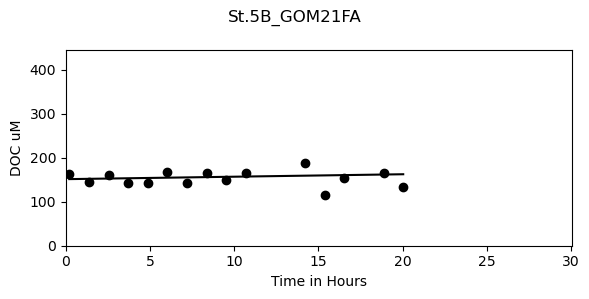

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12]


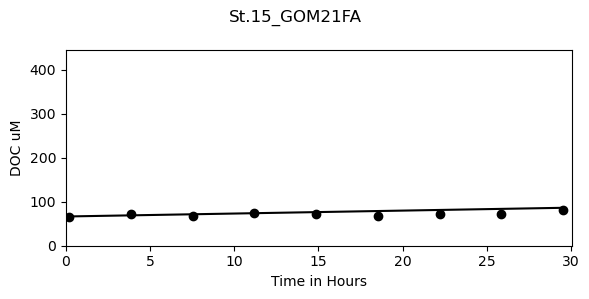

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12]


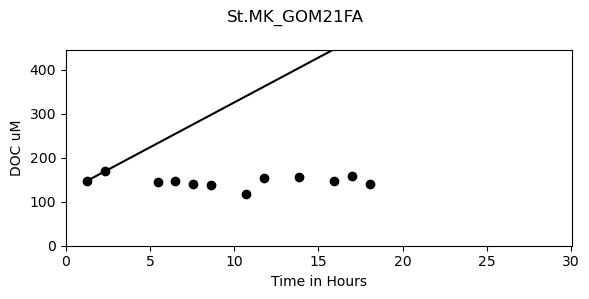

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4]


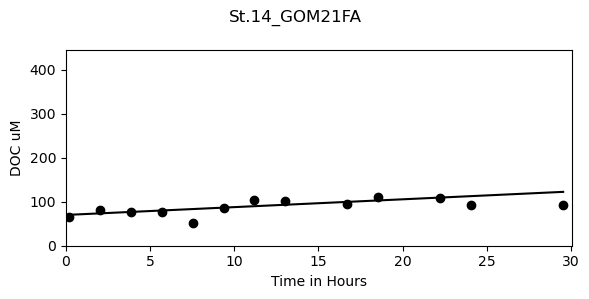

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6]


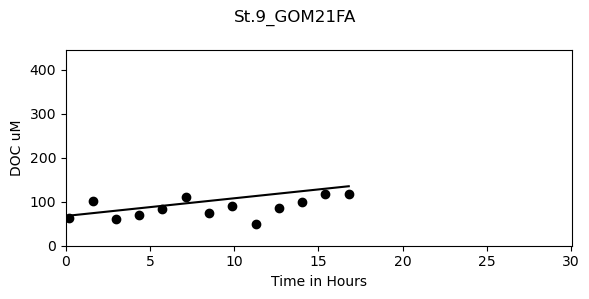

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

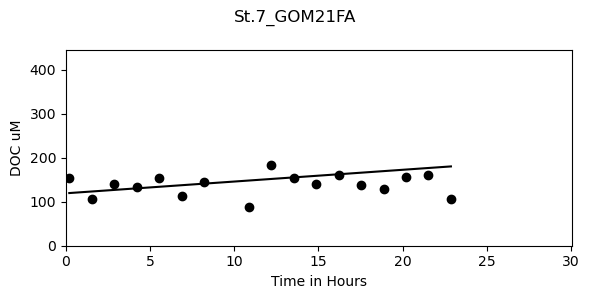

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

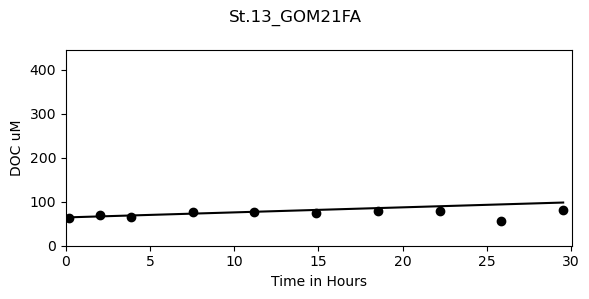

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

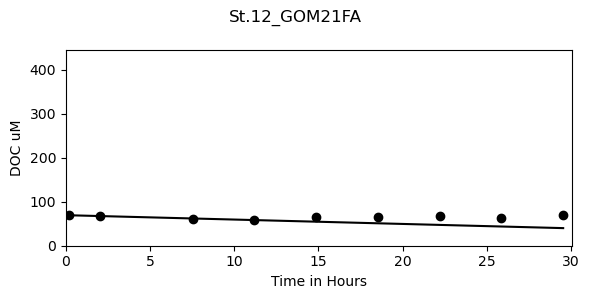

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

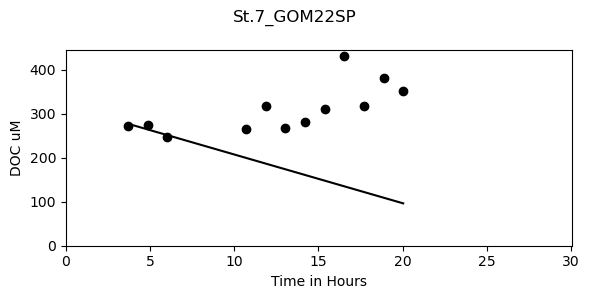

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

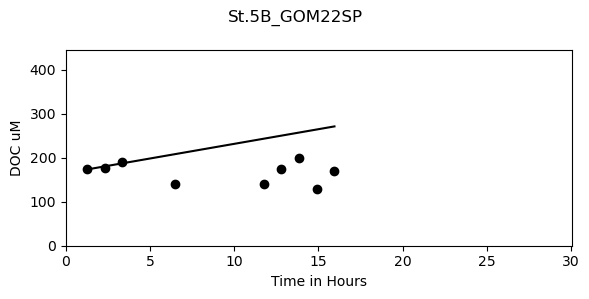

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

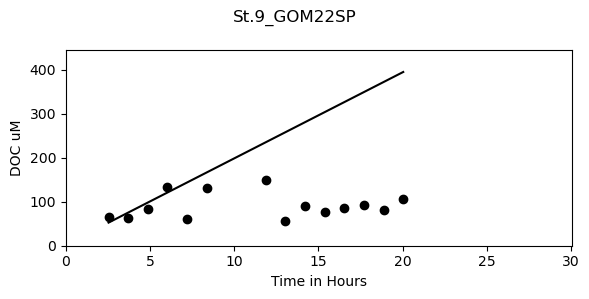

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

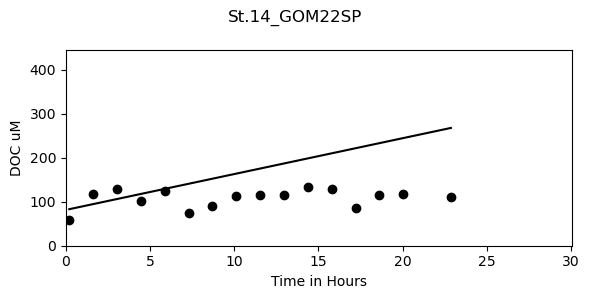

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

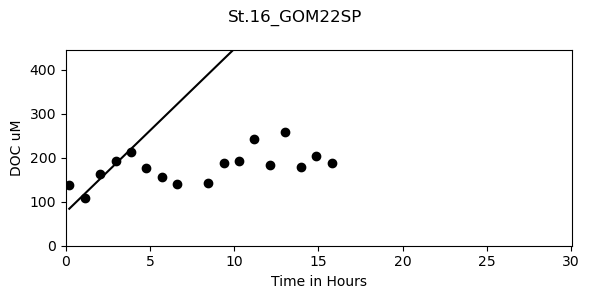

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

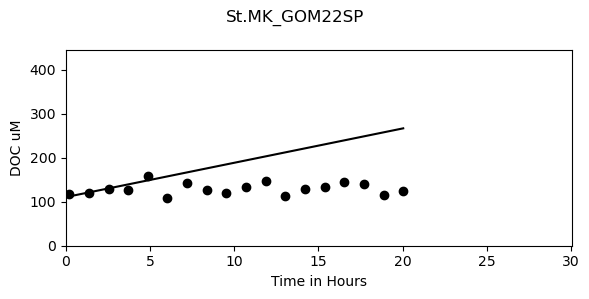

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

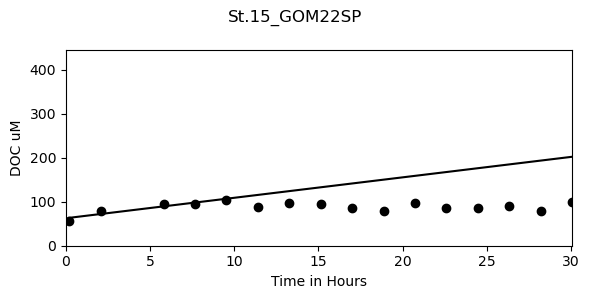

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

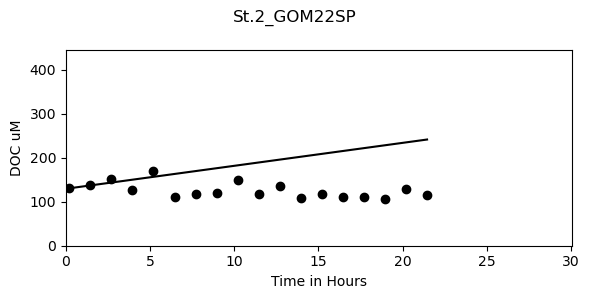

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

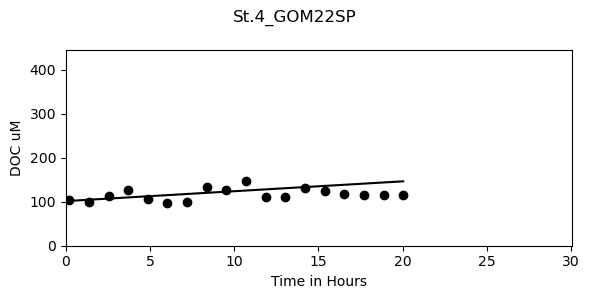

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

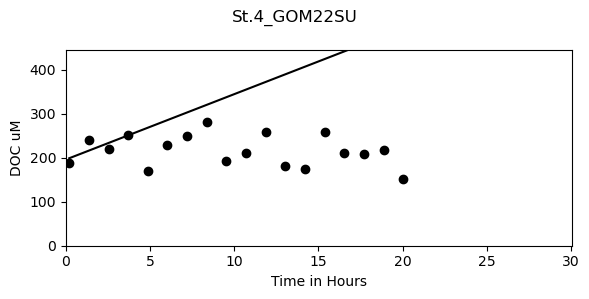

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

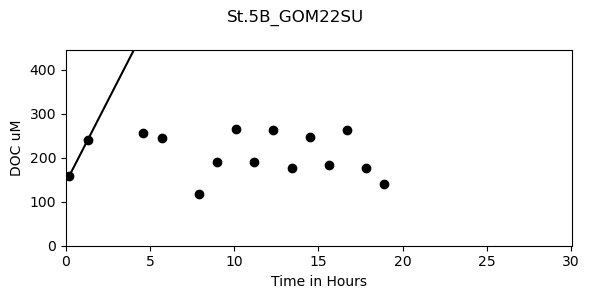

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


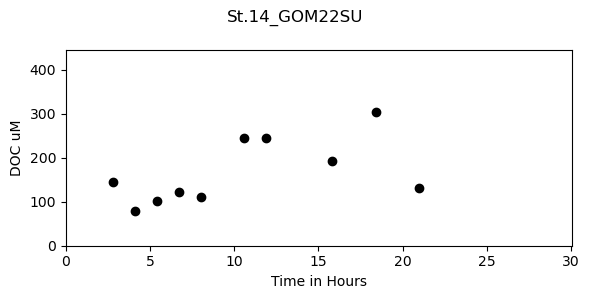

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

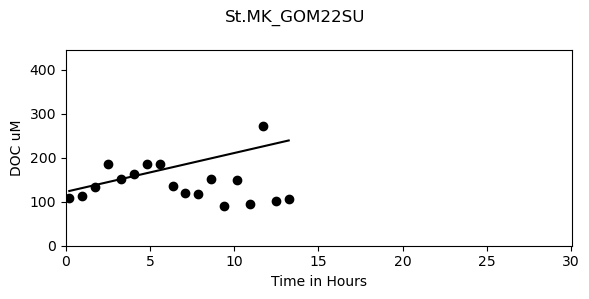

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

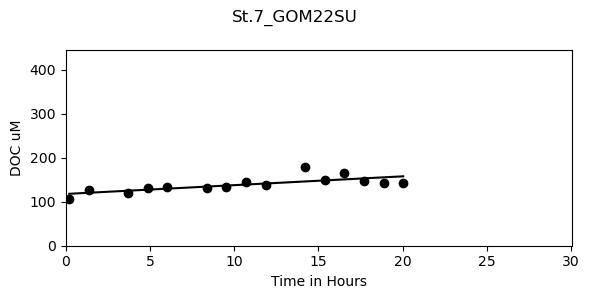

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

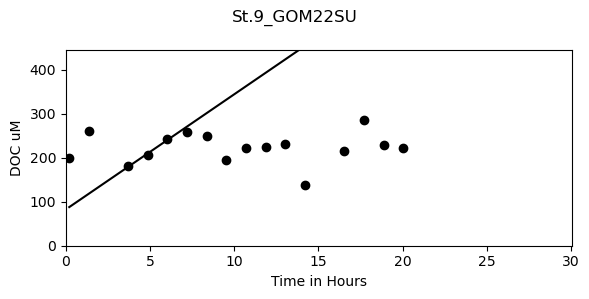

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

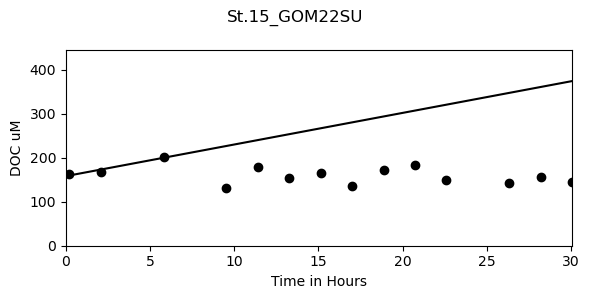

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

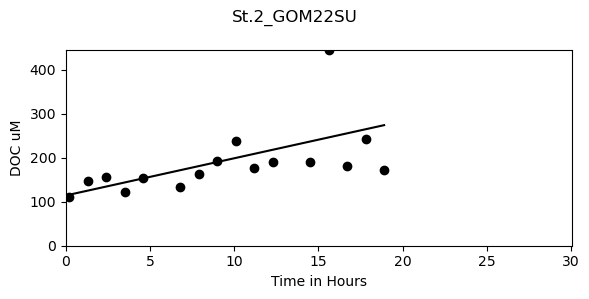

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

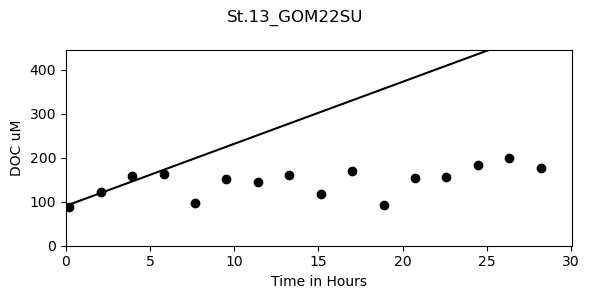

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

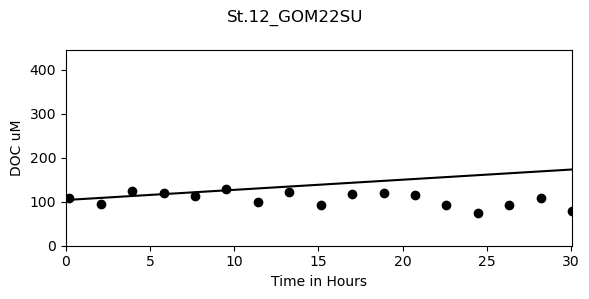

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

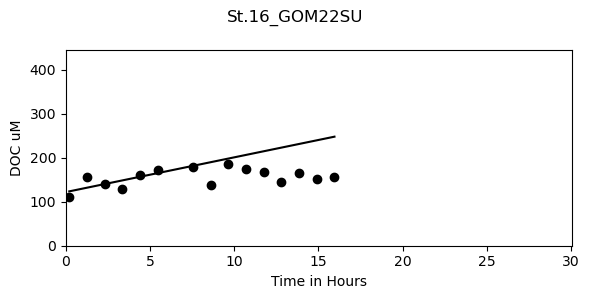

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

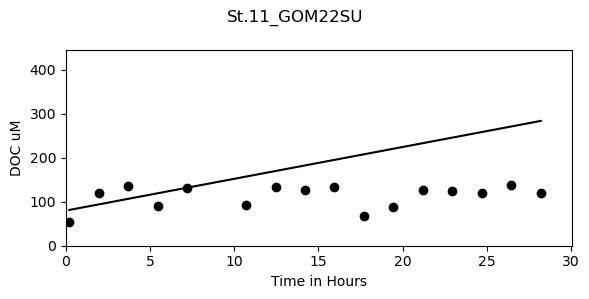

[               slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.5B_GOM21FA      0.558488         0.034495        1.044638                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.15_GOM21FA      0.669432         0.671371        0.331179                12,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.MK_GOM21FA     20.394436              1.0             0.0                 4,                slope_doc_bc  rsquared_doc_bc  std_err_doc_bc  flux_time_doc_bc
code                                                                          
St.14_GOM21FA      1.777518         0.409972        1.507851                 6,               slope_doc_bc  rsquared_doc_bc  st

,slope_doc_bc,rsquared_doc_bc,std_err_doc_bc,flux_time_doc_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_doc,bc_flux_doc_error
code,,,,,,,,,,,,
St.5B_GOM21FA,0.558488,0.034495,1.044638,12.0,GOM21FA,St.5B,0.116667,0.004714,28.806169,-91.335944,1.563766,2.924987
St.15_GOM21FA,0.669432,0.671371,0.331179,12.0,GOM21FA,St.15,0.140000,0.016330,28.950023,-88.846716,2.249291,1.112763
St.MK_GOM21FA,20.394436,1.000000,0.000000,4.0,GOM21FA,St.MK,0.217500,0.010897,28.913659,-90.328519,106.458957,0.000000
St.14_GOM21FA,1.777518,0.409972,1.507851,6.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,6.754570,5.729835
St.9_GOM21FA,4.022430,0.246080,3.520331,8.0,GOM21FA,St.9,0.115000,0.010801,28.782994,-89.599750,11.101907,9.716114
St.7_GOM21FA,2.672240,0.132028,3.425833,10.0,GOM21FA,St.7,0.170000,0.048477,28.910991,-89.872204,10.902740,13.977398
St.13_GOM21FA,1.145827,0.709124,0.423693,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,3.666646,1.355818
St.12_GOM21FA,-0.996918,0.925517,0.199978,12.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,-3.469275,0.695923
St.7_GOM22SP,-11.076840,0.700829,7.237186,10.0,GOM22SP,St.7,0.146667,0.010274,28.917214,-89.859921,-38.990476,25.474893


In [28]:
Frames = []

def doc_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_doc_bc_plot.loc[df_doc_bc_plot['code'] == codes[code]]
    x = sub['Time']
    y = sub['NPOC_uM']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['Time'] < time1) & (sub['Time'] > time2), 'Time'].ravel()
    yy = sub.loc[(sub['Time'] < time1) & (sub['Time'] > time2), 'NPOC_uM'].ravel()
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='black')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_doc_bc':[slope],
               'rsquared_doc_bc':[rsquared], 
               'std_err_doc_bc':[std_err], 
               'flux_time_doc_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('DOC uM')
    axs.set_xlim(0,df_doc_bc['Time'].max())
    axs.set_ylim(df_doc_bc['NPOC_uM'].min(),df_doc_bc['NPOC_uM'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
doc_flux_cal(0, 12, 0)
doc_flux_cal(1, 12, 0)
doc_flux_cal(2, 4, 0)
doc_flux_cal(3, 6, 0)
doc_flux_cal(4, 8, 0)
doc_flux_cal(5, 10, .5)
doc_flux_cal(6, 12, 0)
doc_flux_cal(7, 12, 0)
doc_flux_cal(8, 10, 0)
doc_flux_cal(9, 6, .5)
doc_flux_cal(10, 7, .5)
doc_flux_cal(11, 7, 0)
doc_flux_cal(12, 4, .5)
doc_flux_cal(13, 5, 0)
doc_flux_cal(14, 10, 0)
doc_flux_cal(15, 6, 0)
doc_flux_cal(16, 12, 0)
doc_flux_cal(17, 4, 0)
doc_flux_cal(18, 3, 0)
doc_flux_cal(19, 3, 0)
doc_flux_cal(20, 7, 0)
doc_flux_cal(21, 12, 3)
doc_flux_cal(22, 7, 3)
doc_flux_cal(23, 8, 0)
doc_flux_cal(24, 11, 0)
doc_flux_cal(25, 7, 0)
doc_flux_cal(26, 10, 0)
doc_flux_cal(27, 8, 0)
doc_flux_cal(28, 8, 0)

slopes_doc_bc = pd.concat(Frames, axis=0, ignore_index=False)

slopes_doc_bc = pd.concat([slopes_doc_bc, df_hights, df_lat_lon], axis=1, join='outer')
slopes_doc_bc = slopes_doc_bc.dropna(subset=['slope_doc_bc'])

slopes_doc_bc["bc_flux_doc"] = slopes_doc_bc["slope_doc_bc"] * slopes_doc_bc["Hight_m"]* 24 
slopes_doc_bc["bc_flux_doc_error"] = slopes_doc_bc["std_err_doc_bc"] * slopes_doc_bc["Hight_m"]* 24

slopes_doc_bc 

In [29]:
#figure calculate Benthic chamber 

#Nitrogen slops
df_tn_bc_plot = df_doc_bc[(df_doc_bc['TN_uM'] != 0)]
df_tn_bc_plot = df_tn_bc_plot.dropna(subset=["TN_uM"])
df_tn_bc_plot = df_tn_bc_plot[df_tn_bc_plot['code'] != 'St.13_GOM22SP']
codes = df_tn_bc_plot['code'].unique()

print(codes)
len(codes)

['St.5B_GOM21FA' 'St.15_GOM21FA' 'St.MK_GOM21FA' 'St.14_GOM21FA'
 'St.9_GOM21FA' 'St.7_GOM21FA' 'St.13_GOM21FA' 'St.12_GOM21FA'
 'St.7_GOM22SP' 'St.5B_GOM22SP' 'St.9_GOM22SP' 'St.14_GOM22SP'
 'St.16_GOM22SP' 'St.MK_GOM22SP' 'St.15_GOM22SP' 'St.2_GOM22SP'
 'St.4_GOM22SP' 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.14_GOM22SU'
 'St.MK_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU'
 'St.2_GOM22SU' 'St.13_GOM22SU' 'St.12_GOM22SU' 'St.16_GOM22SU'
 'St.11_GOM22SU']


29

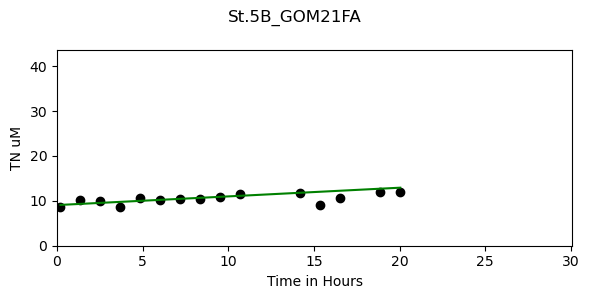

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12]


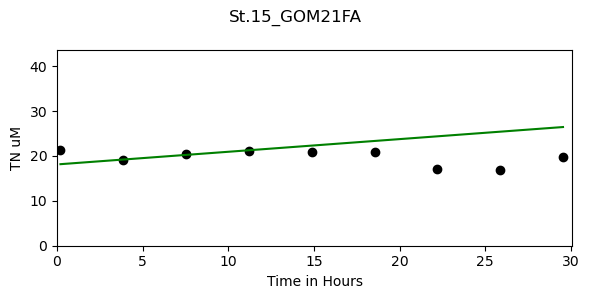

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12]


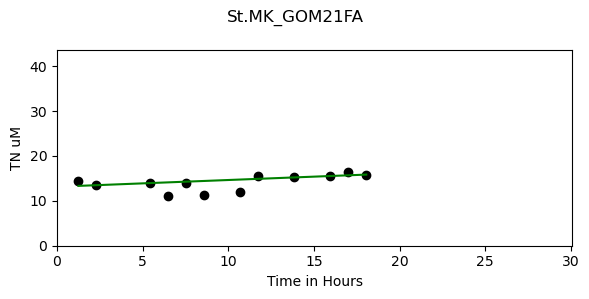

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6]


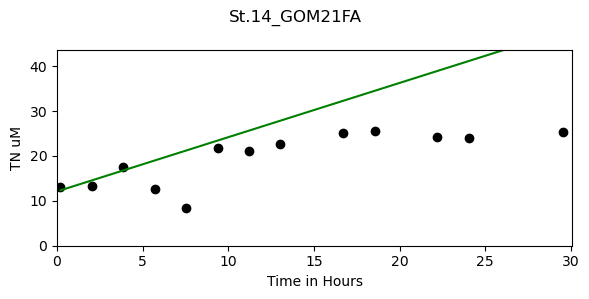

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5]


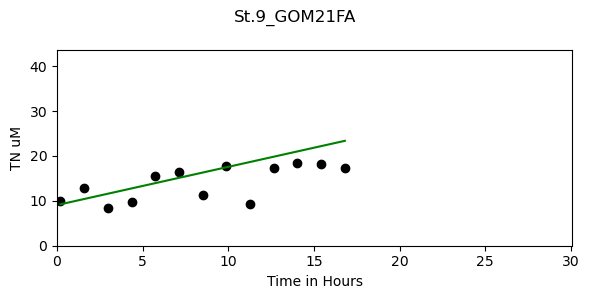

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

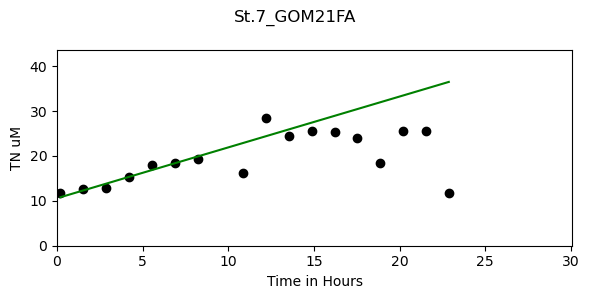

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

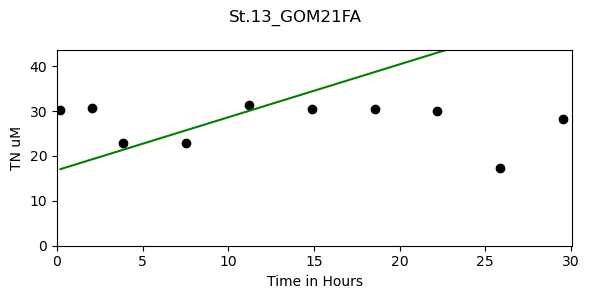

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

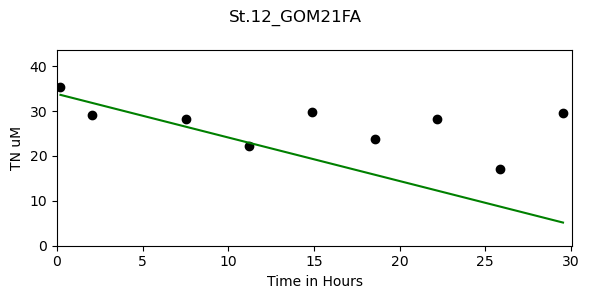

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

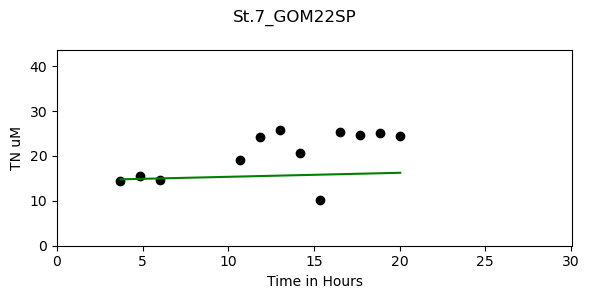

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

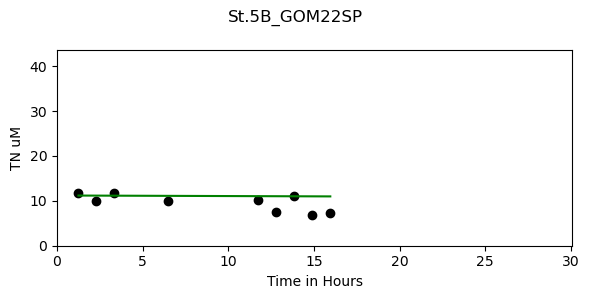

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

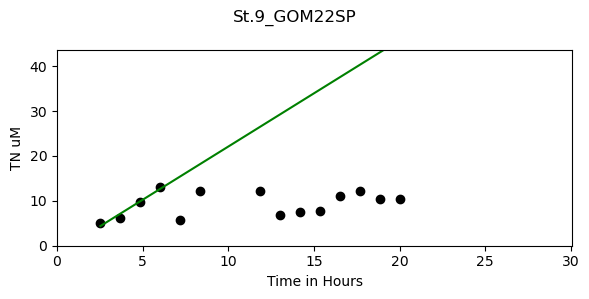

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

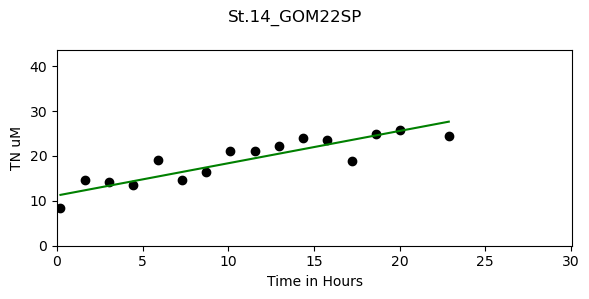

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

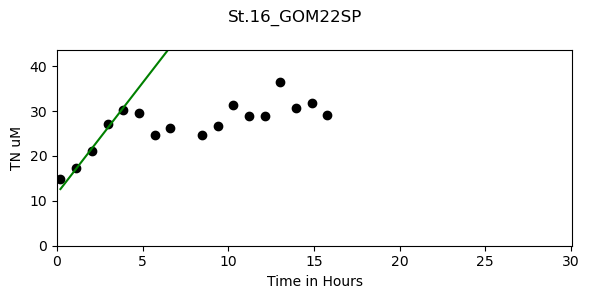

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

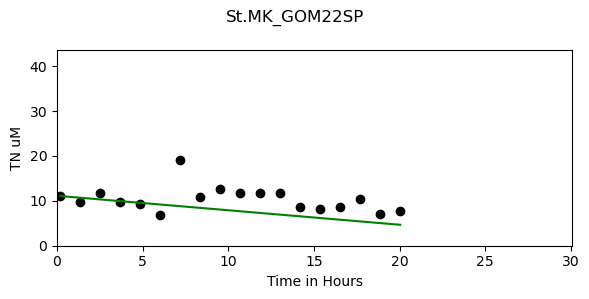

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

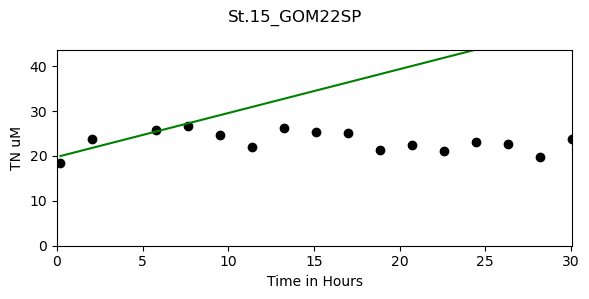

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

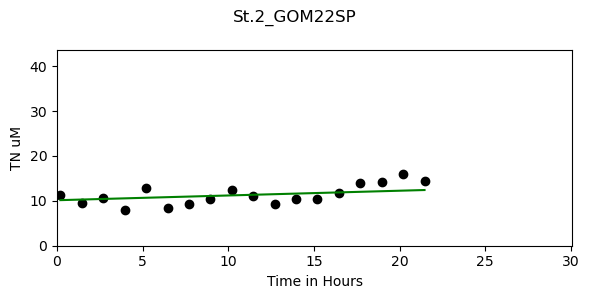

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

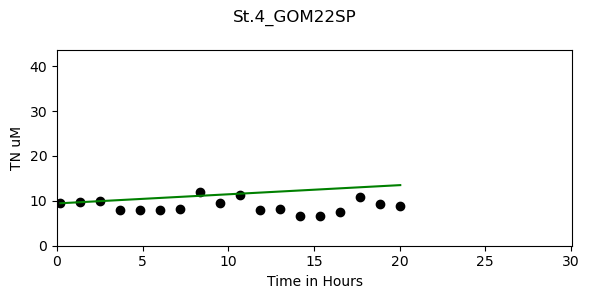

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

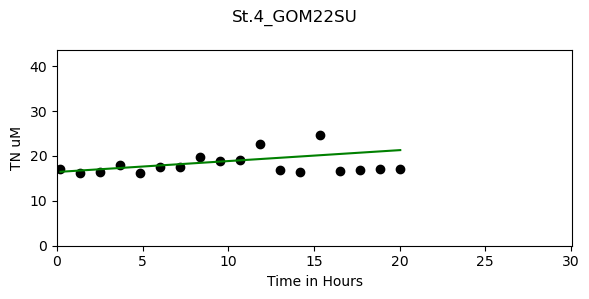

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

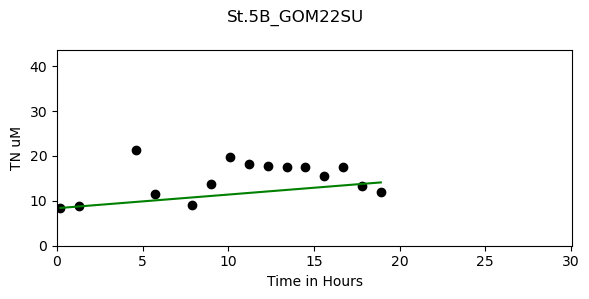

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


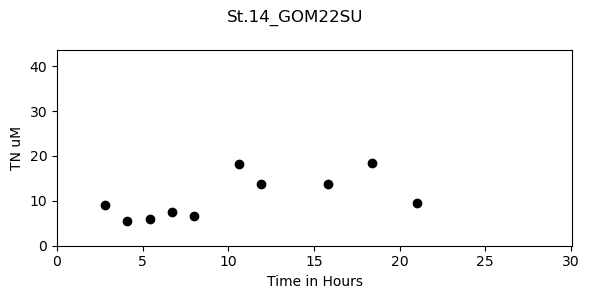

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

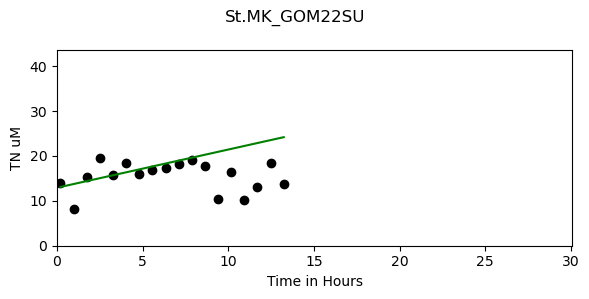

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

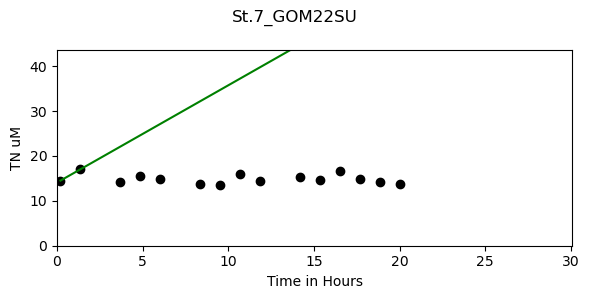

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

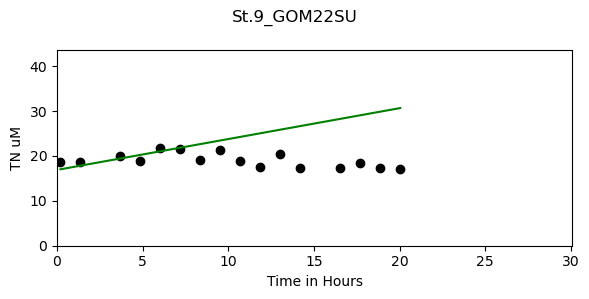

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

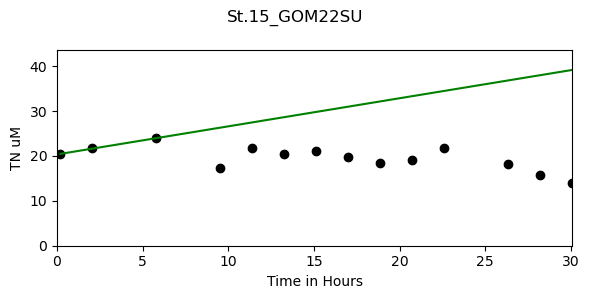

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

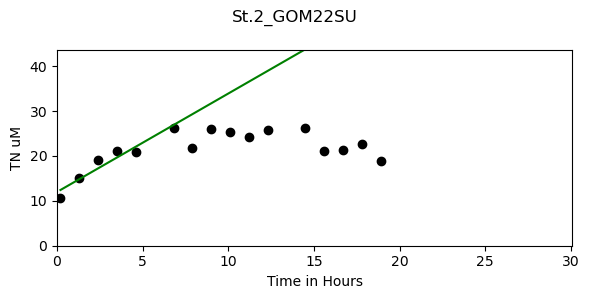

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

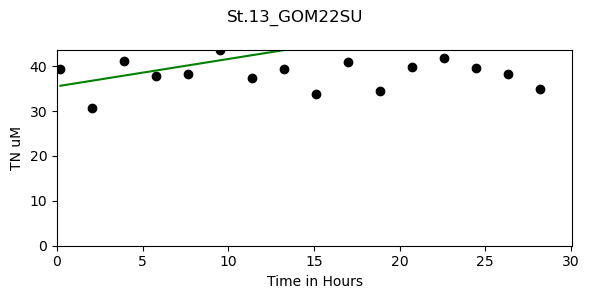

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

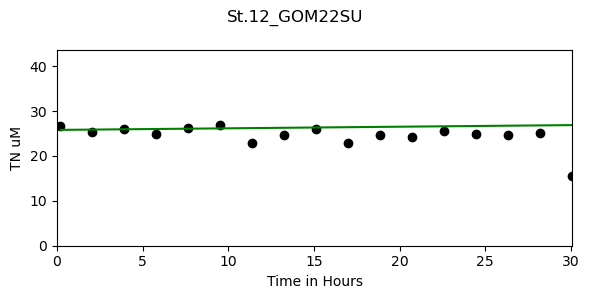

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

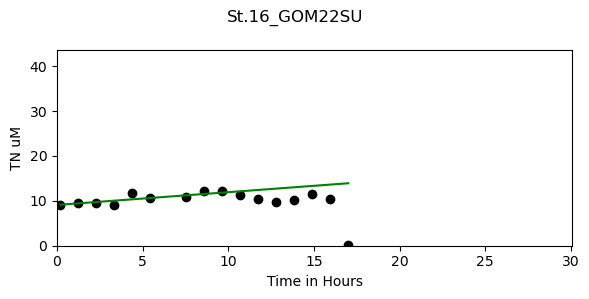

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

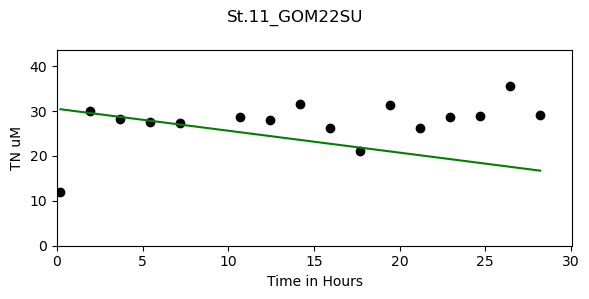

[               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.5B_GOM21FA     0.193375        0.602732       0.055505               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.15_GOM21FA     0.281981        0.962846       0.055392               12,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.MK_GOM21FA     0.149671             1.0            0.0                6,                slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                                                                      
St.14_GOM21FA     1.208409        0.779309       0.643059                5,               slope_tn_bc  rsquared_tn_bc  std_err_tn_bc  flux_time_tn_bc
code                 

,slope_tn_bc,rsquared_tn_bc,std_err_tn_bc,flux_time_tn_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_tn,bc_flux_tn_error
code,,,,,,,,,,,,
St.5B_GOM21FA,0.193375,0.602732,0.055505,12.0,GOM21FA,St.5B,0.116667,0.004714,28.806169,-91.335944,0.541451,0.155415
St.15_GOM21FA,0.281981,0.962846,0.055392,12.0,GOM21FA,St.15,0.140000,0.016330,28.950023,-88.846716,0.947455,0.186117
St.MK_GOM21FA,0.149671,1.000000,0.000000,6.0,GOM21FA,St.MK,0.217500,0.010897,28.913659,-90.328519,0.781281,0.000000
St.14_GOM21FA,1.208409,0.779309,0.643059,5.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,4.591954,2.443625
St.9_GOM21FA,0.851490,0.432481,0.487704,8.0,GOM21FA,St.9,0.115000,0.010801,28.782994,-89.599750,2.350113,1.346062
St.7_GOM21FA,1.132966,0.940904,0.141969,10.0,GOM21FA,St.7,0.170000,0.048477,28.910991,-89.872204,4.622502,0.579232
St.13_GOM21FA,1.179058,0.763007,0.657111,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,3.772987,2.102755
St.12_GOM21FA,-0.969629,0.837921,0.301545,12.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,-3.374309,1.049376
St.7_GOM22SP,0.089518,0.046521,0.405263,10.0,GOM22SP,St.7,0.146667,0.010274,28.917214,-89.859921,0.315102,1.426526


In [30]:
Frames = []

def tn_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_tn_bc_plot.loc[df_tn_bc_plot['code'] == codes[code]]
    x = sub['Time']
    y = sub['TN_uM']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['Time'] < time1) & (sub['Time'] > time2), 'Time'].ravel()
    yy = sub.loc[(sub['Time'] < time1) & (sub['Time'] > time2), 'TN_uM'].ravel()
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='g')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_tn_bc':[slope],
               'rsquared_tn_bc':[rsquared], 
               'std_err_tn_bc':[std_err], 
               'flux_time_tn_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('TN uM')
    axs.set_xlim(0,df_doc_bc['Time'].max())
    axs.set_ylim(df_doc_bc['TN_uM'].min(),df_doc_bc['TN_uM'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
tn_flux_cal(0, 12, 0)
tn_flux_cal(1, 12, .5)
tn_flux_cal(2, 6, 1.5)
tn_flux_cal(3, 5, 0)
tn_flux_cal(4, 8, 0)
tn_flux_cal(5, 10, .5)
tn_flux_cal(6, 12, 3)
tn_flux_cal(7, 12, 0)
tn_flux_cal(8, 10, 0)
tn_flux_cal(9, 6, .5)
tn_flux_cal(10, 7, 1.5)
tn_flux_cal(11, 10, 0)
tn_flux_cal(12, 4, .5)
tn_flux_cal(13, 5, 0)
tn_flux_cal(14, 9, 0)
tn_flux_cal(15, 6, 0)
tn_flux_cal(16, 3, 0)
tn_flux_cal(17, 4, 0)
tn_flux_cal(18, 3, 0)
tn_flux_cal(19, 3, 0)
tn_flux_cal(20, 7, 0)
tn_flux_cal(21, 3, 0)
tn_flux_cal(22, 7, 3)
tn_flux_cal(23, 8, 0)
tn_flux_cal(24, 7, 0)
tn_flux_cal(25, 10, 0)
tn_flux_cal(26, 10, 0)
tn_flux_cal(27, 8, 0)
tn_flux_cal(28, 8, 1)

slopes_tn_bc = pd.concat(Frames, axis=0, ignore_index=False)

slopes_tn_bc = pd.concat([slopes_tn_bc, df_hights, df_lat_lon], axis=1, join='outer')
slopes_tn_bc = slopes_tn_bc.dropna(subset=['slope_tn_bc'])

slopes_tn_bc["bc_flux_tn"] = slopes_tn_bc['slope_tn_bc'] * slopes_tn_bc["Hight_m"] *24 
slopes_tn_bc["bc_flux_tn_error"] = slopes_tn_bc["std_err_tn_bc"] * slopes_tn_bc["Hight_m"]* 24

slopes_tn_bc 

In [31]:
#figure calculate Benthic chamber 

#Fe2 slops
#df_iron_bc_fe2_cl = df_iron_bc.drop(df_iron_bc[(df_iron_bc['Fe2_uM'] == 0) | (df_iron_bc['Fe2_uM'].isna())].index)
df_iron_bc_fe2_cl = df_iron_bc.drop(df_iron_bc[(df_iron_bc['Fe2_uM'] == np.nan) | (df_iron_bc['Fe2_uM'].isna())].index)
codes = df_iron_bc_fe2_cl['code'].unique()

print(codes)
len(codes)

['St.MK_GOM2021' 'St.5B_GOM2021' 'St.4_GOM2021' 'St.14_GOM2021'
 'St.9_GOM2021' 'St.13_GOM2021' 'St.2_GOM2021' 'St.15_GOM2021'
 'St.16_GOM2021' 'St.11_GOM2021' 'St.7_GOM2021' 'St.5B_GOM21FA'
 'St.MK_GOM21FA' 'St.7_GOM21FA' 'St.14_GOM21FA' 'St.9_GOM21FA'
 'St.15_GOM21FA' 'St.13_GOM21FA' 'St.16_GOM21FA' 'St.7_GOM22SP'
 'St.14_GOM22SP' 'St.16_GOM22SP' 'St.5B_GOM22SP' 'St.15_GOM22SP'
 'St.9_GOM22SP' 'St.2_GOM22SP' 'St.MK_GOM22SP' 'St.4_GOM22SU'
 'St.5B_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU'
 'St.13_GOM22SU' 'St.2_GOM22SU' 'St.12_GOM22SU' 'St.16_GOM22SU'
 'St.11_GOM22SU' 'St.MK_GOM22SU']


38

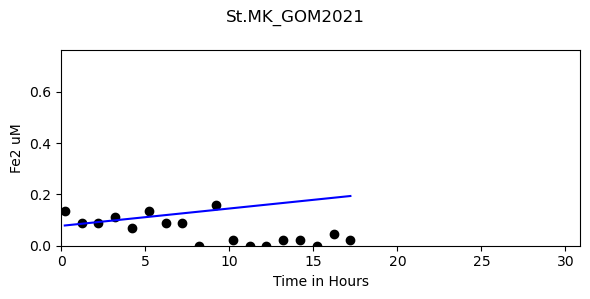

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6]


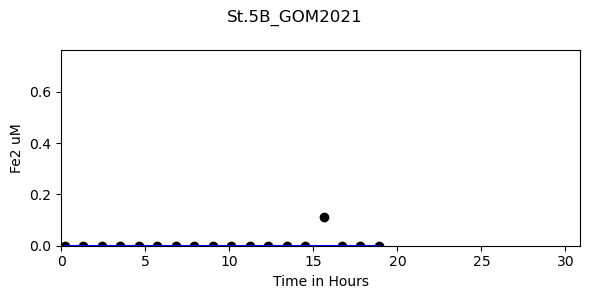

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12]


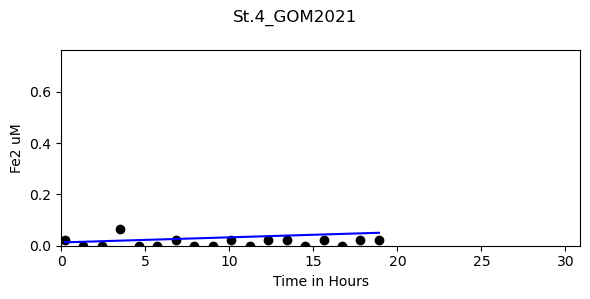

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5]


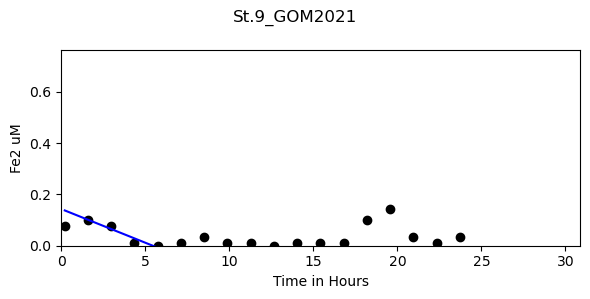

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6]


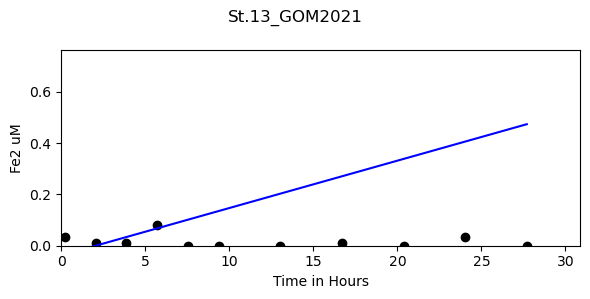

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

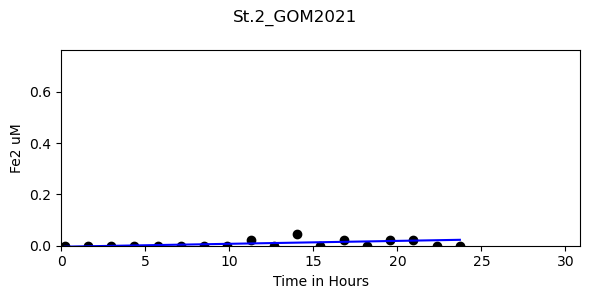

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

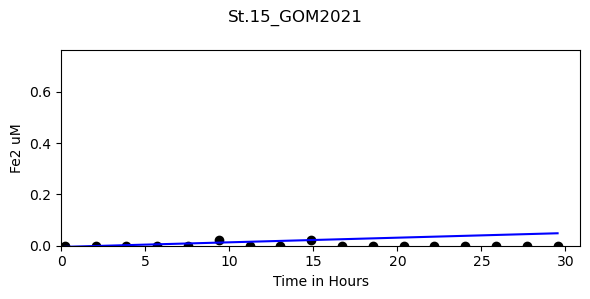

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

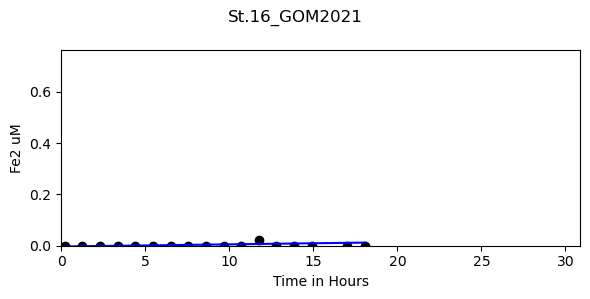

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

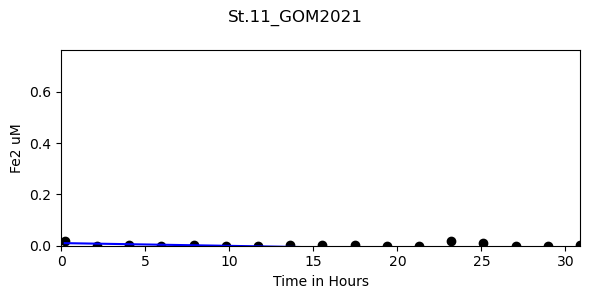

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

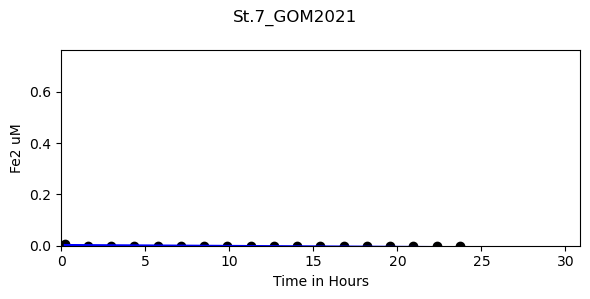

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

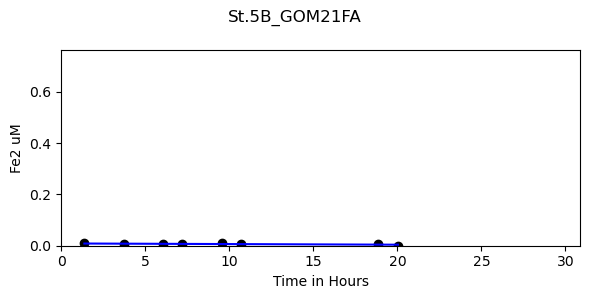

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

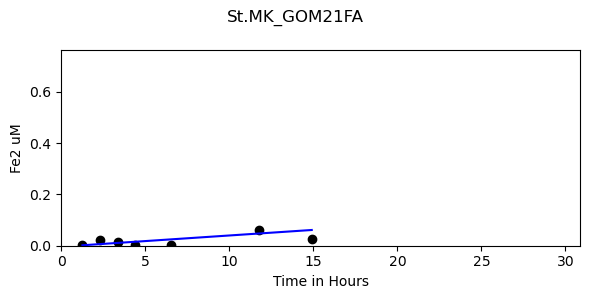

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

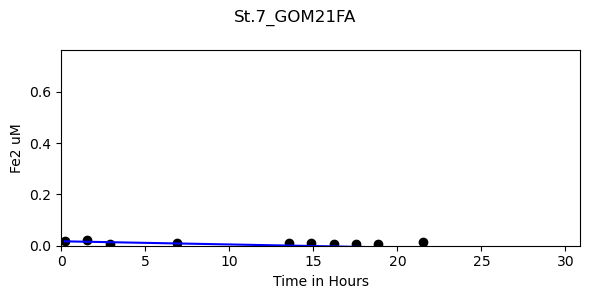

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

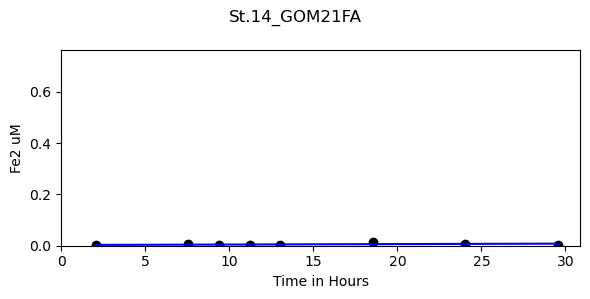

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

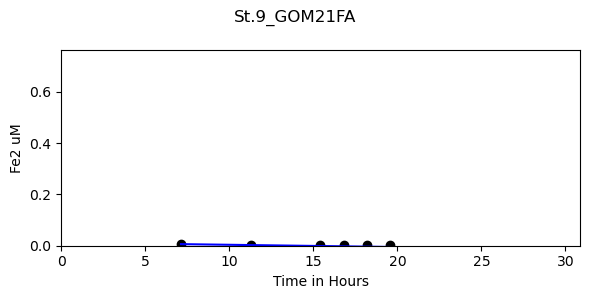

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

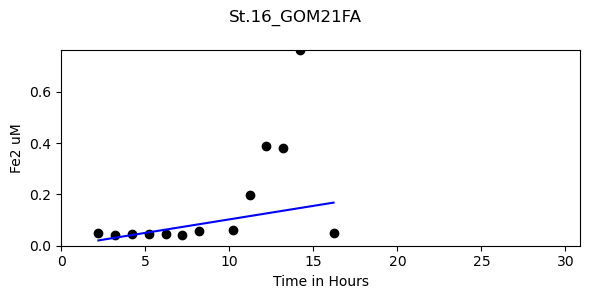

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

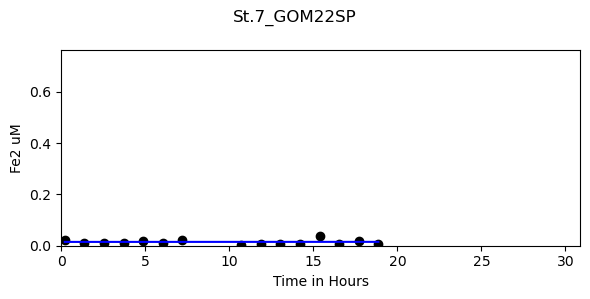

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

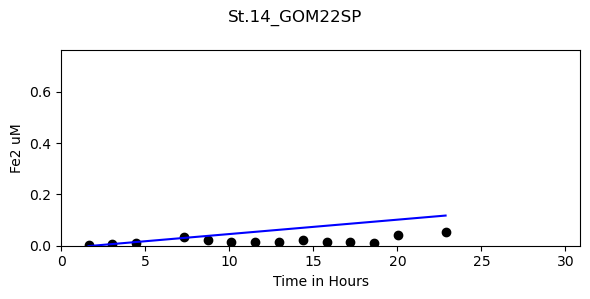

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

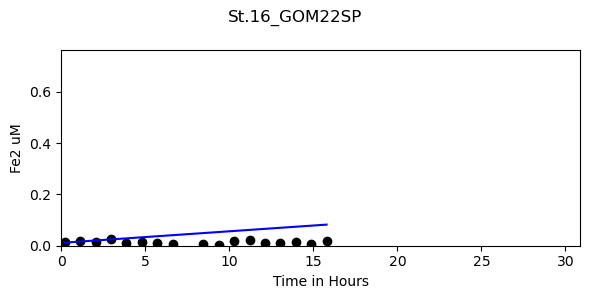

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

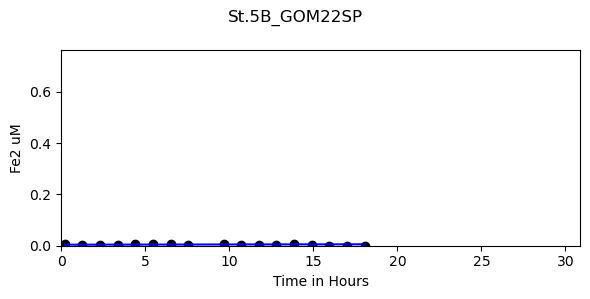

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

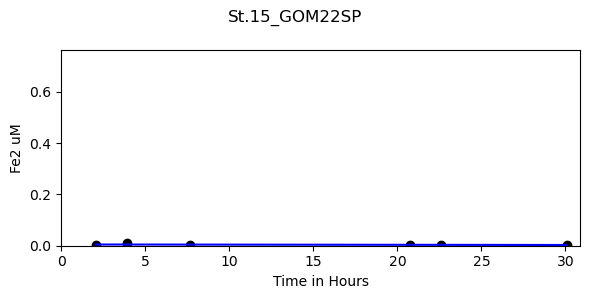

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

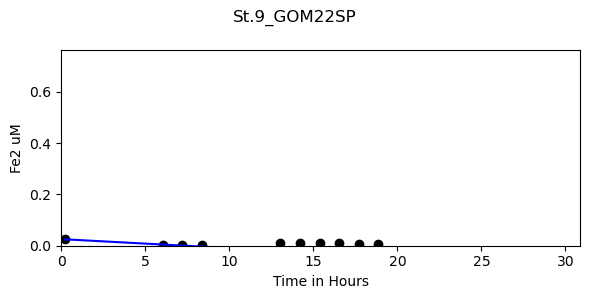

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

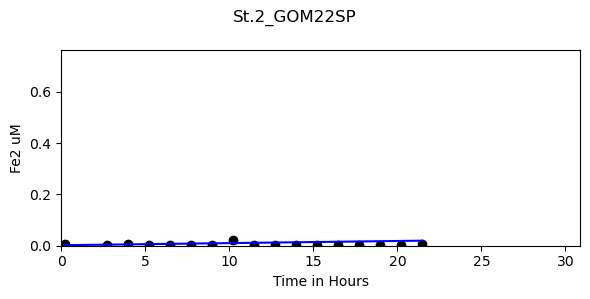

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

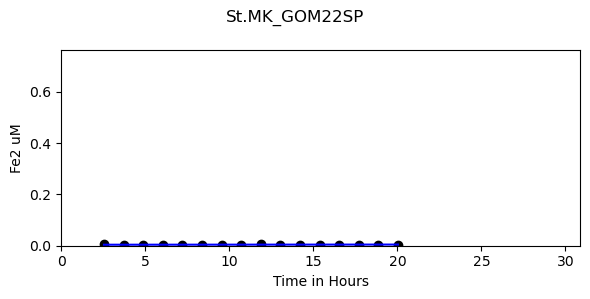

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

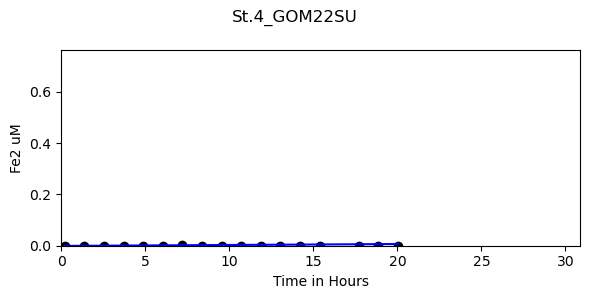

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

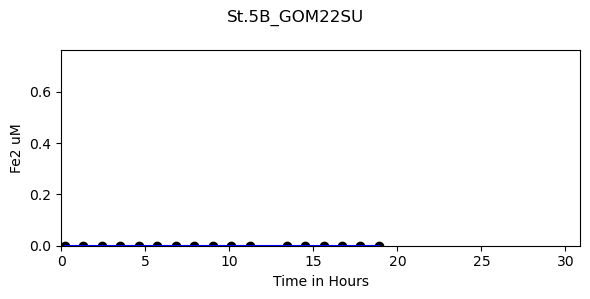

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

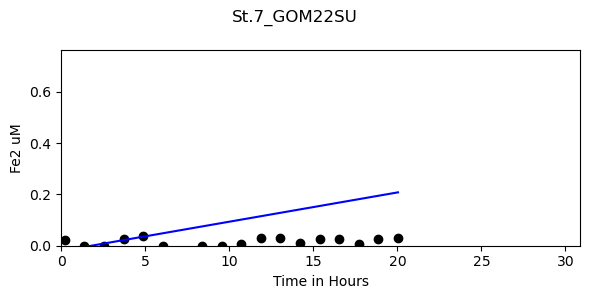

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

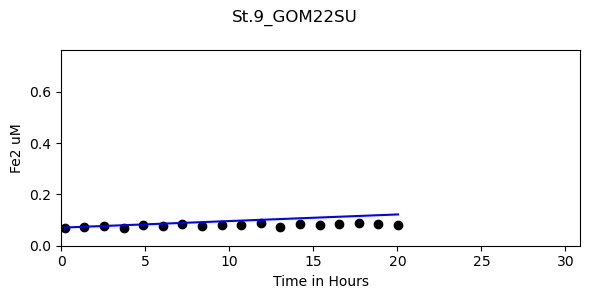

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

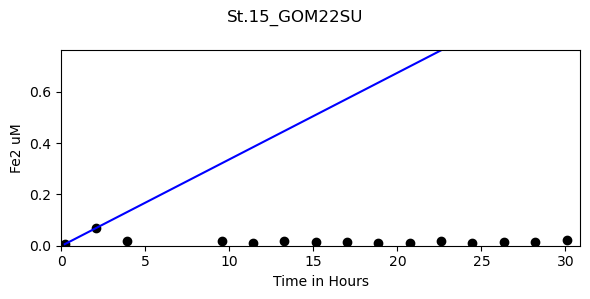

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

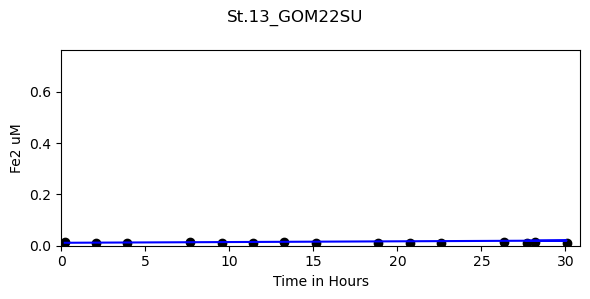

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

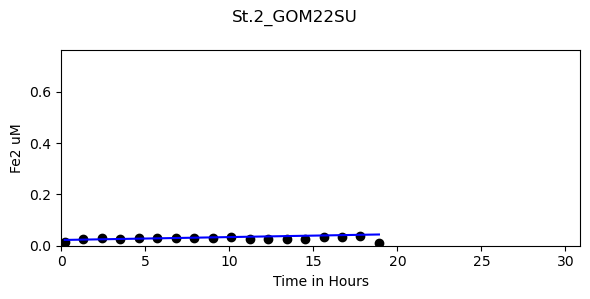

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

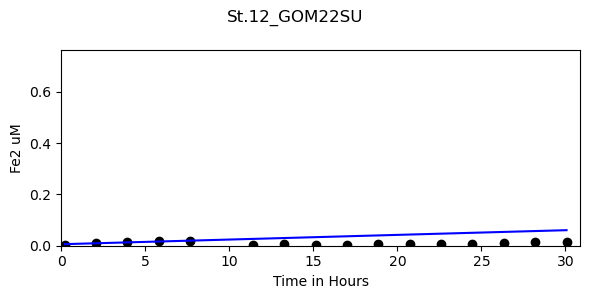

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

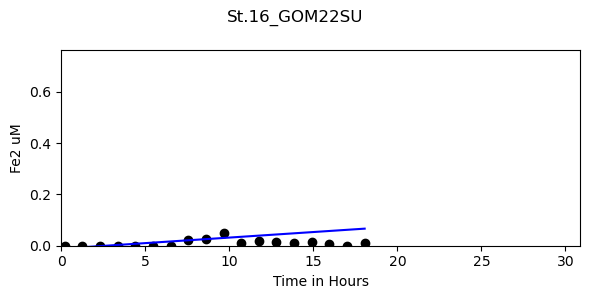

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

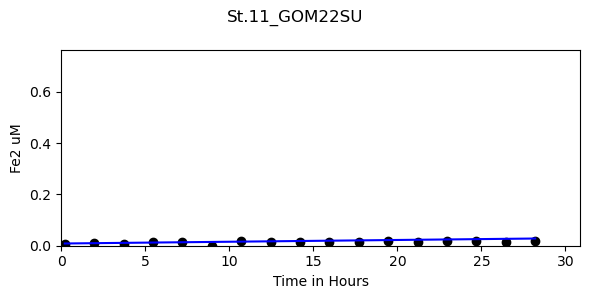

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

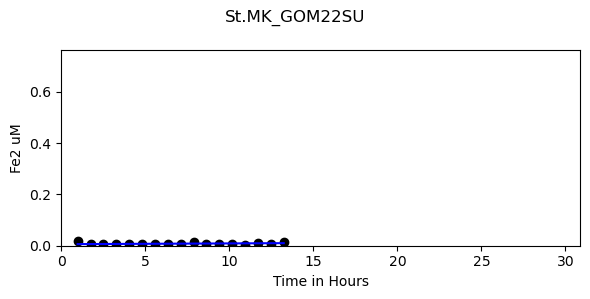

[               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.MK_GOM2021      0.006761         0.173077        0.008532                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                          
St.5B_GOM2021           0.0              0.0             0.0                12,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.4_GOM2021      0.001994         0.014706        0.009424                 5,               slope_fe2_bc  rsquared_fe2_bc  std_err_fe2_bc  flux_time_fe2_bc
code                                                                         
St.9_GOM2021     -0.026252         0.926808        0.005216                 6,                slope_fe2_bc  rsquared_fe2_bc  std_err

,slope_fe2_bc,rsquared_fe2_bc,std_err_fe2_bc,flux_time_fe2_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_fe2,bc_flux_fe2_error
code,,,,,,,,,,,,
St.MK_GOM2021,0.006761,0.173077,0.008532,6.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.032655,0.041210
St.5B_GOM2021,0.000000,0.000000,0.000000,12.0,GOM2021,St.5B,0.158750,0.005449,28.811667,-91.343178,0.000000,0.000000
St.4_GOM2021,0.001994,0.014706,0.009424,5.0,GOM2021,St.4,0.163500,0.021372,28.799256,-90.711336,0.007825,0.036978
St.9_GOM2021,-0.026252,0.926808,0.005216,6.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,-0.044890,0.008920
St.13_GOM2021,0.018459,0.749999,0.010658,7.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.031012,0.017905
St.2_GOM2021,0.001136,0.300000,0.000656,12.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.003135,0.001810
St.15_GOM2021,0.001806,0.428572,0.001043,10.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.005128,0.002961
St.16_GOM2021,0.000849,0.230769,0.000490,12.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.002580,0.001490
St.11_GOM2021,-0.001081,0.401786,0.000590,12.0,GOM2021,St.11,0.176667,0.012472,28.225724,-89.540904,-0.004584,0.002501


In [32]:
Frames = []

def fe2_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_iron_bc_fe2_cl.loc[df_iron_bc_fe2_cl['code'] == codes[code]]
    x = sub['Fe2_Time']
    y = sub['Fe2_uM']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['Fe2_Time'] < time1) & (sub['Fe2_Time'] > time2), 'Fe2_Time'].ravel()
    yy = sub.loc[(sub['Fe2_Time'] < time1) & (sub['Fe2_Time'] > time2), 'Fe2_uM'].ravel()
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='b')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_fe2_bc':[slope],
               'rsquared_fe2_bc':[rsquared], 
               'std_err_fe2_bc':[std_err], 
               'flux_time_fe2_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('Fe2 uM')
    axs.set_xlim(0,df_iron_bc_fe2_cl['Fe2_Time'].max())
    axs.set_ylim(df_iron_bc_fe2_cl['Fe2_uM'].min(),df_iron_bc_fe2_cl['Fe2_uM'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
fe2_flux_cal(0, 6, .5)
fe2_flux_cal(1, 12, 0)
fe2_flux_cal(2, 5, 0)
#fe2_flux_cal(3, 2, 0)
fe2_flux_cal(4, 6, 1)
fe2_flux_cal(5, 7, 1)
fe2_flux_cal(6, 12, 0)
fe2_flux_cal(7, 10, 0)
fe2_flux_cal(8, 12, 0)
fe2_flux_cal(9, 12, 0)
fe2_flux_cal(10, 12, 0)
fe2_flux_cal(11, 12, 0)
fe2_flux_cal(12, 12, 0)
fe2_flux_cal(13, 10, 0)
fe2_flux_cal(14, 10, 0)
fe2_flux_cal(15, 12, 0)
fe2_flux_cal(18, 12, 0)
fe2_flux_cal(19, 8, 0)
fe2_flux_cal(20, 8, 0)
fe2_flux_cal(21, 3, 0)
fe2_flux_cal(22, 8, 0)
fe2_flux_cal(23, 8, 0)
fe2_flux_cal(24, 8, 0)
fe2_flux_cal(25, 11, 0)
fe2_flux_cal(26, 12, 0)
fe2_flux_cal(27, 8, 0)
fe2_flux_cal(28, 12, 0)
fe2_flux_cal(29, 5, 0.5)
fe2_flux_cal(30, 3, 0)
fe2_flux_cal(31, 3, 0)
fe2_flux_cal(32, 8, 0)
fe2_flux_cal(33, 10, 0)
fe2_flux_cal(34, 8, 0)
fe2_flux_cal(35, 10, 0)
fe2_flux_cal(36, 6, 0)
fe2_flux_cal(37, 8, 1)

slopes_fe2_bc = pd.concat(Frames, axis=0, ignore_index=False)

slopes_fe2_bc = pd.concat([slopes_fe2_bc, df_hights, df_lat_lon], axis=1, join='outer')
slopes_fe2_bc = slopes_fe2_bc.dropna(subset=['slope_fe2_bc'])

slopes_fe2_bc["bc_flux_fe2"] = slopes_fe2_bc["slope_fe2_bc"] * slopes_fe2_bc["Hight_m"] * 24 
slopes_fe2_bc["bc_flux_fe2_error"] = slopes_fe2_bc["std_err_fe2_bc"] * slopes_fe2_bc["Hight_m"] * 24 

slopes_fe2_bc  

In [33]:
#figure calculate Benthic chamber 

#Fe3 slops
#df_iron_bc_fe3_cl = df_iron_bc.drop(df_iron_bc[(df_iron_bc['Fe3_uM'] == 0) | (df_iron_bc['Fe3_uM'].isna())].index)
df_iron_bc_fe3_cl = df_iron_bc.drop(df_iron_bc[(df_iron_bc['Fe3_uM'] == np.nan) | (df_iron_bc['Fe3_uM'].isna())].index)
codes = df_iron_bc_fe3_cl['code'].unique()

print(codes)
len(codes)

['St.MK_GOM2021' 'St.5B_GOM2021' 'St.4_GOM2021' 'St.14_GOM2021'
 'St.9_GOM2021' 'St.13_GOM2021' 'St.2_GOM2021' 'St.15_GOM2021'
 'St.16_GOM2021' 'St.11_GOM2021' 'St.7_GOM2021' 'St.7_GOM21FA'
 'St.13_GOM21FA' 'St.7_GOM22SP' 'St.16_GOM22SP' 'St.15_GOM22SP'
 'St.9_GOM22SP' 'St.2_GOM22SP' 'St.4_GOM22SU' 'St.5B_GOM22SU'
 'St.7_GOM22SU' 'St.9_GOM22SU' 'St.15_GOM22SU' 'St.13_GOM22SU'
 'St.2_GOM22SU' 'St.12_GOM22SU' 'St.16_GOM22SU' 'St.11_GOM22SU'
 'St.MK_GOM22SU']


29

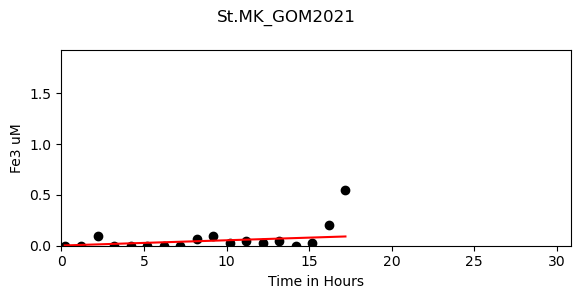

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10]


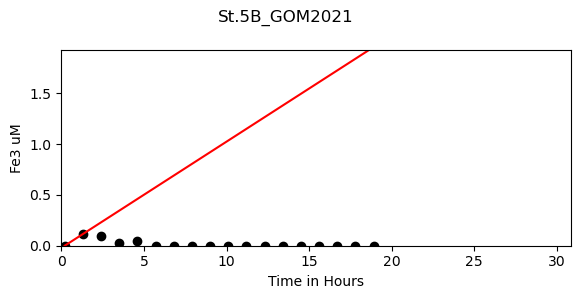

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2]


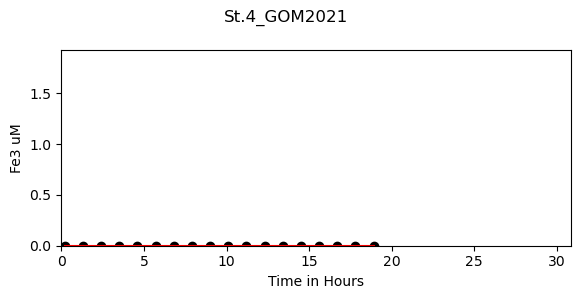

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12]


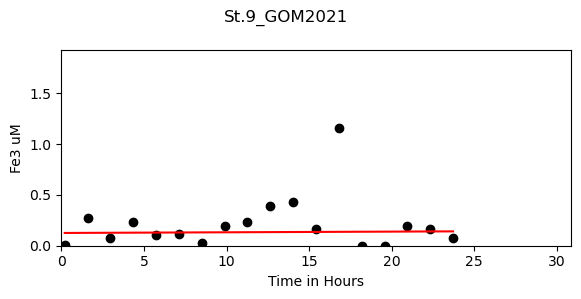

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10]


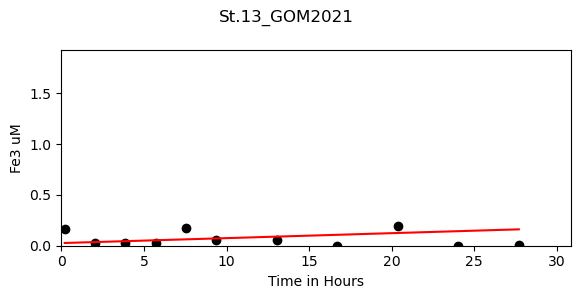

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

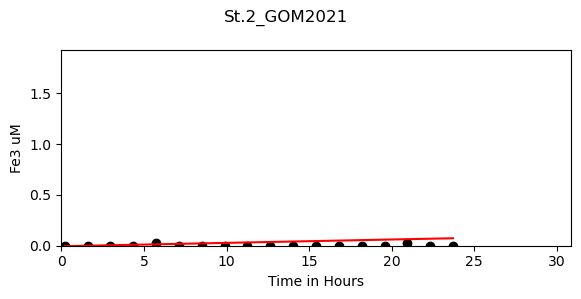

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

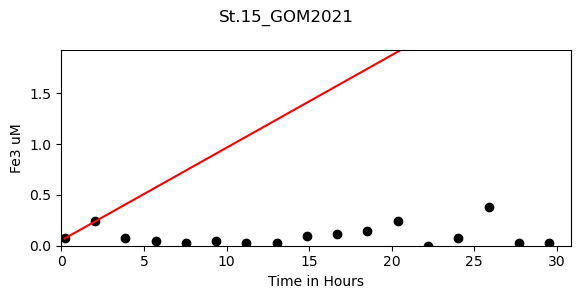

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

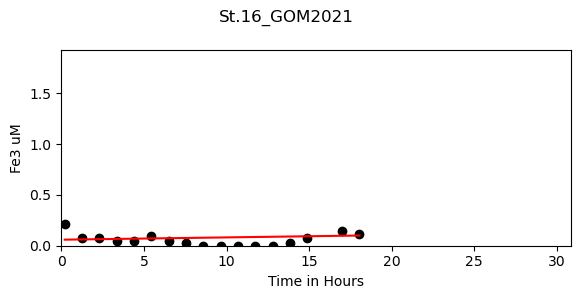

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

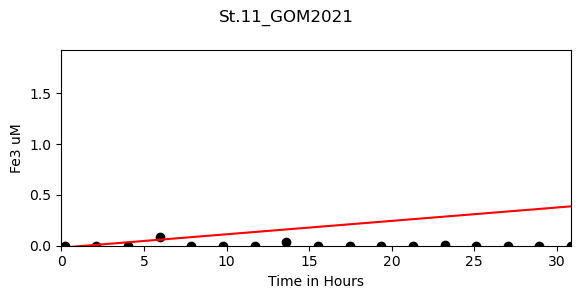

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

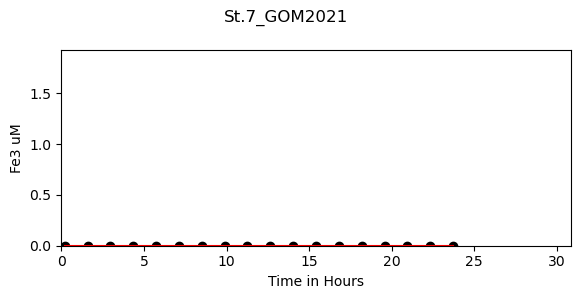

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

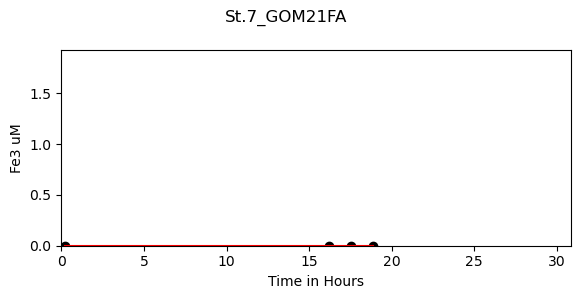

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

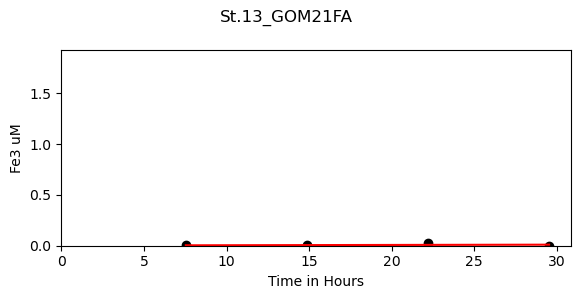

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

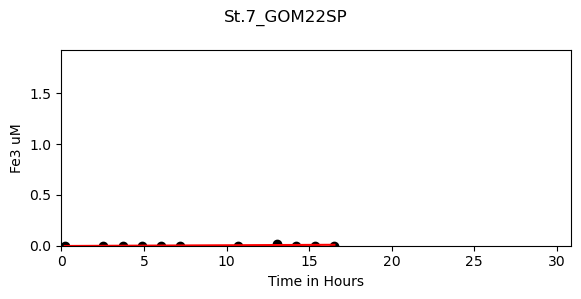

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

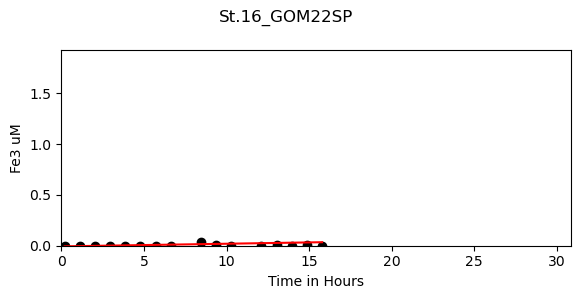

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

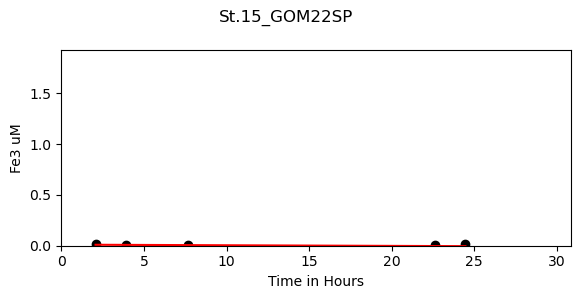

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

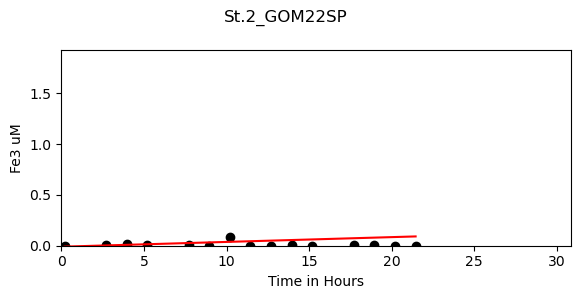

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

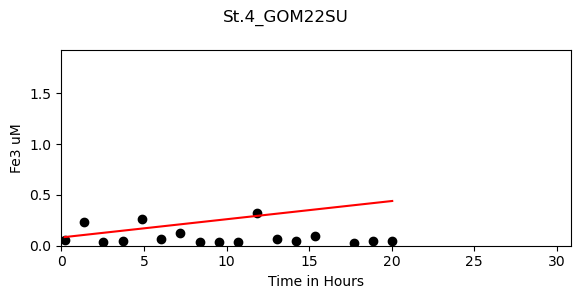

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

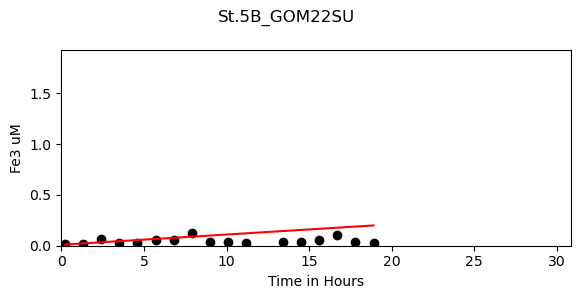

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

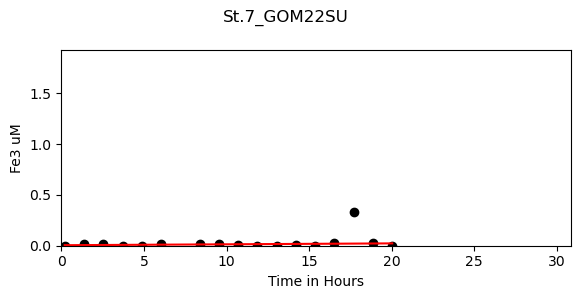

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

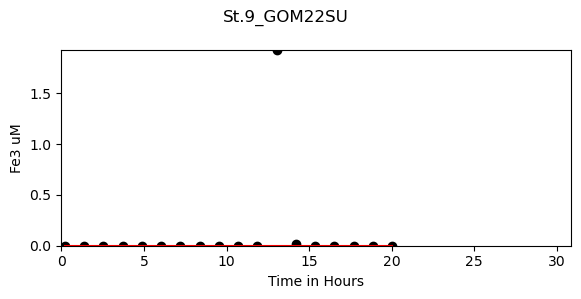

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

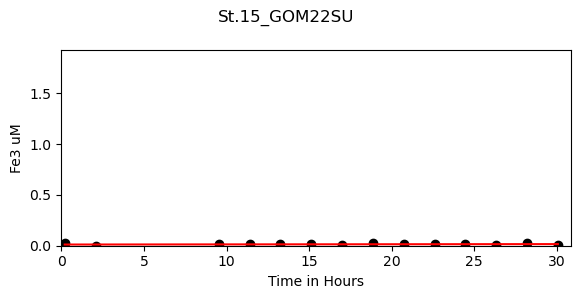

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

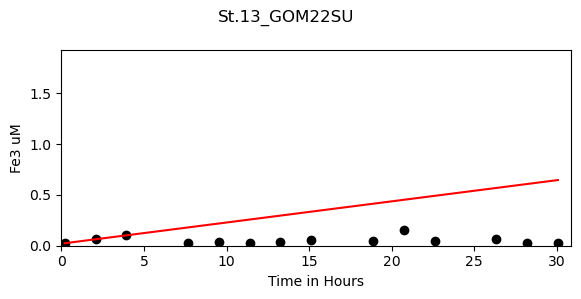

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

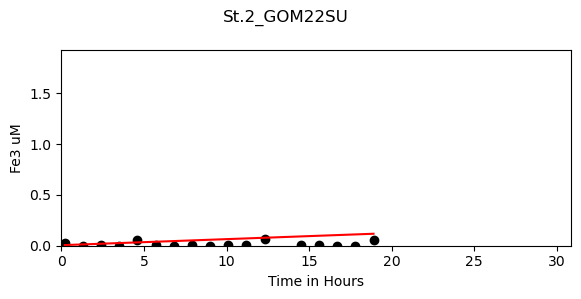

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

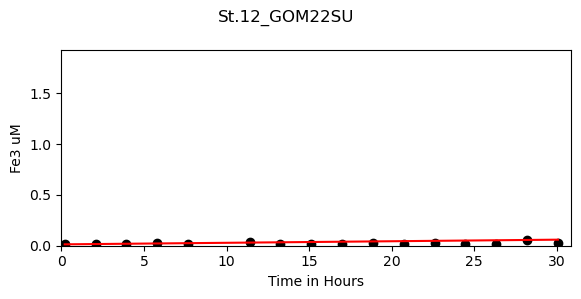

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

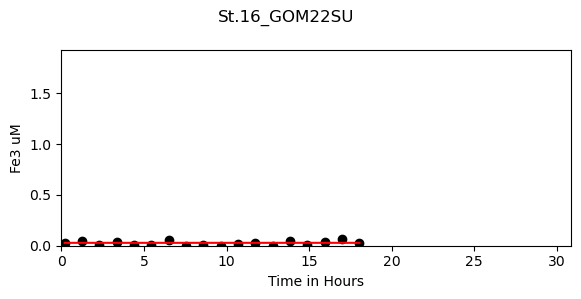

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

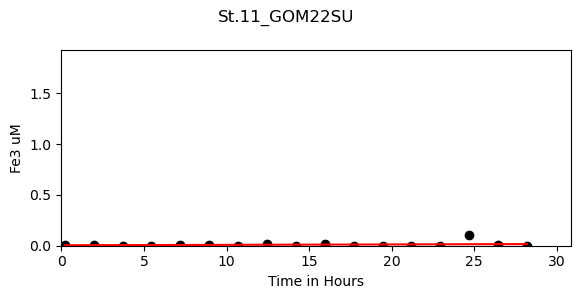

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

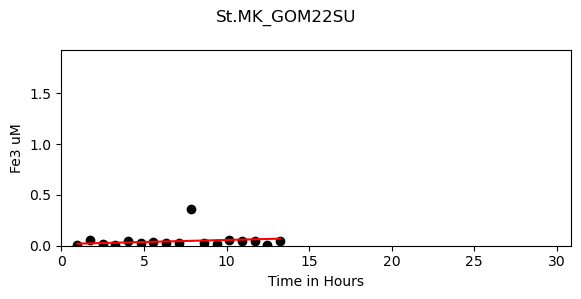

[               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.MK_GOM2021      0.005192         0.140546         0.00454                10,                slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                          
St.5B_GOM2021      0.104563              1.0             0.0                 2,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.4_GOM2021           0.0              0.0             0.0                12,               slope_fe3_bc  rsquared_fe3_bc  std_err_fe3_bc  flux_time_fe3_bc
code                                                                         
St.9_GOM2021      0.000665         0.000555        0.011518                10,                slope_fe3_bc  rsquared_fe3_bc  std_err

,slope_fe3_bc,rsquared_fe3_bc,std_err_fe3_bc,flux_time_fe3_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_fe3,bc_flux_fe3_error
code,,,,,,,,,,,,
St.MK_GOM2021,0.005192,1.405463e-01,0.004540,10.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.025079,0.021927
St.5B_GOM2021,0.104563,1.000000e+00,0.000000,2.0,GOM2021,St.5B,0.158750,0.005449,28.811667,-91.343178,0.398384,0.000000
St.4_GOM2021,0.000000,0.000000e+00,0.000000,12.0,GOM2021,St.4,0.163500,0.021372,28.799256,-90.711336,0.000000,0.000000
St.9_GOM2021,0.000665,5.547594e-04,0.011518,10.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,0.001137,0.019697
St.13_GOM2021,0.004883,1.123973e-01,0.006861,15.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.008203,0.011526
St.2_GOM2021,0.003326,4.999993e-01,0.001920,6.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.009179,0.005300
St.15_GOM2021,0.091160,1.000000e+00,0.000000,3.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.258895,0.000000
St.16_GOM2021,0.002274,3.571429e-02,0.006822,6.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.006912,0.020737
St.11_GOM2021,0.013174,5.912805e-01,0.007745,6.0,GOM2021,St.11,0.176667,0.012472,28.225724,-89.540904,0.055858,0.032839


In [34]:
Frames = []

def fe3_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_iron_bc_fe3_cl.loc[df_iron_bc_fe2_cl['code'] == codes[code]]
    x = sub['FeT_Time']
    y = sub['Fe3_uM']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['FeT_Time'] < time1) & (sub['FeT_Time'] > time2), 'FeT_Time'].ravel()
    yy = sub.loc[(sub['FeT_Time'] < time1) & (sub['FeT_Time'] > time2), 'Fe3_uM'].ravel()
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='r')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_fe3_bc':[slope],
               'rsquared_fe3_bc':[rsquared], 
               'std_err_fe3_bc':[std_err], 
               'flux_time_fe3_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('Fe3 uM')
    axs.set_xlim(0,df_iron_bc_fe3_cl['FeT_Time'].max())
    axs.set_ylim(df_iron_bc_fe3_cl['Fe3_uM'].min(),df_iron_bc_fe3_cl['Fe3_uM'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
fe3_flux_cal(0, 10, 0)
fe3_flux_cal(1, 2, 0)
fe3_flux_cal(2, 12, 0)
fe3_flux_cal(4, 10, 0)
fe3_flux_cal(5, 15, 1)
fe3_flux_cal(6, 6, 0)
fe3_flux_cal(7, 3, 0)
fe3_flux_cal(8, 6, 1)
fe3_flux_cal(9, 6, 0)
fe3_flux_cal(10, 6, 0)
fe3_flux_cal(11, 20, 0)
fe3_flux_cal(12, 15, 0)
fe3_flux_cal(13, 14, 0)
fe3_flux_cal(14, 9, 0)
fe3_flux_cal(15, 8, 0)
fe3_flux_cal(17, 11, 0)
fe3_flux_cal(18, 5, 0)
fe3_flux_cal(19, 8, 0)
fe3_flux_cal(20, 10, 0)
fe3_flux_cal(21, 10, 0)
fe3_flux_cal(22, 16, 0)
fe3_flux_cal(23, 5, 0)
fe3_flux_cal(24, 5, 0)
fe3_flux_cal(25, 12, 0)
fe3_flux_cal(26, 7, 0)
fe3_flux_cal(27, 13, 0)
fe3_flux_cal(28, 5, 0)

slopes_fe3_bc = pd.concat(Frames, axis=0, ignore_index=False)

slopes_fe3_bc = pd.concat([slopes_fe3_bc, df_hights, df_lat_lon], axis=1, join='outer')
slopes_fe3_bc = slopes_fe3_bc.dropna(subset=['slope_fe3_bc'])

slopes_fe3_bc["bc_flux_fe3"] = slopes_fe3_bc["slope_fe3_bc"] * slopes_fe3_bc["Hight_m"]* 24 
slopes_fe3_bc["bc_flux_fe3_error"] = slopes_fe3_bc["std_err_fe3_bc"] * slopes_fe3_bc["Hight_m"]* 24 

slopes_fe3_bc 

In [35]:
#figure calculate Benthic chamber 

#CDOM slops
df_cdom_bc_cl = df_cdom_bc.drop(df_cdom_bc[(df_cdom_bc['a350'] <= 0) | (df_cdom_bc['a350'].isna())].index)
codes = df_cdom_bc_cl['code'].unique()
print(codes)
len(codes)

['St.13_GOM2021' 'St.14_GOM2021' 'St.15_GOM2021' 'St.16_GOM2021'
 'St.2_GOM2021' 'St.5B_GOM2021' 'St.9_GOM2021' 'St.MK_GOM2021'
 'St.11_GOM21FA' 'St.12_GOM21FA' 'St.13_GOM21FA' 'St.14_GOM21FA'
 'St.15_GOM21FA' 'St.16_GOM21FA' 'St.5B_GOM21FA' 'St.7_GOM21FA'
 'St.9_GOM21FA' 'St.MK_GOM21FA' 'St.13_GOM22SP' 'St.14_GOM22SP'
 'St.15_GOM22SP' 'St.16_GOM22SP' 'St.2_GOM22SP' 'St.4_GOM22SP'
 'St.5B_GOM22SP' 'St.7_GOM22SP' 'St.9_GOM22SP' 'St.MK_GOM22SU'
 'St.11_GOM22SU' 'St.12_GOM22SU' 'St.13_GOM22SU' 'St.14_GOM22SU'
 'St.15_GOM22SU' 'St.16_GOM22SU' 'St.2_GOM22SU' 'St.4_GOM22SU'
 'St.5B_GOM22SU' 'St.7_GOM22SU' 'St.9_GOM22SU']


39

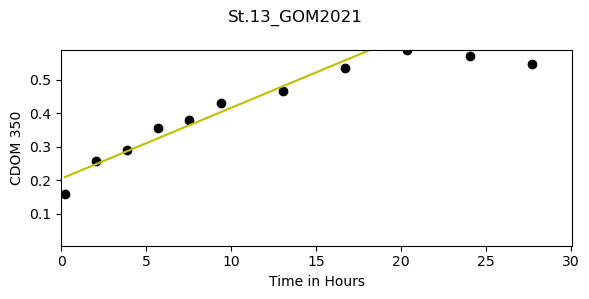

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ]


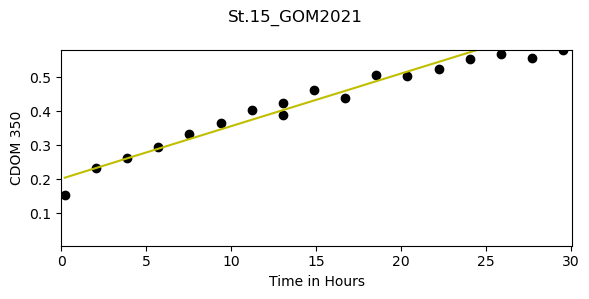

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ]


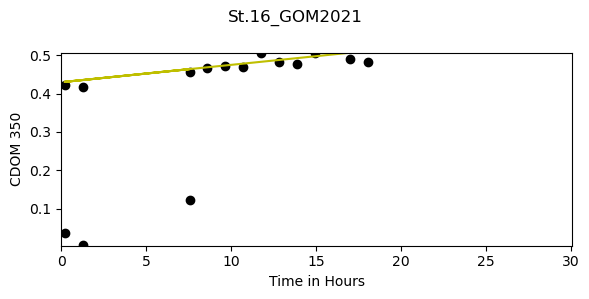

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

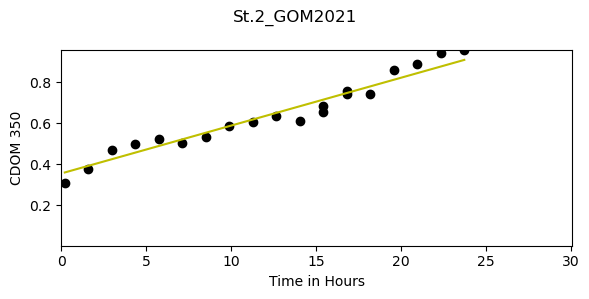

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

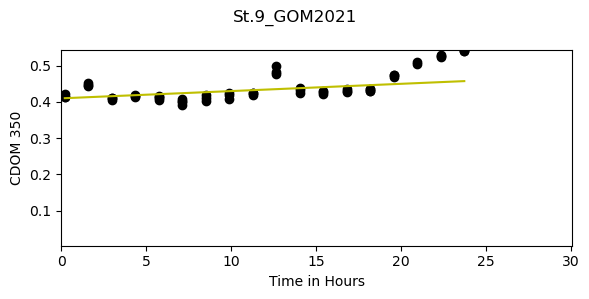

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

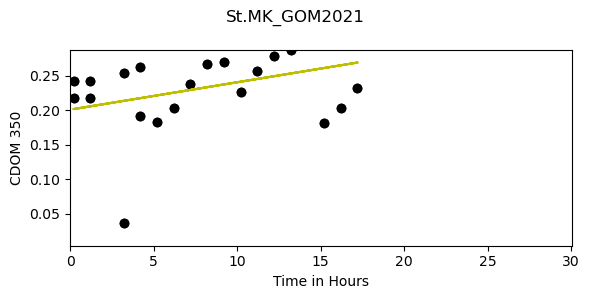

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

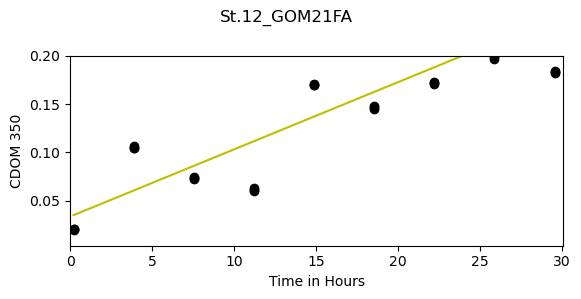

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

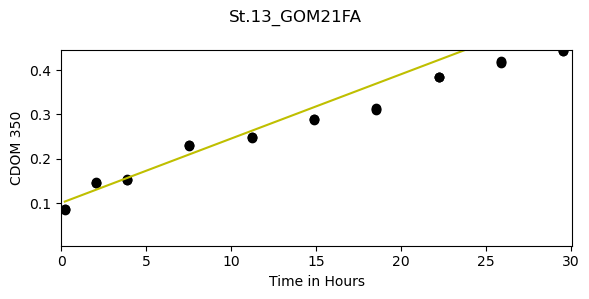

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

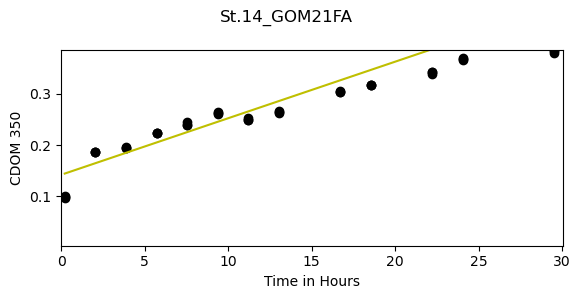

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

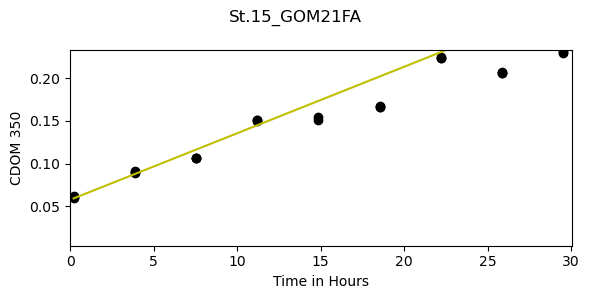

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

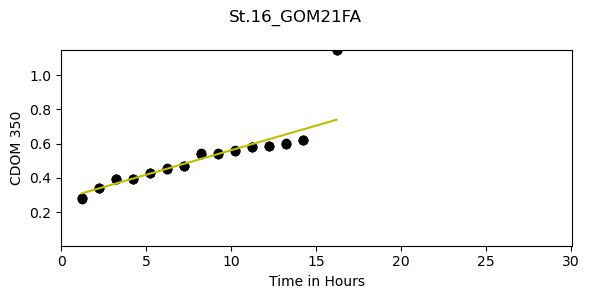

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

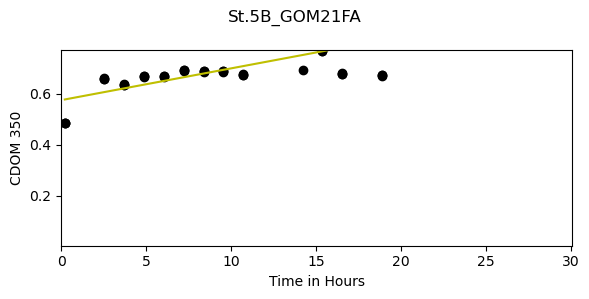

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

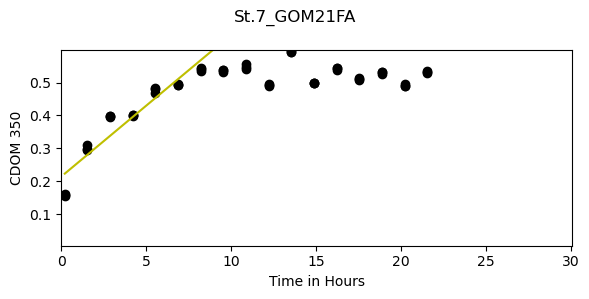

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

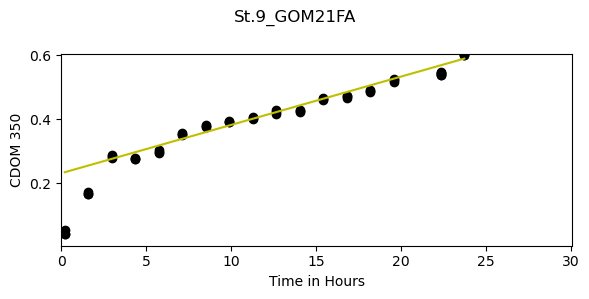

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

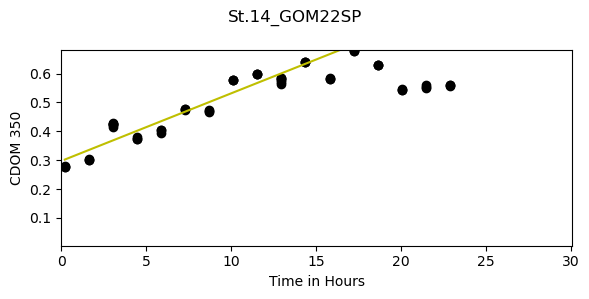

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

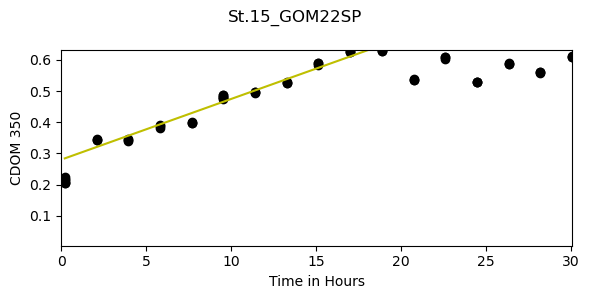

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

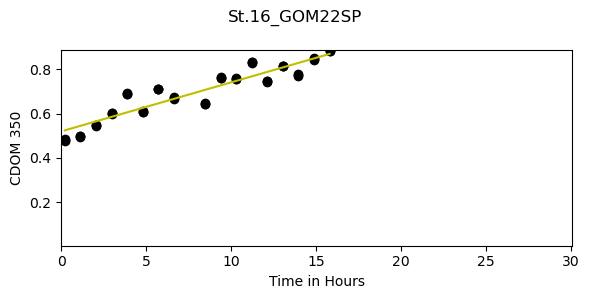

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

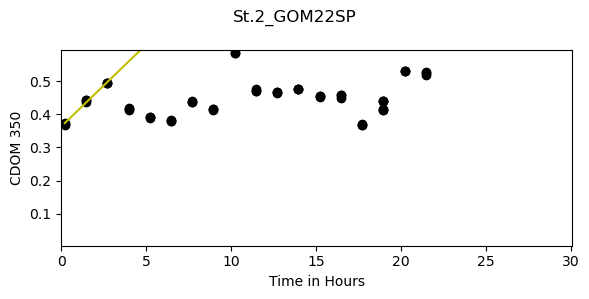

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

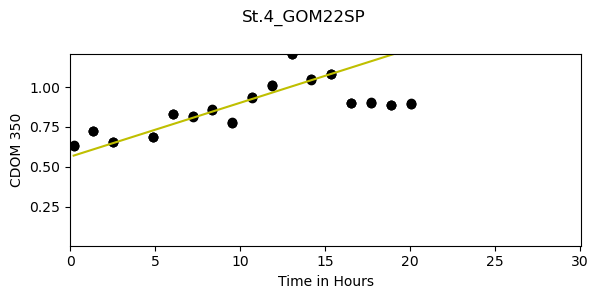

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

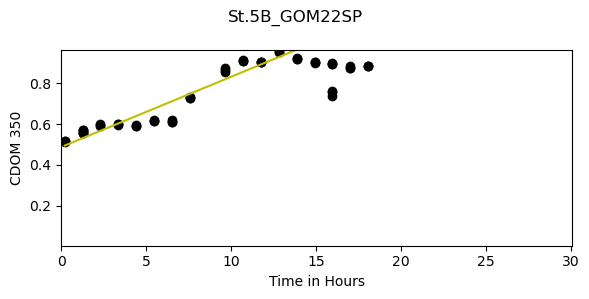

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

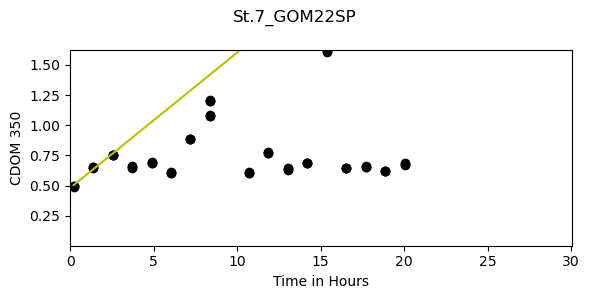

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

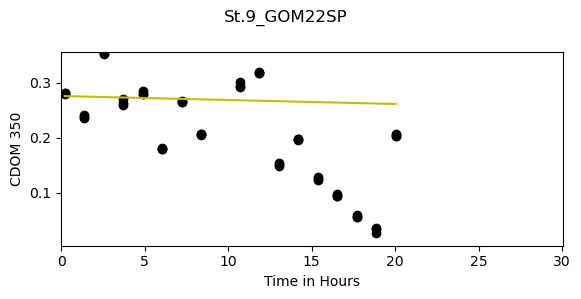

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

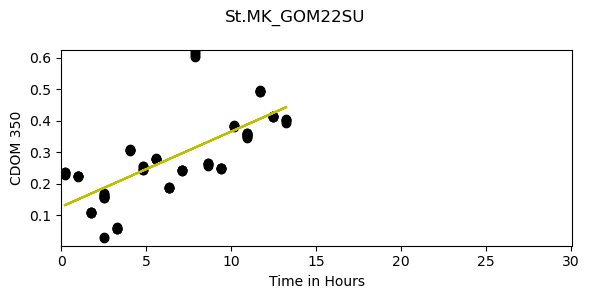

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

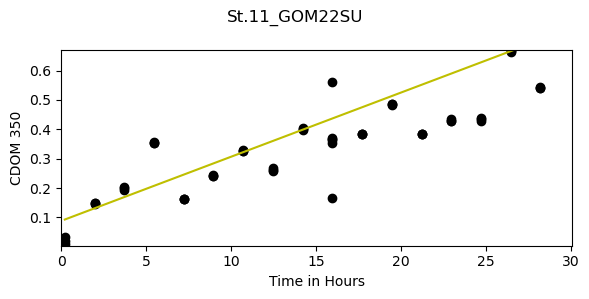

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

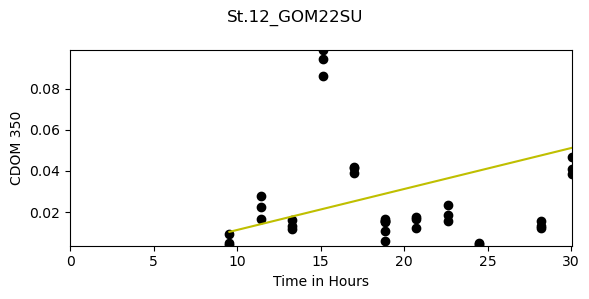

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

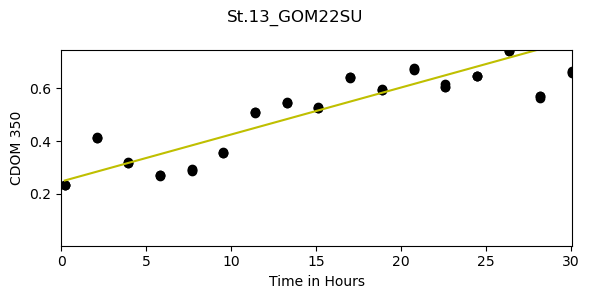

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

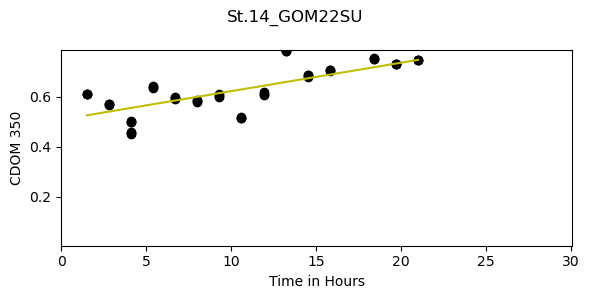

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

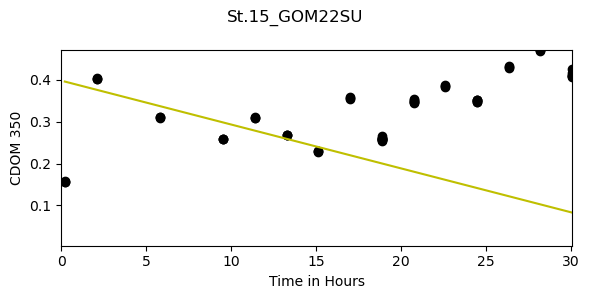

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

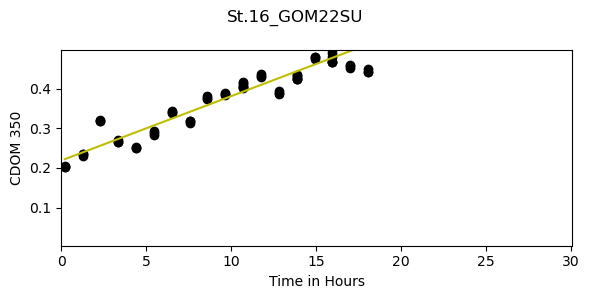

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

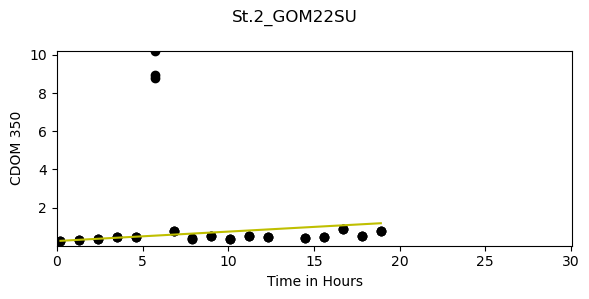

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

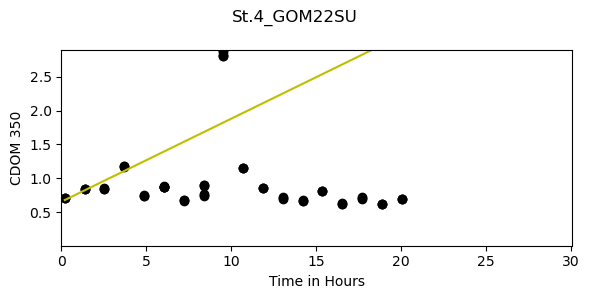

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

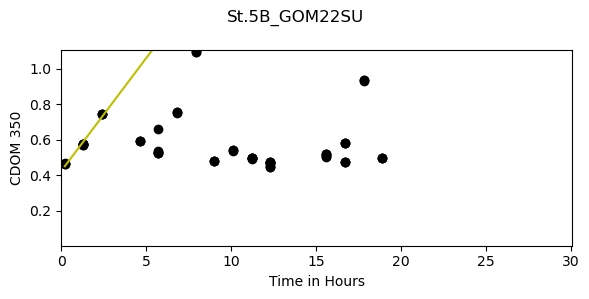

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

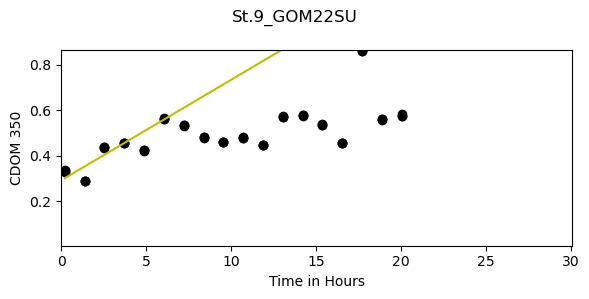

[               slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.13_GOM2021           0.021192               0.94603             0.002066   

               flux_time_cdom_350_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.15_GOM2021           0.015505              0.961839             0.000857   

               flux_time_cdom_350_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_350_bc  rsquared_cdom_350_bc  std_err_cdom_350_bc  \
code                                                                          
St.16_GOM2021           0.004523              0.397424             0.002491   

               flux_time_cdom_350_bc  
code      

,slope_cdom_350_bc,rsquared_cdom_350_bc,std_err_cdom_350_bc,flux_time_cdom_350_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_aCDOM350,bc_flux_aCDOM350_error
code,,,,,,,,,,,,
St.13_GOM2021,0.021192,0.946030,0.002066,20.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.035603,0.003472
St.15_GOM2021,0.015505,0.961839,0.000857,25.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.044033,0.002433
St.16_GOM2021,0.004523,0.397424,0.002491,15.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.013750,0.007572
St.2_GOM2021,0.023344,0.877198,0.003301,12.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.064430,0.009112
St.9_GOM2021,0.002001,0.102131,0.001083,13.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,0.003422,0.001853
St.MK_GOM2021,0.003962,0.061508,0.002925,12.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.019136,0.014126
St.12_GOM21FA,0.006947,0.522092,0.001843,15.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,0.024176,0.006415
St.13_GOM21FA,0.014530,0.930937,0.001098,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,0.046495,0.003512
St.14_GOM21FA,0.011030,0.800684,0.001173,15.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,0.041914,0.004458


In [36]:
Frames = []

def cdom_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_cdom_bc_cl.loc[df_cdom_bc_cl['code'] == codes[code]]
    x = sub['BC_time']
    y = sub['a350']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['BC_time'] < time1) & (sub['BC_time'] > time2), 'BC_time'].ravel()
    yy = sub.loc[(sub['BC_time'] < time1) & (sub['BC_time'] > time2), 'a350'].ravel()
    if len(x) > 0:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='y')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_cdom_350_bc':[slope],
               'rsquared_cdom_350_bc':[rsquared], 
               'std_err_cdom_350_bc':[std_err], 
               'flux_time_cdom_350_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('CDOM 350')
    axs.set_xlim(0,df_cdom_bc_cl['BC_time'].max())
    axs.set_ylim(df_cdom_bc_cl['a350'].min(),sub['a350'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
cdom_flux_cal(0, 20, 0)
cdom_flux_cal(2, 25, 0)
cdom_flux_cal(3, 15, 8)
cdom_flux_cal(4, 12, 0)
#cdom_flux_cal(5, 5, 0)
cdom_flux_cal(6, 13, 0)
cdom_flux_cal(7, 12, 0)
#cdom_flux_cal(8, 7, 1)
cdom_flux_cal(9, 15, 0)
cdom_flux_cal(10, 12, 0)
cdom_flux_cal(11, 15, 0)
cdom_flux_cal(12, 13, 0)
cdom_flux_cal(13, 12, 0)
cdom_flux_cal(14, 15, 0)
cdom_flux_cal(15, 9, 0)
cdom_flux_cal(16, 16, 2)
#cdom_flux_cal(17, 15, 0)
cdom_flux_cal(19, 15, 0)
cdom_flux_cal(20, 16, 2)
cdom_flux_cal(21, 15, 0)
cdom_flux_cal(22, 3, 0)
cdom_flux_cal(23, 13, 2)
cdom_flux_cal(24, 12, 0)
cdom_flux_cal(25, 3, 0)
cdom_flux_cal(26, 13, 2)
cdom_flux_cal(27, 12, 0)
cdom_flux_cal(28, 12, 0)
cdom_flux_cal(29, 15, 0)
cdom_flux_cal(30, 15, 0)
cdom_flux_cal(31, 15, 0)
cdom_flux_cal(32, 15, 1)
cdom_flux_cal(33, 15, 0)
cdom_flux_cal(34, 5, 0)
cdom_flux_cal(35, 4, 0)
cdom_flux_cal(36, 4, 0)
#cdom_flux_cal(37, 5, 0)
cdom_flux_cal(38, 4, 0)

slopes_cdom_bc_350 = pd.concat(Frames, axis=0, ignore_index=False)

slopes_cdom_bc_350 = pd.concat([slopes_cdom_bc_350, df_hights, df_lat_lon], axis=1, join='outer')
slopes_cdom_bc_350 = slopes_cdom_bc_350.dropna(subset=['slope_cdom_350_bc'])

slopes_cdom_bc_350["bc_flux_aCDOM350"] = slopes_cdom_bc_350["slope_cdom_350_bc"] * slopes_cdom_bc_350["Hight_m"] * 24 
slopes_cdom_bc_350["bc_flux_aCDOM350_error"] = slopes_cdom_bc_350["std_err_cdom_350_bc"] * slopes_cdom_bc_350["Hight_m"] * 24

slopes_cdom_bc_350

In [37]:
#figure calculate Benthic chamber 

#CDOM slops
df_cdom_bc_cl = df_cdom_bc.drop(df_cdom_bc[(df_cdom_bc['a412'] <= 0) | (df_cdom_bc['a412'].isna())].index)
codes = df_cdom_bc_cl['code'].unique()
print(codes)
len(codes)

['St.13_GOM2021' 'St.14_GOM2021' 'St.15_GOM2021' 'St.16_GOM2021'
 'St.2_GOM2021' 'St.5B_GOM2021' 'St.9_GOM2021' 'St.MK_GOM2021'
 'St.12_GOM21FA' 'St.13_GOM21FA' 'St.14_GOM21FA' 'St.15_GOM21FA'
 'St.16_GOM21FA' 'St.5B_GOM21FA' 'St.7_GOM21FA' 'St.9_GOM21FA'
 'St.MK_GOM21FA' 'St.13_GOM22SP' 'St.14_GOM22SP' 'St.15_GOM22SP'
 'St.16_GOM22SP' 'St.2_GOM22SP' 'St.4_GOM22SP' 'St.5B_GOM22SP'
 'St.7_GOM22SP' 'St.9_GOM22SP' 'St.MK_GOM22SU' 'St.11_GOM22SU'
 'St.13_GOM22SU' 'St.14_GOM22SU' 'St.15_GOM22SU' 'St.16_GOM22SU'
 'St.2_GOM22SU' 'St.4_GOM22SU' 'St.5B_GOM22SU' 'St.7_GOM22SU'
 'St.9_GOM22SU']


37

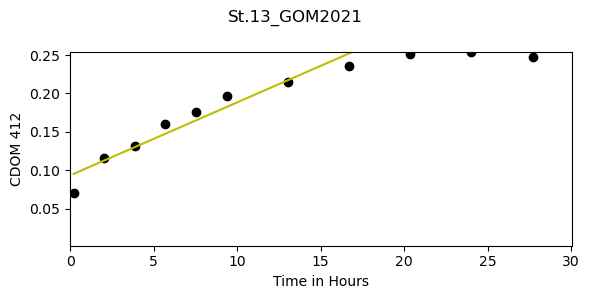

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ]


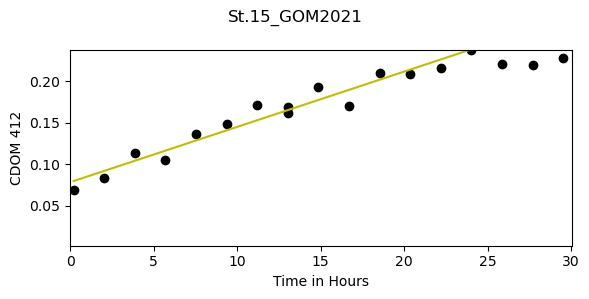

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ]


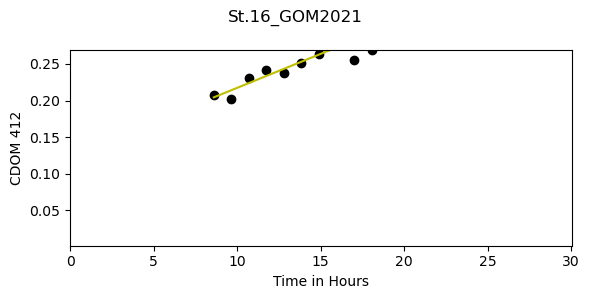

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

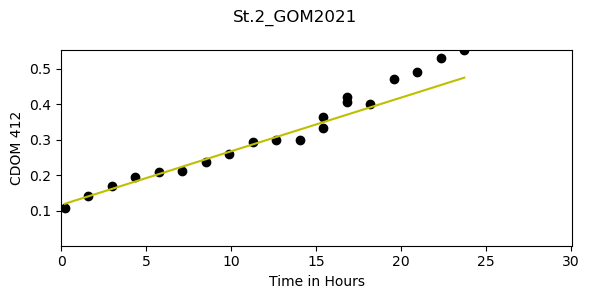

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

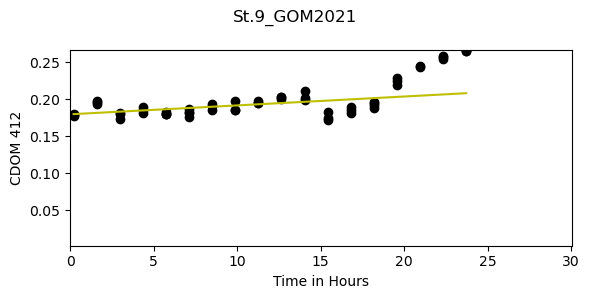

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

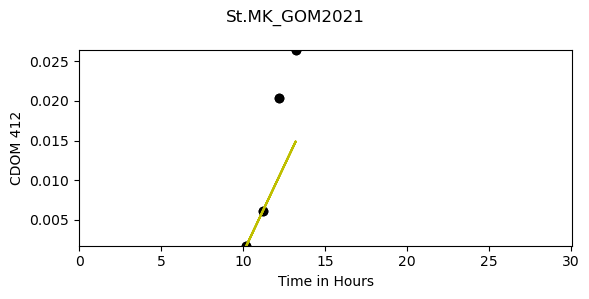

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

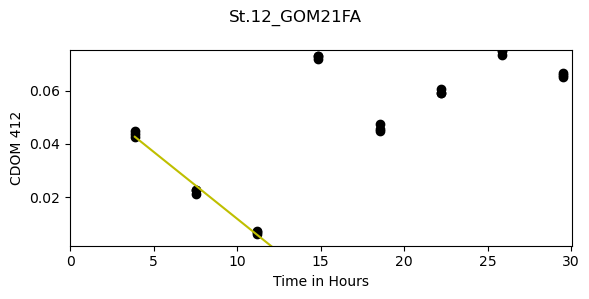

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

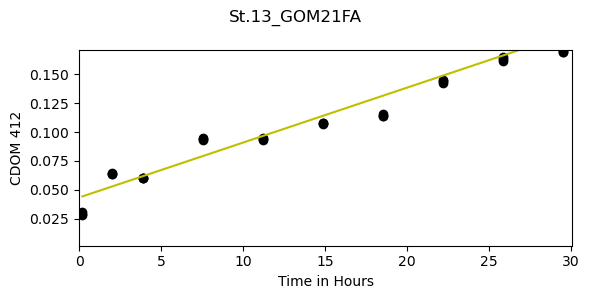

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

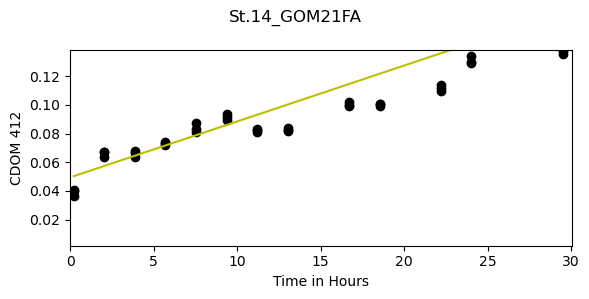

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

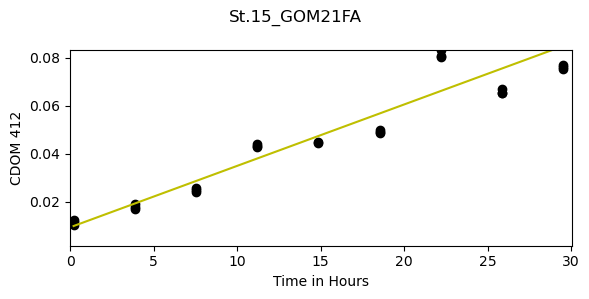

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

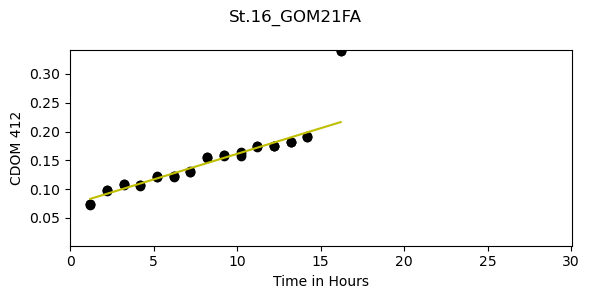

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

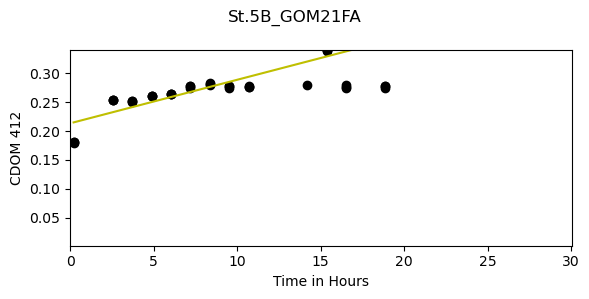

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

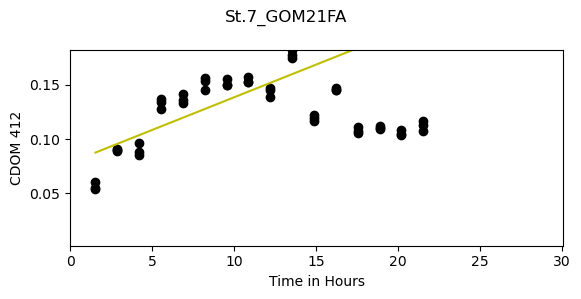

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

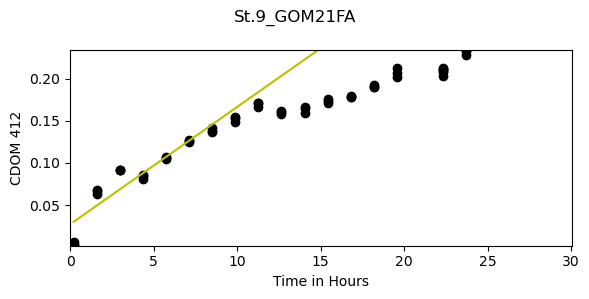

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

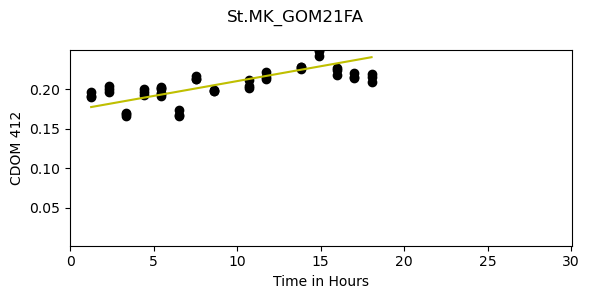

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

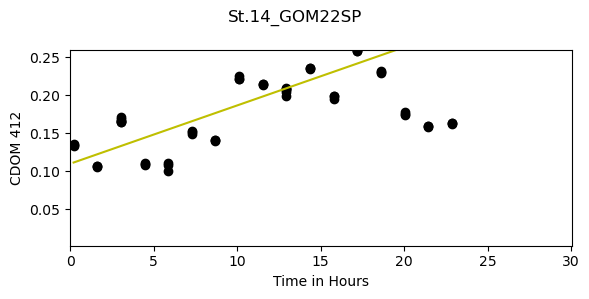

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

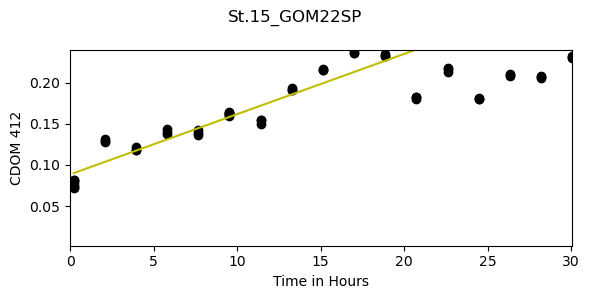

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

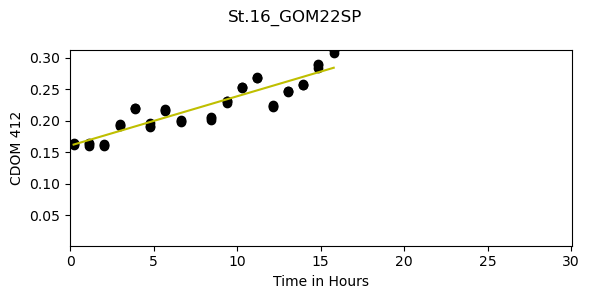

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

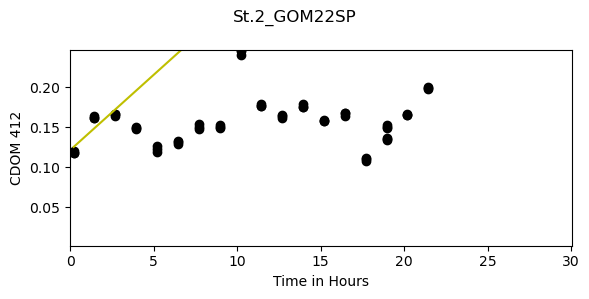

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

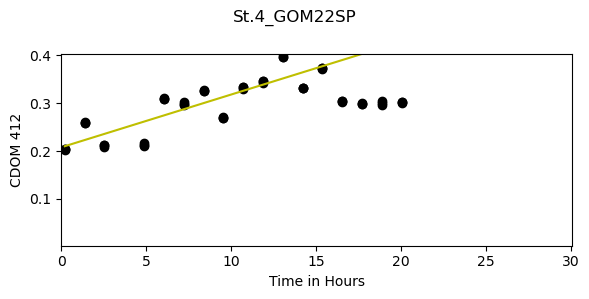

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

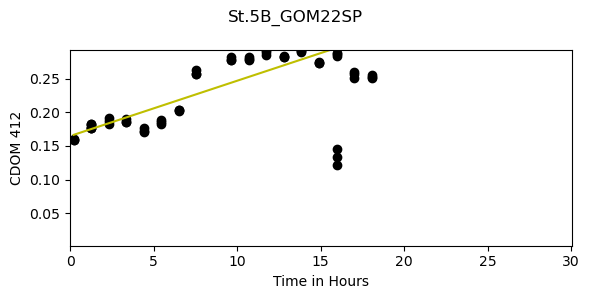

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

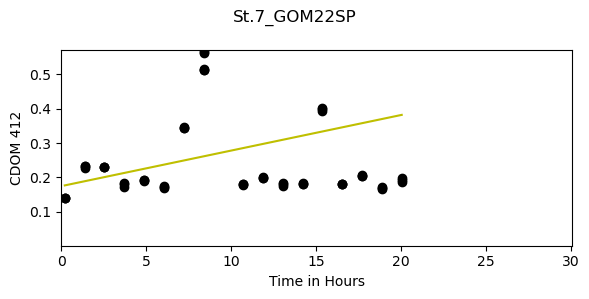

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

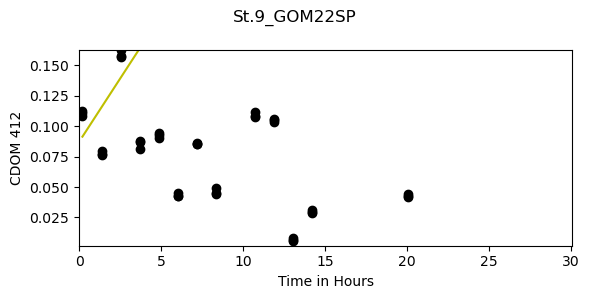

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

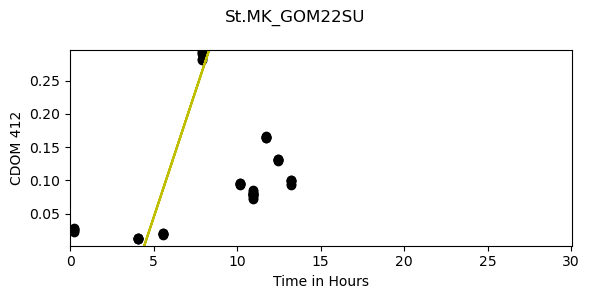

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

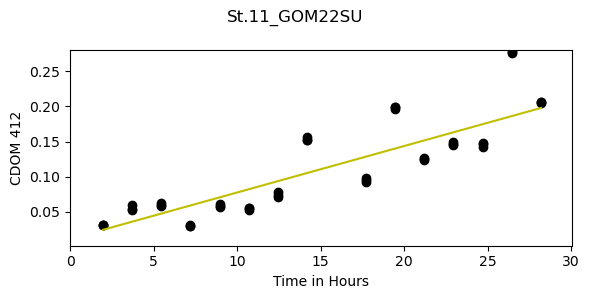

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

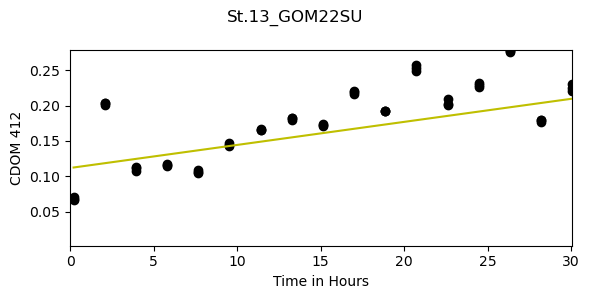

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

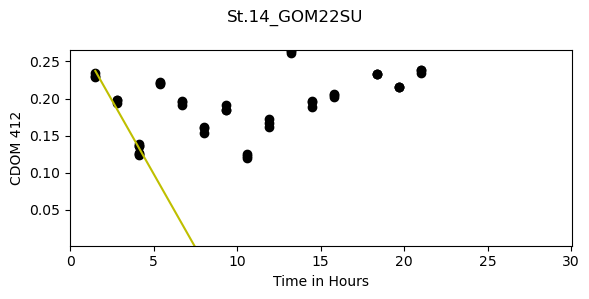

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

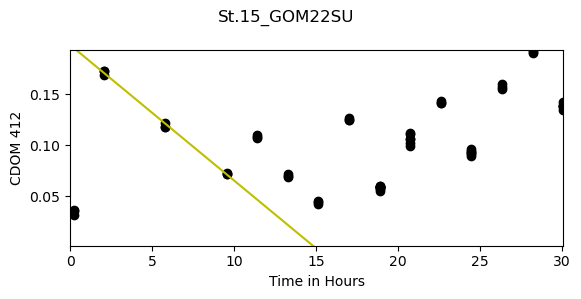

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

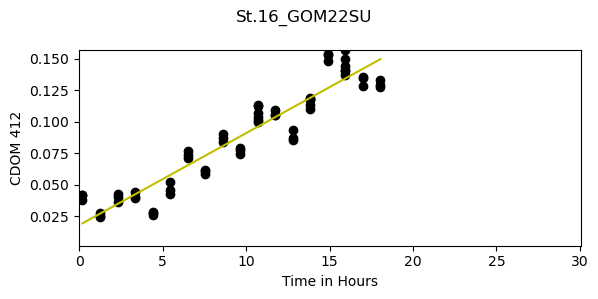

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

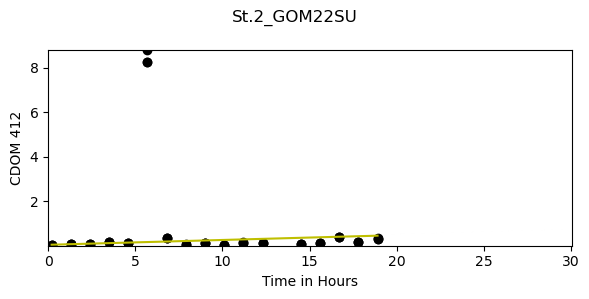

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

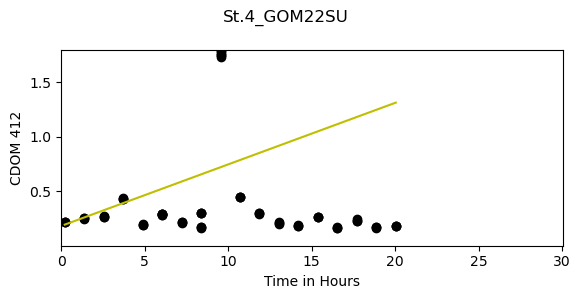

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

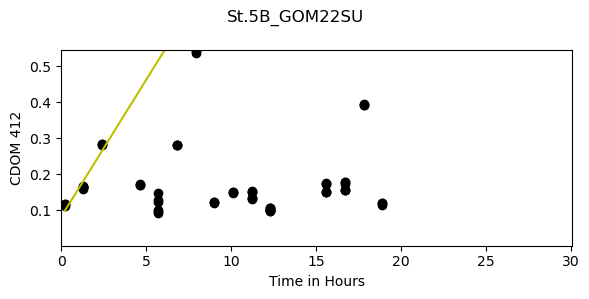

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

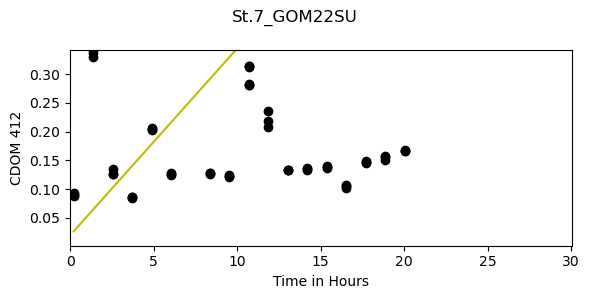

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

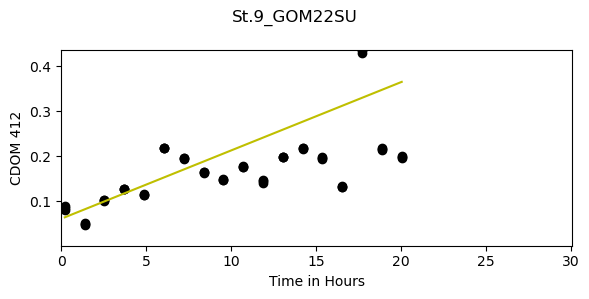

[               slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.13_GOM2021           0.009504              0.933996             0.001031   

               flux_time_cdom_412_bc  
code                                  
St.13_GOM2021                     20  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.15_GOM2021           0.006668              0.951629             0.000417   

               flux_time_cdom_412_bc  
code                                  
St.15_GOM2021                     25  ,                slope_cdom_412_bc  rsquared_cdom_412_bc  std_err_cdom_412_bc  \
code                                                                          
St.16_GOM2021           0.009271              0.902352             0.001364   

               flux_time_cdom_412_bc  
code      

In [38]:
Frames = []

def cdom_flux_cal(code, time1, time2): 
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 3)) 
    sub = df_cdom_bc_cl.loc[df_cdom_bc_cl['code'] == codes[code]]
    x = sub['BC_time']
    y = sub['a412']
    axs.scatter(x, y, c="black")
    xx = sub.loc[(sub['BC_time'] < time1) & (sub['BC_time'] > time2), 'BC_time'].ravel()
    yy = sub.loc[(sub['BC_time'] < time1) & (sub['BC_time'] > time2), 'a412'].ravel()
    if len(x) > 0:
        slope, intercept, r_value, p_value, std_err = stats.linregress(xx, yy)
        axs.plot(x, intercept + slope * x, c='y')
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
        
        dic = {'code':[codes[code]],
               'slope_cdom_412_bc':[slope],
               'rsquared_cdom_412_bc':[rsquared], 
               'std_err_cdom_412_bc':[std_err], 
               'flux_time_cdom_412_bc': [time1]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)
        
    # Add subplot labels
    axs.set_xlabel('Time in Hours')
    axs.set_ylabel('CDOM 412')
    axs.set_xlim(0,df_cdom_bc_cl['BC_time'].max())
    axs.set_ylim(df_cdom_bc_cl['a412'].min(),sub['a412'].max())
    fig.suptitle(codes[code])
    plt.tight_layout()
    fig.set_facecolor('w')
    plt.show()
    print(Frames)
    
cdom_flux_cal(0, 20, 0)
cdom_flux_cal(2, 25, 0)
cdom_flux_cal(3, 15, 8)
cdom_flux_cal(4, 12, 0)
cdom_flux_cal(6, 13, 0)
cdom_flux_cal(7, 12, 0)
cdom_flux_cal(8, 13, 0)
cdom_flux_cal(9, 15, 0)
cdom_flux_cal(10, 12, 0)
cdom_flux_cal(11, 15, 0)
cdom_flux_cal(12, 13, 0)
cdom_flux_cal(13, 12, 0)
cdom_flux_cal(14, 15, 0)
cdom_flux_cal(15, 9, 0)
cdom_flux_cal(16, 16, 2)
cdom_flux_cal(18, 15, 0)
cdom_flux_cal(19, 15, 0)
cdom_flux_cal(20, 16, 2)
cdom_flux_cal(21, 3, 0)
cdom_flux_cal(22, 12, 0)
cdom_flux_cal(23, 4, 0)
cdom_flux_cal(24, 4, 0)
cdom_flux_cal(25, 3, 0)
cdom_flux_cal(26, 10, 2)
cdom_flux_cal(27, 15, 0)
cdom_flux_cal(28, 12, 0)
cdom_flux_cal(29, 5, 0)
cdom_flux_cal(30, 10, 1)
cdom_flux_cal(31, 15, 0)
cdom_flux_cal(32, 5, 0)
cdom_flux_cal(33, 4, 0)
cdom_flux_cal(34, 4, 0)
cdom_flux_cal(35, 5, 2)
cdom_flux_cal(36, 4, 0)

slopes_cdom_bc_412 = pd.concat(Frames, axis=0, ignore_index=False)

slopes_cdom_bc_412 = pd.concat([slopes_cdom_bc_412, df_hights, df_lat_lon], axis=1, join='outer')
slopes_cdom_bc_412 = slopes_cdom_bc_412.dropna(subset=['slope_cdom_412_bc'])

slopes_cdom_bc_412["bc_flux_aCDOM412"] = slopes_cdom_bc_412["slope_cdom_412_bc"] * slopes_cdom_bc_412["Hight_m"] * 24 
slopes_cdom_bc_412["bc_flux_aCDOM412_error"] = slopes_cdom_bc_412["std_err_cdom_412_bc"] * slopes_cdom_bc_412["Hight_m"] * 24 

In [39]:
slopes_cdom_bc_412.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_cdom_bc_412.csv')
slopes_cdom_bc_412

,slope_cdom_412_bc,rsquared_cdom_412_bc,std_err_cdom_412_bc,flux_time_cdom_412_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_aCDOM412,bc_flux_aCDOM412_error
code,,,,,,,,,,,,
St.13_GOM2021,0.009504,0.933996,0.001031,20.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.015966,0.001733
St.15_GOM2021,0.006668,0.951629,0.000417,25.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.018936,0.001184
St.16_GOM2021,0.009271,0.902352,0.001364,15.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.028184,0.004146
St.2_GOM2021,0.015078,0.974019,0.000931,12.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.041616,0.002569
St.9_GOM2021,0.001204,0.324485,0.000317,13.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,0.002058,0.000542
St.MK_GOM2021,0.004367,1.000000,0.000000,12.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.021094,0.000000
St.12_GOM21FA,-0.005024,0.988537,0.000204,13.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,-0.017483,0.000712
St.13_GOM21FA,0.004750,0.853888,0.000491,15.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,0.015200,0.001572
St.14_GOM21FA,0.003901,0.781443,0.000473,12.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,0.014825,0.001799


In [40]:
slopes_cdom_bc_350.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_cdom_bc_350.csv')
slopes_cdom_bc_350

,slope_cdom_350_bc,rsquared_cdom_350_bc,std_err_cdom_350_bc,flux_time_cdom_350_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_aCDOM350,bc_flux_aCDOM350_error
code,,,,,,,,,,,,
St.13_GOM2021,0.021192,0.946030,0.002066,20.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.035603,0.003472
St.15_GOM2021,0.015505,0.961839,0.000857,25.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.044033,0.002433
St.16_GOM2021,0.004523,0.397424,0.002491,15.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.013750,0.007572
St.2_GOM2021,0.023344,0.877198,0.003301,12.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.064430,0.009112
St.9_GOM2021,0.002001,0.102131,0.001083,13.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,0.003422,0.001853
St.MK_GOM2021,0.003962,0.061508,0.002925,12.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.019136,0.014126
St.12_GOM21FA,0.006947,0.522092,0.001843,15.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,0.024176,0.006415
St.13_GOM21FA,0.014530,0.930937,0.001098,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,0.046495,0.003512
St.14_GOM21FA,0.011030,0.800684,0.001173,15.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,0.041914,0.004458


In [41]:
slopes_doc_bc.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_doc_bc.csv')
slopes_doc_bc

,slope_doc_bc,rsquared_doc_bc,std_err_doc_bc,flux_time_doc_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_doc,bc_flux_doc_error
code,,,,,,,,,,,,
St.5B_GOM21FA,0.558488,0.034495,1.044638,12.0,GOM21FA,St.5B,0.116667,0.004714,28.806169,-91.335944,1.563766,2.924987
St.15_GOM21FA,0.669432,0.671371,0.331179,12.0,GOM21FA,St.15,0.140000,0.016330,28.950023,-88.846716,2.249291,1.112763
St.MK_GOM21FA,20.394436,1.000000,0.000000,4.0,GOM21FA,St.MK,0.217500,0.010897,28.913659,-90.328519,106.458957,0.000000
St.14_GOM21FA,1.777518,0.409972,1.507851,6.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,6.754570,5.729835
St.9_GOM21FA,4.022430,0.246080,3.520331,8.0,GOM21FA,St.9,0.115000,0.010801,28.782994,-89.599750,11.101907,9.716114
St.7_GOM21FA,2.672240,0.132028,3.425833,10.0,GOM21FA,St.7,0.170000,0.048477,28.910991,-89.872204,10.902740,13.977398
St.13_GOM21FA,1.145827,0.709124,0.423693,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,3.666646,1.355818
St.12_GOM21FA,-0.996918,0.925517,0.199978,12.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,-3.469275,0.695923
St.7_GOM22SP,-11.076840,0.700829,7.237186,10.0,GOM22SP,St.7,0.146667,0.010274,28.917214,-89.859921,-38.990476,25.474893


In [42]:
slopes_tn_bc.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_tn_bc.csv')
slopes_tn_bc

,slope_tn_bc,rsquared_tn_bc,std_err_tn_bc,flux_time_tn_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_tn,bc_flux_tn_error
code,,,,,,,,,,,,
St.5B_GOM21FA,0.193375,0.602732,0.055505,12.0,GOM21FA,St.5B,0.116667,0.004714,28.806169,-91.335944,0.541451,0.155415
St.15_GOM21FA,0.281981,0.962846,0.055392,12.0,GOM21FA,St.15,0.140000,0.016330,28.950023,-88.846716,0.947455,0.186117
St.MK_GOM21FA,0.149671,1.000000,0.000000,6.0,GOM21FA,St.MK,0.217500,0.010897,28.913659,-90.328519,0.781281,0.000000
St.14_GOM21FA,1.208409,0.779309,0.643059,5.0,GOM21FA,St.14,0.158333,0.030641,28.727625,-89.620568,4.591954,2.443625
St.9_GOM21FA,0.851490,0.432481,0.487704,8.0,GOM21FA,St.9,0.115000,0.010801,28.782994,-89.599750,2.350113,1.346062
St.7_GOM21FA,1.132966,0.940904,0.141969,10.0,GOM21FA,St.7,0.170000,0.048477,28.910991,-89.872204,4.622502,0.579232
St.13_GOM21FA,1.179058,0.763007,0.657111,12.0,GOM21FA,St.13,0.133333,0.008498,28.524193,-89.610854,3.772987,2.102755
St.12_GOM21FA,-0.969629,0.837921,0.301545,12.0,GOM21FA,St.12,0.145000,0.008165,28.594249,-88.903741,-3.374309,1.049376
St.7_GOM22SP,0.089518,0.046521,0.405263,10.0,GOM22SP,St.7,0.146667,0.010274,28.917214,-89.859921,0.315102,1.426526


In [43]:
slopes_fe3_bc.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_fe3_bc.csv')
slopes_fe3_bc

,slope_fe3_bc,rsquared_fe3_bc,std_err_fe3_bc,flux_time_fe3_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_fe3,bc_flux_fe3_error
code,,,,,,,,,,,,
St.MK_GOM2021,0.005192,1.405463e-01,0.004540,10.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.025079,0.021927
St.5B_GOM2021,0.104563,1.000000e+00,0.000000,2.0,GOM2021,St.5B,0.158750,0.005449,28.811667,-91.343178,0.398384,0.000000
St.4_GOM2021,0.000000,0.000000e+00,0.000000,12.0,GOM2021,St.4,0.163500,0.021372,28.799256,-90.711336,0.000000,0.000000
St.9_GOM2021,0.000665,5.547594e-04,0.011518,10.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,0.001137,0.019697
St.13_GOM2021,0.004883,1.123973e-01,0.006861,15.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.008203,0.011526
St.2_GOM2021,0.003326,4.999993e-01,0.001920,6.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.009179,0.005300
St.15_GOM2021,0.091160,1.000000e+00,0.000000,3.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.258895,0.000000
St.16_GOM2021,0.002274,3.571429e-02,0.006822,6.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.006912,0.020737
St.11_GOM2021,0.013174,5.912805e-01,0.007745,6.0,GOM2021,St.11,0.176667,0.012472,28.225724,-89.540904,0.055858,0.032839


In [44]:
slopes_fe2_bc.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_fe2_bc.csv')
slopes_fe2_bc

,slope_fe2_bc,rsquared_fe2_bc,std_err_fe2_bc,flux_time_fe2_bc,Camp,Stn,Hight_m,Hight_error,Lat,Lon,bc_flux_fe2,bc_flux_fe2_error
code,,,,,,,,,,,,
St.MK_GOM2021,0.006761,0.173077,0.008532,6.0,GOM2021,St.MK,0.201250,0.022465,28.906549,-90.334712,0.032655,0.041210
St.5B_GOM2021,0.000000,0.000000,0.000000,12.0,GOM2021,St.5B,0.158750,0.005449,28.811667,-91.343178,0.000000,0.000000
St.4_GOM2021,0.001994,0.014706,0.009424,5.0,GOM2021,St.4,0.163500,0.021372,28.799256,-90.711336,0.007825,0.036978
St.9_GOM2021,-0.026252,0.926808,0.005216,6.0,GOM2021,St.9,0.071250,0.023816,28.799761,-89.598594,-0.044890,0.008920
St.13_GOM2021,0.018459,0.749999,0.010658,7.0,GOM2021,St.13,0.070000,0.000000,28.536039,-89.492085,0.031012,0.017905
St.2_GOM2021,0.001136,0.300000,0.000656,12.0,GOM2021,St.2,0.115000,0.017678,28.899542,-89.593172,0.003135,0.001810
St.15_GOM2021,0.001806,0.428572,0.001043,10.0,GOM2021,St.15,0.118333,0.015456,28.942528,-88.835023,0.005128,0.002961
St.16_GOM2021,0.000849,0.230769,0.000490,12.0,GOM2021,St.16,0.126667,0.030641,28.876302,-89.547035,0.002580,0.001490
St.11_GOM2021,-0.001081,0.401786,0.000590,12.0,GOM2021,St.11,0.176667,0.012472,28.225724,-89.540904,-0.004584,0.002501


In [45]:
slopes_fe3_pw.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_fe3_pw.csv')
slopes_fe3_pw

,slope_fe3_pw,rsquared_fe3_pw,std_err_fe3_pw,flux_fe3_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_fe3,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.MK_GOM2021,6694.285714,0.260263,7980.336152,3.0,0.556095,0.094259,5.0,0.042154,0.227398,28.906549,-90.334712,St.MK,GOM2021
St.5B_GOM2021,94460.000000,0.791543,48475.153387,3.0,0.766182,0.061370,5.0,0.027446,4.420926,28.811667,-91.343178,St.5B,GOM2021
St.4_GOM2021,18327.857143,0.753098,10494.165929,3.0,0.657074,0.075922,5.0,0.033953,0.735630,28.799256,-90.711336,St.4,GOM2021
St.14_GOM2021,29002.857143,0.992094,2589.003564,3.0,0.844243,0.021163,5.0,0.009464,1.495689,28.726863,-89.601437,St.14,GOM2021
St.9_GOM2021,-684.285714,0.445286,763.751928,3.0,0.858953,0.010848,5.0,0.004851,-0.035904,28.799761,-89.598594,St.9,GOM2021
St.2_GOM2021,43232.142857,0.958756,8966.662074,3.0,0.896193,0.019031,5.0,0.008511,2.366691,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,26274.285714,0.978438,3900.413461,3.0,0.904022,0.028840,5.0,0.012898,1.450919,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,33496.428571,0.843633,14420.972545,3.0,0.878884,0.012766,5.0,0.005709,1.798305,28.876302,-89.547035,St.16,GOM2021
St.7_GOM2021,15338.571429,0.914702,4683.960255,3.0,0.900131,0.015329,5.0,0.006855,0.843381,28.918272,-89.875616,St.7,GOM2021


In [46]:
slopes_fe2_pw.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_fe2_pw.csv')
slopes_fe2_pw

,slope_fe2_pw,rsquared_fe2_pw,std_err_fe2_pw,flux_fe2_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_fe2,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.MK_GOM2021,1398.621290,0.531382,928.733249,2.0,0.524421,0.078036,4.0,0.039018,0.044804,28.906549,-90.334712,St.MK,GOM2021
St.5B_GOM2021,12142.857143,0.756441,6890.263070,3.0,0.766182,0.061370,5.0,0.027446,0.568311,28.811667,-91.343178,St.5B,GOM2021
St.4_GOM2021,101.428571,0.017294,764.576714,3.0,0.657074,0.075922,5.0,0.033953,0.004071,28.799256,-90.711336,St.4,GOM2021
St.14_GOM2021,2131.857143,0.209260,2930.334602,3.0,0.844243,0.021163,5.0,0.009464,0.109941,28.726863,-89.601437,St.14,GOM2021
St.9_GOM2021,1130.734694,0.561914,499.201015,4.0,0.859297,0.009932,6.0,0.004055,0.059352,28.799761,-89.598594,St.9,GOM2021
St.2_GOM2021,3528.489796,0.864881,697.332358,4.0,0.893612,0.018307,6.0,0.007474,0.192607,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,184.000000,0.238679,164.310451,4.0,0.894873,0.033341,6.0,0.013612,0.010058,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,13277.857143,0.975383,2109.390448,2.0,0.884978,0.004250,4.0,0.002125,0.717784,28.876302,-89.547035,St.16,GOM2021
St.7_GOM2021,10276.428571,0.932150,2772.518471,2.0,0.905406,0.012433,4.0,0.006217,0.568354,28.918272,-89.875616,St.7,GOM2021


In [47]:
slopes_doc_pw.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_doc_pw.csv')
slopes_doc_pw

,slope_doc_pw,rsquared_doc_pw,std_err_doc_pw,flux_doc_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_doc,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.5B_GOM21FA,3.907385e+04,0.271363,45274.320329,2.0,0.767841,0.030512,4.0,0.015256,0.673976,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,1.093066e+05,0.744954,45224.735995,2.0,0.757064,0.017724,4.0,0.008862,1.858942,28.795872,-90.702649,St.4,GOM21FA
St.MK_GOM21FA,7.045678e+04,0.985824,5974.205345,2.0,0.837742,0.013597,4.0,0.006799,1.325929,28.913659,-90.328519,St.MK,GOM21FA
St.7_GOM21FA,6.545326e+04,0.764219,20990.180263,3.0,0.862729,0.013460,6.0,0.005495,1.268507,28.910991,-89.872204,St.7,GOM21FA
St.13_GOM21FA,-9.048214e+04,0.779117,34066.545116,3.0,0.904496,0.006345,6.0,0.002590,-1.838470,28.524193,-89.610854,St.13,GOM21FA
St.14_GOM21FA,1.616979e+05,0.993775,9049.017284,2.0,0.841244,0.027246,4.0,0.013623,3.055720,28.727625,-89.620568,St.14,GOM21FA
St.9_GOM21FA,6.949599e+04,0.840358,21418.331812,3.0,0.842932,0.022685,6.0,0.009261,1.315950,28.782994,-89.599750,St.9,GOM21FA
St.15_GOM21FA,-4.071736e+04,0.582089,24395.605334,3.0,0.886382,0.012129,5.0,0.005424,-0.810751,28.950023,-88.846716,St.15,GOM21FA
St.16_GOM21FA,8.858729e+04,0.951452,14149.782846,2.5,0.848174,0.021883,5.0,0.009786,1.687886,28.885048,-89.542132,St.16,GOM21FA


In [48]:
slopes_tn_pw.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_tn_pw.csv')
slopes_tn_pw

,slope_tn_pw,rsquared_tn_pw,std_err_tn_pw,flux_tn_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_tn,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,
St.5B_GOM21FA,24647.536072,0.852181,7258.682808,2.0,0.767841,0.030512,4.0,0.015256,0.817577,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,48549.997947,0.934808,9065.916009,2.0,0.757064,0.017724,4.0,0.008862,1.587835,28.795872,-90.702649,St.4,GOM21FA
St.MK_GOM21FA,20602.215677,0.984413,1833.115589,2.0,0.837742,0.013597,4.0,0.006799,0.745604,28.913659,-90.328519,St.MK,GOM21FA
St.7_GOM21FA,47032.498584,0.998907,898.230332,3.0,0.862729,0.013460,6.0,0.005495,1.752897,28.910991,-89.872204,St.7,GOM21FA
St.13_GOM21FA,-22450.255104,0.536936,14742.323576,3.0,0.904496,0.006345,6.0,0.002590,-0.877226,28.524193,-89.610854,St.13,GOM21FA
St.14_GOM21FA,22430.733307,0.938345,4065.661216,2.0,0.841244,0.027246,4.0,0.013623,0.815172,28.727625,-89.620568,St.14,GOM21FA
St.9_GOM21FA,23255.149726,0.882490,6000.479107,3.0,0.842932,0.022685,6.0,0.009261,0.846829,28.782994,-89.599750,St.9,GOM21FA
St.15_GOM21FA,4395.546676,0.218022,5886.327430,3.0,0.886382,0.012129,5.0,0.005424,0.168313,28.950023,-88.846716,St.15,GOM21FA
St.16_GOM21FA,43561.136819,0.966591,5726.527068,2.5,0.848174,0.021883,5.0,0.009786,1.596128,28.885048,-89.542132,St.16,GOM21FA


In [49]:
slopes_cdom_pw_350.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_cdom_pw_350.csv')
slopes_cdom_pw_350

,slope_cdom_350_pw,rsquared_cdom_350_pw,std_err_cdom_350_pw,flux_cdom_350_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_aCDOM350_mmmol,pw_flux_aCDOM350,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,,
St.14_GOM2021,3.685420e+08,0.887058,2.485193e+07,4.0,0.836101,0.026545,6.0,0.010837,6922.018262,0.154690,28.726863,-89.601437,St.14,GOM2021
St.2_GOM2021,1.148479e+09,0.956443,1.225440e+08,4.0,0.893612,0.018307,6.0,0.007474,23054.681966,0.515217,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,7.260866e+08,1.000000,0.000000e+00,2.0,0.913782,0.023736,4.0,0.011868,14904.528236,0.333080,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,2.068857e+09,0.899776,4.882415e+08,3.0,0.878884,0.012766,5.0,0.005709,40845.979364,0.912809,28.876302,-89.547035,St.16,GOM2021
St.11_GOM2021,1.777727e+07,0.240935,9.513900e+06,3.0,0.886510,0.010708,5.0,0.004789,354.026496,0.007912,28.225724,-89.540904,St.11,GOM2021
St.7_GOM2021,7.357160e+08,0.883914,8.431291e+07,3.0,0.900131,0.015329,5.0,0.006855,14876.574795,0.332456,28.918272,-89.875616,St.7,GOM2021
St.5B_GOM21FA,1.534001e+09,0.818495,2.284344e+08,3.0,0.758168,0.033453,5.0,0.014961,26126.299881,0.583860,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,1.868530e+09,0.861053,2.837015e+08,3.0,0.707526,0.095821,6.0,0.039119,29698.182916,0.663683,28.795872,-90.702649,St.4,GOM21FA
St.7_GOM21FA,1.162557e+09,0.961348,7.371580e+07,3.0,0.862729,0.013460,6.0,0.005495,22530.754796,0.503508,28.910991,-89.872204,St.7,GOM21FA


In [50]:
slopes_cdom_pw_412.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_cdom_pw_412.csv')
slopes_cdom_pw_412

,slope_cdom_412_pw,rsquared_cdom_412_pw,std_err_cdom_412_pw,flux_cdom_412_depth_pw,por_mean,por_sd,por_count,por_SE,pw_flux_aCDOM412_mmmol,pw_flux_aCDOM412,Lat,Lon,Stn,Camp
code,,,,,,,,,,,,,,
St.14_GOM2021,5.472668e+08,0.886659,3.697735e+07,4.0,0.836101,0.026545,6.0,0.010837,10278.859467,0.054057,28.726863,-89.601437,St.14,GOM2021
St.2_GOM2021,2.585183e+09,0.963418,2.518750e+08,4.0,0.893612,0.018307,6.0,0.007474,51895.237624,0.272922,28.899542,-89.593172,St.2,GOM2021
St.15_GOM2021,1.363070e+09,1.000000,0.000000e+00,2.0,0.913782,0.023736,4.0,0.011868,27980.023995,0.147149,28.942528,-88.835023,St.15,GOM2021
St.16_GOM2021,4.372979e+09,0.825356,1.422389e+09,3.0,0.878884,0.012766,5.0,0.005709,86336.856733,0.454053,28.876302,-89.547035,St.16,GOM2021
St.11_GOM2021,2.349890e+07,0.236446,1.273226e+07,3.0,0.886510,0.010708,5.0,0.004789,467.970168,0.002461,28.225724,-89.540904,St.11,GOM2021
St.7_GOM2021,1.048928e+09,0.855141,1.365211e+08,3.0,0.900131,0.015329,5.0,0.006855,21209.900022,0.111545,28.918272,-89.875616,St.7,GOM2021
St.5B_GOM21FA,3.392659e+09,0.841459,4.656874e+08,3.0,0.758168,0.033453,5.0,0.014961,57782.001150,0.303881,28.806169,-91.335944,St.5B,GOM21FA
St.4_GOM21FA,4.133196e+09,0.897835,5.269758e+08,3.0,0.707526,0.095821,6.0,0.039119,65692.489021,0.345483,28.795872,-90.702649,St.4,GOM21FA
St.7_GOM21FA,2.240066e+09,0.982076,9.569850e+07,3.0,0.862729,0.013460,6.0,0.005495,43413.260681,0.228314,28.910991,-89.872204,St.7,GOM21FA
